In [36]:
%load_ext autoreload
%autoreload 2

from caImageAnalysis import BrukerFish
from caImageAnalysis.mesm import *
from caImageAnalysis.temporal import *
from caImageAnalysis.utils import *

from scipy.stats import sem, ttest_ind, wilcoxon

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [37]:
# Egg water
# vagalL_ids = [9, 11, 13, 14]
# vagalR_ids = [16, 17, 18]

# Glucose
# vagalL_ids = [23, 29, 32, 34, 35]
# vagalR_ids = [21, 30, 31, 33, 36]

# AITC
vagalL_ids = [38, 40]
vagalR_ids = [37, 39, 42]

# DOI
# vagalL_ids = [5]

In [38]:
# Path where the experiment folders are located
data_folder = r'/Volumes/Rapid/bruker2P_data'
# data_folder = r'/Volumes/Rapid/DOI/Bruker'

In [39]:
vagalL_paths = list()
vagalR_paths = list()

with os.scandir(data_folder) as entries:
    for entry in entries:
        if os.path.isdir(entry.path) and entry.name.startswith('elavl3H2BGCaMP'):
            parsed = entry.name.split('_')
            try:
                if int(parsed[-2]) in vagalL_ids:
                    vagalL_paths.append(Path(entry.path))
                elif int(parsed[-2]) in vagalR_ids:
                    vagalR_paths.append(Path(entry.path))
            except:
                pass

print(vagalL_paths)
print(vagalR_paths)

[PosixPath('/Volumes/Rapid/bruker2P_data/elavl3H2BGCaMP8m_9dpf_fed_AITC_25mM_40_20240418'), PosixPath('/Volumes/Rapid/bruker2P_data/elavl3H2BGCaMP8m_9dpf_fed_AITC_25mM_38_20240418')]
[PosixPath('/Volumes/Rapid/bruker2P_data/elavl3H2BGCaMP8m_9dpf_fed_AITC_25mM_39_20240418'), PosixPath('/Volumes/Rapid/bruker2P_data/elavl3H2BGCaMP8m_9dpf_fed_AITC_25mM_37_20240418'), PosixPath('/Volumes/Rapid/bruker2P_data/elavl3H2BGCaMP8m_7dpf_fed_AITC_25mM_42_20240430')]


In [5]:
# Recalculate temporal dfs

for i, exp_folder in enumerate(vagalL_paths):
	fish = BrukerFish(exp_folder)

	save_temporal(fish, gavage=True)
	compute_median_dff(fish, window=None)
	normalize_dff(fish)
	normalize_temporaldf(fish)
	zscore_temporaldf(fish)
	percentile_norm_temporaldf(fish, percentile=75)

	print(f'saved {exp_folder}')

for i, exp_folder in enumerate(vagalR_paths):
	fish = BrukerFish(exp_folder)

	save_temporal(fish, gavage=True)
	compute_median_dff(fish, window=None)
	normalize_dff(fish)
	normalize_temporaldf(fish)
	zscore_temporaldf(fish)
	percentile_norm_temporaldf(fish, percentile=75)

	print(f'saved {exp_folder}')

/Users/minelarinel/caImageAnalysis/caImageAnalysis/bruker_2P/voltage_output.py:22: GuessedAtParserWarning: No parser was explicitly specified, so I'm using the best available HTML parser for this system ("html.parser"). This usually isn't a problem, but if you run this code on another system, or in a different virtual environment, it may use a different parser and behave differently.

The code that caused this warning is on line 22 of the file /Users/minelarinel/caImageAnalysis/caImageAnalysis/bruker_2P/voltage_output.py. To get rid of this warning, pass the additional argument 'features="html.parser"' to the BeautifulSoup constructor.

  Bs_data = BeautifulSoup(xml)
/Users/minelarinel/mambaforge/envs/mescore/lib/python3.10/site-packages/bs4/builder/__init__.py:545: XMLParsedAsHTMLWarning: It looks like you're parsing an XML document using an HTML parser. If this really is an HTML document (maybe it's XHTML?), you can ignore or filter this warning. If it's XML, you should know that usi

Batch exists. Loading batch.pickle


/Users/minelarinel/caImageAnalysis/caImageAnalysis/bruker_2P/bruker.py:166: GuessedAtParserWarning: No parser was explicitly specified, so I'm using the best available HTML parser for this system ("html.parser"). This usually isn't a problem, but if you run this code on another system, or in a different virtual environment, it may use a different parser and behave differently.

The code that caused this warning is on line 166 of the file /Users/minelarinel/caImageAnalysis/caImageAnalysis/bruker_2P/bruker.py. To get rid of this warning, pass the additional argument 'features="html.parser"' to the BeautifulSoup constructor.

  Bs_data = BeautifulSoup(log)
/Users/minelarinel/mambaforge/envs/mescore/lib/python3.10/site-packages/bs4/builder/__init__.py:545: XMLParsedAsHTMLWarning: It looks like you're parsing an XML document using an HTML parser. If this really is an HTML document (maybe it's XHTML?), you can ignore or filter this warning. If it's XML, you should know that using an XML pars

Batch exists. Loading batch.pickle
finished plane 0
finished plane 1
finished plane 2
finished plane 3
finished plane 4


/Users/minelarinel/caImageAnalysis/caImageAnalysis/temporal.py:90: PerformanceWarning: 
your performance may suffer as PyTables will pickle object types that it cannot
map directly to c-types [inferred_type->mixed,key->block1_values] [items->Index(['raw_temporal', 'temporal', 'raw_dff', 'roi_indices', 'pulse_frames'], dtype='object')]

  temporal_df.to_hdf(fish.exp_path.joinpath('temporal.h5'), key='temporal')
/Users/minelarinel/caImageAnalysis/caImageAnalysis/bruker_2P/voltage_output.py:22: GuessedAtParserWarning: No parser was explicitly specified, so I'm using the best available HTML parser for this system ("html.parser"). This usually isn't a problem, but if you run this code on another system, or in a different virtual environment, it may use a different parser and behave differently.

The code that caused this warning is on line 22 of the file /Users/minelarinel/caImageAnalysis/caImageAnalysis/bruker_2P/voltage_output.py. To get rid of this warning, pass the additional argument '

Batch exists. Loading batch.pickle


/Users/minelarinel/caImageAnalysis/caImageAnalysis/temporal.py:153: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fish.temporal_df['dff'][i] = dffs
/Users/minelarinel/caImageAnalysis/caImageAnalysis/temporal.py:153: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fish.temporal_df['dff'][i] = dffs
/Users/minelarinel/caImageAnalysis/caImageAnalysis/temporal.py:153: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fish.temporal_df['dff'][i] = 

saved /Volumes/Rapid/bruker2P_data/elavl3H2BGCaMP8m_9dpf_fed_AITC_25mM_40_20240418


/Users/minelarinel/caImageAnalysis/caImageAnalysis/bruker_2P/voltage_output.py:22: GuessedAtParserWarning: No parser was explicitly specified, so I'm using the best available HTML parser for this system ("html.parser"). This usually isn't a problem, but if you run this code on another system, or in a different virtual environment, it may use a different parser and behave differently.

The code that caused this warning is on line 22 of the file /Users/minelarinel/caImageAnalysis/caImageAnalysis/bruker_2P/voltage_output.py. To get rid of this warning, pass the additional argument 'features="html.parser"' to the BeautifulSoup constructor.

  Bs_data = BeautifulSoup(xml)
/Users/minelarinel/mambaforge/envs/mescore/lib/python3.10/site-packages/bs4/builder/__init__.py:545: XMLParsedAsHTMLWarning: It looks like you're parsing an XML document using an HTML parser. If this really is an HTML document (maybe it's XHTML?), you can ignore or filter this warning. If it's XML, you should know that usi

Batch exists. Loading batch.pickle


/Users/minelarinel/caImageAnalysis/caImageAnalysis/bruker_2P/bruker.py:166: GuessedAtParserWarning: No parser was explicitly specified, so I'm using the best available HTML parser for this system ("html.parser"). This usually isn't a problem, but if you run this code on another system, or in a different virtual environment, it may use a different parser and behave differently.

The code that caused this warning is on line 166 of the file /Users/minelarinel/caImageAnalysis/caImageAnalysis/bruker_2P/bruker.py. To get rid of this warning, pass the additional argument 'features="html.parser"' to the BeautifulSoup constructor.

  Bs_data = BeautifulSoup(log)
/Users/minelarinel/mambaforge/envs/mescore/lib/python3.10/site-packages/bs4/builder/__init__.py:545: XMLParsedAsHTMLWarning: It looks like you're parsing an XML document using an HTML parser. If this really is an HTML document (maybe it's XHTML?), you can ignore or filter this warning. If it's XML, you should know that using an XML pars

Batch exists. Loading batch.pickle
finished plane 0
finished plane 4
finished plane 1
finished plane 2


/Users/minelarinel/caImageAnalysis/caImageAnalysis/temporal.py:90: PerformanceWarning: 
your performance may suffer as PyTables will pickle object types that it cannot
map directly to c-types [inferred_type->mixed,key->block1_values] [items->Index(['raw_temporal', 'temporal', 'raw_dff', 'roi_indices', 'pulse_frames'], dtype='object')]

  temporal_df.to_hdf(fish.exp_path.joinpath('temporal.h5'), key='temporal')
/Users/minelarinel/caImageAnalysis/caImageAnalysis/bruker_2P/voltage_output.py:22: GuessedAtParserWarning: No parser was explicitly specified, so I'm using the best available HTML parser for this system ("html.parser"). This usually isn't a problem, but if you run this code on another system, or in a different virtual environment, it may use a different parser and behave differently.

The code that caused this warning is on line 22 of the file /Users/minelarinel/caImageAnalysis/caImageAnalysis/bruker_2P/voltage_output.py. To get rid of this warning, pass the additional argument '

Batch exists. Loading batch.pickle


/Users/minelarinel/caImageAnalysis/caImageAnalysis/temporal.py:153: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fish.temporal_df['dff'][i] = dffs
/Users/minelarinel/caImageAnalysis/caImageAnalysis/temporal.py:153: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fish.temporal_df['dff'][i] = dffs
/Users/minelarinel/caImageAnalysis/caImageAnalysis/temporal.py:153: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fish.temporal_df['dff'][i] = 

saved /Volumes/Rapid/bruker2P_data/elavl3H2BGCaMP8m_9dpf_fed_AITC_25mM_38_20240418


/Users/minelarinel/caImageAnalysis/caImageAnalysis/bruker_2P/voltage_output.py:22: GuessedAtParserWarning: No parser was explicitly specified, so I'm using the best available HTML parser for this system ("html.parser"). This usually isn't a problem, but if you run this code on another system, or in a different virtual environment, it may use a different parser and behave differently.

The code that caused this warning is on line 22 of the file /Users/minelarinel/caImageAnalysis/caImageAnalysis/bruker_2P/voltage_output.py. To get rid of this warning, pass the additional argument 'features="html.parser"' to the BeautifulSoup constructor.

  Bs_data = BeautifulSoup(xml)
/Users/minelarinel/mambaforge/envs/mescore/lib/python3.10/site-packages/bs4/builder/__init__.py:545: XMLParsedAsHTMLWarning: It looks like you're parsing an XML document using an HTML parser. If this really is an HTML document (maybe it's XHTML?), you can ignore or filter this warning. If it's XML, you should know that usi

Batch exists. Loading batch.pickle


/Users/minelarinel/caImageAnalysis/caImageAnalysis/bruker_2P/bruker.py:166: GuessedAtParserWarning: No parser was explicitly specified, so I'm using the best available HTML parser for this system ("html.parser"). This usually isn't a problem, but if you run this code on another system, or in a different virtual environment, it may use a different parser and behave differently.

The code that caused this warning is on line 166 of the file /Users/minelarinel/caImageAnalysis/caImageAnalysis/bruker_2P/bruker.py. To get rid of this warning, pass the additional argument 'features="html.parser"' to the BeautifulSoup constructor.

  Bs_data = BeautifulSoup(log)
/Users/minelarinel/mambaforge/envs/mescore/lib/python3.10/site-packages/bs4/builder/__init__.py:545: XMLParsedAsHTMLWarning: It looks like you're parsing an XML document using an HTML parser. If this really is an HTML document (maybe it's XHTML?), you can ignore or filter this warning. If it's XML, you should know that using an XML pars

Batch exists. Loading batch.pickle
finished plane 0
finished plane 1
finished plane 2
finished plane 3
finished plane 4


/Users/minelarinel/caImageAnalysis/caImageAnalysis/temporal.py:90: PerformanceWarning: 
your performance may suffer as PyTables will pickle object types that it cannot
map directly to c-types [inferred_type->mixed,key->block1_values] [items->Index(['raw_temporal', 'temporal', 'raw_dff', 'roi_indices', 'pulse_frames'], dtype='object')]

  temporal_df.to_hdf(fish.exp_path.joinpath('temporal.h5'), key='temporal')
/Users/minelarinel/caImageAnalysis/caImageAnalysis/bruker_2P/voltage_output.py:22: GuessedAtParserWarning: No parser was explicitly specified, so I'm using the best available HTML parser for this system ("html.parser"). This usually isn't a problem, but if you run this code on another system, or in a different virtual environment, it may use a different parser and behave differently.

The code that caused this warning is on line 22 of the file /Users/minelarinel/caImageAnalysis/caImageAnalysis/bruker_2P/voltage_output.py. To get rid of this warning, pass the additional argument '

Batch exists. Loading batch.pickle


/Users/minelarinel/caImageAnalysis/caImageAnalysis/temporal.py:153: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fish.temporal_df['dff'][i] = dffs
/Users/minelarinel/caImageAnalysis/caImageAnalysis/temporal.py:153: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fish.temporal_df['dff'][i] = dffs
/Users/minelarinel/caImageAnalysis/caImageAnalysis/temporal.py:153: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fish.temporal_df['dff'][i] = 

saved /Volumes/Rapid/bruker2P_data/elavl3H2BGCaMP8m_9dpf_fed_AITC_25mM_39_20240418


/Users/minelarinel/caImageAnalysis/caImageAnalysis/bruker_2P/voltage_output.py:22: GuessedAtParserWarning: No parser was explicitly specified, so I'm using the best available HTML parser for this system ("html.parser"). This usually isn't a problem, but if you run this code on another system, or in a different virtual environment, it may use a different parser and behave differently.

The code that caused this warning is on line 22 of the file /Users/minelarinel/caImageAnalysis/caImageAnalysis/bruker_2P/voltage_output.py. To get rid of this warning, pass the additional argument 'features="html.parser"' to the BeautifulSoup constructor.

  Bs_data = BeautifulSoup(xml)
/Users/minelarinel/mambaforge/envs/mescore/lib/python3.10/site-packages/bs4/builder/__init__.py:545: XMLParsedAsHTMLWarning: It looks like you're parsing an XML document using an HTML parser. If this really is an HTML document (maybe it's XHTML?), you can ignore or filter this warning. If it's XML, you should know that usi

Batch exists. Loading batch.pickle


/Users/minelarinel/caImageAnalysis/caImageAnalysis/bruker_2P/bruker.py:166: GuessedAtParserWarning: No parser was explicitly specified, so I'm using the best available HTML parser for this system ("html.parser"). This usually isn't a problem, but if you run this code on another system, or in a different virtual environment, it may use a different parser and behave differently.

The code that caused this warning is on line 166 of the file /Users/minelarinel/caImageAnalysis/caImageAnalysis/bruker_2P/bruker.py. To get rid of this warning, pass the additional argument 'features="html.parser"' to the BeautifulSoup constructor.

  Bs_data = BeautifulSoup(log)
/Users/minelarinel/mambaforge/envs/mescore/lib/python3.10/site-packages/bs4/builder/__init__.py:545: XMLParsedAsHTMLWarning: It looks like you're parsing an XML document using an HTML parser. If this really is an HTML document (maybe it's XHTML?), you can ignore or filter this warning. If it's XML, you should know that using an XML pars

Batch exists. Loading batch.pickle
finished plane 0
finished plane 1
finished plane 2
finished plane 3
finished plane 4


/Users/minelarinel/caImageAnalysis/caImageAnalysis/temporal.py:90: PerformanceWarning: 
your performance may suffer as PyTables will pickle object types that it cannot
map directly to c-types [inferred_type->mixed,key->block1_values] [items->Index(['raw_temporal', 'temporal', 'raw_dff', 'roi_indices', 'pulse_frames'], dtype='object')]

  temporal_df.to_hdf(fish.exp_path.joinpath('temporal.h5'), key='temporal')
/Users/minelarinel/caImageAnalysis/caImageAnalysis/bruker_2P/voltage_output.py:22: GuessedAtParserWarning: No parser was explicitly specified, so I'm using the best available HTML parser for this system ("html.parser"). This usually isn't a problem, but if you run this code on another system, or in a different virtual environment, it may use a different parser and behave differently.

The code that caused this warning is on line 22 of the file /Users/minelarinel/caImageAnalysis/caImageAnalysis/bruker_2P/voltage_output.py. To get rid of this warning, pass the additional argument '

Batch exists. Loading batch.pickle


/Users/minelarinel/caImageAnalysis/caImageAnalysis/temporal.py:153: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fish.temporal_df['dff'][i] = dffs
/Users/minelarinel/caImageAnalysis/caImageAnalysis/temporal.py:153: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fish.temporal_df['dff'][i] = dffs
/Users/minelarinel/caImageAnalysis/caImageAnalysis/temporal.py:153: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fish.temporal_df['dff'][i] = 

saved /Volumes/Rapid/bruker2P_data/elavl3H2BGCaMP8m_9dpf_fed_AITC_25mM_37_20240418


/Users/minelarinel/caImageAnalysis/caImageAnalysis/bruker_2P/voltage_output.py:22: GuessedAtParserWarning: No parser was explicitly specified, so I'm using the best available HTML parser for this system ("html.parser"). This usually isn't a problem, but if you run this code on another system, or in a different virtual environment, it may use a different parser and behave differently.

The code that caused this warning is on line 22 of the file /Users/minelarinel/caImageAnalysis/caImageAnalysis/bruker_2P/voltage_output.py. To get rid of this warning, pass the additional argument 'features="html.parser"' to the BeautifulSoup constructor.

  Bs_data = BeautifulSoup(xml)
/Users/minelarinel/mambaforge/envs/mescore/lib/python3.10/site-packages/bs4/builder/__init__.py:545: XMLParsedAsHTMLWarning: It looks like you're parsing an XML document using an HTML parser. If this really is an HTML document (maybe it's XHTML?), you can ignore or filter this warning. If it's XML, you should know that usi

Batch exists. Loading batch.pickle


/Users/minelarinel/caImageAnalysis/caImageAnalysis/bruker_2P/bruker.py:166: GuessedAtParserWarning: No parser was explicitly specified, so I'm using the best available HTML parser for this system ("html.parser"). This usually isn't a problem, but if you run this code on another system, or in a different virtual environment, it may use a different parser and behave differently.

The code that caused this warning is on line 166 of the file /Users/minelarinel/caImageAnalysis/caImageAnalysis/bruker_2P/bruker.py. To get rid of this warning, pass the additional argument 'features="html.parser"' to the BeautifulSoup constructor.

  Bs_data = BeautifulSoup(log)
/Users/minelarinel/mambaforge/envs/mescore/lib/python3.10/site-packages/bs4/builder/__init__.py:545: XMLParsedAsHTMLWarning: It looks like you're parsing an XML document using an HTML parser. If this really is an HTML document (maybe it's XHTML?), you can ignore or filter this warning. If it's XML, you should know that using an XML pars

Batch exists. Loading batch.pickle
finished plane 0
finished plane 1
finished plane 2
finished plane 3
finished plane 4


/Users/minelarinel/caImageAnalysis/caImageAnalysis/temporal.py:90: PerformanceWarning: 
your performance may suffer as PyTables will pickle object types that it cannot
map directly to c-types [inferred_type->mixed,key->block1_values] [items->Index(['raw_temporal', 'temporal', 'raw_dff', 'roi_indices', 'pulse_frames'], dtype='object')]

  temporal_df.to_hdf(fish.exp_path.joinpath('temporal.h5'), key='temporal')
/Users/minelarinel/caImageAnalysis/caImageAnalysis/bruker_2P/voltage_output.py:22: GuessedAtParserWarning: No parser was explicitly specified, so I'm using the best available HTML parser for this system ("html.parser"). This usually isn't a problem, but if you run this code on another system, or in a different virtual environment, it may use a different parser and behave differently.

The code that caused this warning is on line 22 of the file /Users/minelarinel/caImageAnalysis/caImageAnalysis/bruker_2P/voltage_output.py. To get rid of this warning, pass the additional argument '

Batch exists. Loading batch.pickle


/Users/minelarinel/caImageAnalysis/caImageAnalysis/temporal.py:153: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fish.temporal_df['dff'][i] = dffs
/Users/minelarinel/caImageAnalysis/caImageAnalysis/temporal.py:153: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fish.temporal_df['dff'][i] = dffs
/Users/minelarinel/caImageAnalysis/caImageAnalysis/temporal.py:153: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fish.temporal_df['dff'][i] = 

saved /Volumes/Rapid/bruker2P_data/elavl3H2BGCaMP8m_7dpf_fed_AITC_25mM_42_20240430


/Users/minelarinel/caImageAnalysis/caImageAnalysis/bruker_2P/voltage_output.py:22: GuessedAtParserWarning: No parser was explicitly specified, so I'm using the best available HTML parser for this system ("html.parser"). This usually isn't a problem, but if you run this code on another system, or in a different virtual environment, it may use a different parser and behave differently.

The code that caused this warning is on line 22 of the file /Users/minelarinel/caImageAnalysis/caImageAnalysis/bruker_2P/voltage_output.py. To get rid of this warning, pass the additional argument 'features="html.parser"' to the BeautifulSoup constructor.

  Bs_data = BeautifulSoup(xml)
/Users/minelarinel/mambaforge/envs/mescore/lib/python3.10/site-packages/bs4/builder/__init__.py:545: XMLParsedAsHTMLWarning: It looks like you're parsing an XML document using an HTML parser. If this really is an HTML document (maybe it's XHTML?), you can ignore or filter this warning. If it's XML, you should know that usi

Batch exists. Loading batch.pickle


/Users/minelarinel/caImageAnalysis/caImageAnalysis/bruker_2P/bruker.py:166: GuessedAtParserWarning: No parser was explicitly specified, so I'm using the best available HTML parser for this system ("html.parser"). This usually isn't a problem, but if you run this code on another system, or in a different virtual environment, it may use a different parser and behave differently.

The code that caused this warning is on line 166 of the file /Users/minelarinel/caImageAnalysis/caImageAnalysis/bruker_2P/bruker.py. To get rid of this warning, pass the additional argument 'features="html.parser"' to the BeautifulSoup constructor.

  Bs_data = BeautifulSoup(log)
/Users/minelarinel/mambaforge/envs/mescore/lib/python3.10/site-packages/bs4/builder/__init__.py:545: XMLParsedAsHTMLWarning: It looks like you're parsing an XML document using an HTML parser. If this really is an HTML document (maybe it's XHTML?), you can ignore or filter this warning. If it's XML, you should know that using an XML pars

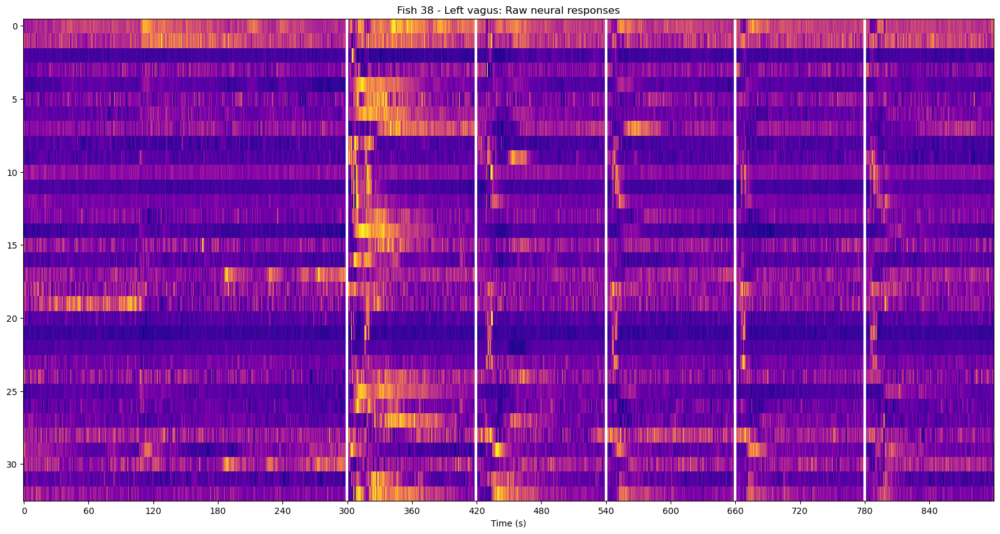

/Users/minelarinel/caImageAnalysis/caImageAnalysis/bruker_2P/voltage_output.py:22: GuessedAtParserWarning: No parser was explicitly specified, so I'm using the best available HTML parser for this system ("html.parser"). This usually isn't a problem, but if you run this code on another system, or in a different virtual environment, it may use a different parser and behave differently.

The code that caused this warning is on line 22 of the file /Users/minelarinel/caImageAnalysis/caImageAnalysis/bruker_2P/voltage_output.py. To get rid of this warning, pass the additional argument 'features="html.parser"' to the BeautifulSoup constructor.

  Bs_data = BeautifulSoup(xml)
/Users/minelarinel/mambaforge/envs/mescore/lib/python3.10/site-packages/bs4/builder/__init__.py:545: XMLParsedAsHTMLWarning: It looks like you're parsing an XML document using an HTML parser. If this really is an HTML document (maybe it's XHTML?), you can ignore or filter this warning. If it's XML, you should know that usi

Batch exists. Loading batch.pickle


/Users/minelarinel/caImageAnalysis/caImageAnalysis/bruker_2P/bruker.py:166: GuessedAtParserWarning: No parser was explicitly specified, so I'm using the best available HTML parser for this system ("html.parser"). This usually isn't a problem, but if you run this code on another system, or in a different virtual environment, it may use a different parser and behave differently.

The code that caused this warning is on line 166 of the file /Users/minelarinel/caImageAnalysis/caImageAnalysis/bruker_2P/bruker.py. To get rid of this warning, pass the additional argument 'features="html.parser"' to the BeautifulSoup constructor.

  Bs_data = BeautifulSoup(log)
/Users/minelarinel/mambaforge/envs/mescore/lib/python3.10/site-packages/bs4/builder/__init__.py:545: XMLParsedAsHTMLWarning: It looks like you're parsing an XML document using an HTML parser. If this really is an HTML document (maybe it's XHTML?), you can ignore or filter this warning. If it's XML, you should know that using an XML pars

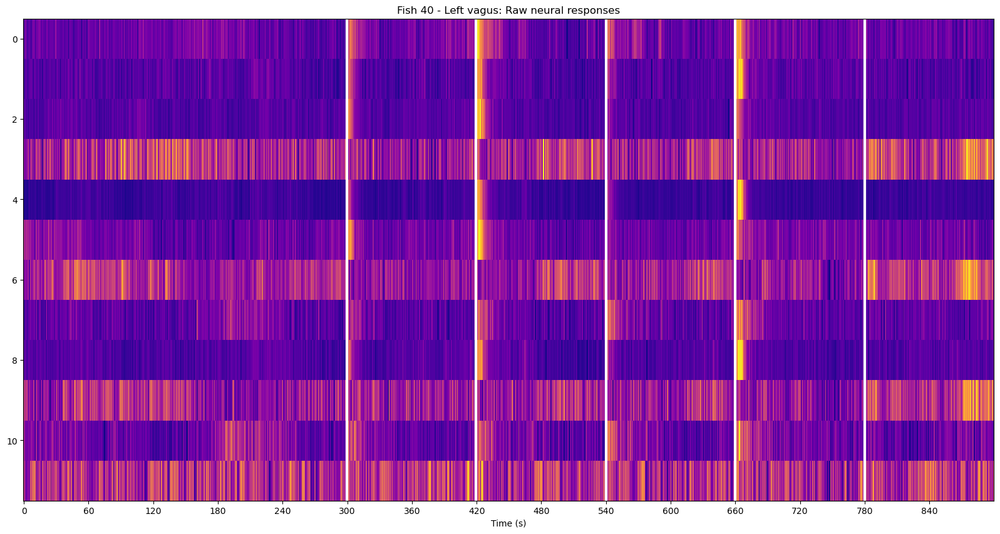

/Users/minelarinel/caImageAnalysis/caImageAnalysis/bruker_2P/voltage_output.py:22: GuessedAtParserWarning: No parser was explicitly specified, so I'm using the best available HTML parser for this system ("html.parser"). This usually isn't a problem, but if you run this code on another system, or in a different virtual environment, it may use a different parser and behave differently.

The code that caused this warning is on line 22 of the file /Users/minelarinel/caImageAnalysis/caImageAnalysis/bruker_2P/voltage_output.py. To get rid of this warning, pass the additional argument 'features="html.parser"' to the BeautifulSoup constructor.

  Bs_data = BeautifulSoup(xml)
/Users/minelarinel/mambaforge/envs/mescore/lib/python3.10/site-packages/bs4/builder/__init__.py:545: XMLParsedAsHTMLWarning: It looks like you're parsing an XML document using an HTML parser. If this really is an HTML document (maybe it's XHTML?), you can ignore or filter this warning. If it's XML, you should know that usi

Batch exists. Loading batch.pickle


/Users/minelarinel/caImageAnalysis/caImageAnalysis/bruker_2P/bruker.py:166: GuessedAtParserWarning: No parser was explicitly specified, so I'm using the best available HTML parser for this system ("html.parser"). This usually isn't a problem, but if you run this code on another system, or in a different virtual environment, it may use a different parser and behave differently.

The code that caused this warning is on line 166 of the file /Users/minelarinel/caImageAnalysis/caImageAnalysis/bruker_2P/bruker.py. To get rid of this warning, pass the additional argument 'features="html.parser"' to the BeautifulSoup constructor.

  Bs_data = BeautifulSoup(log)
/Users/minelarinel/mambaforge/envs/mescore/lib/python3.10/site-packages/bs4/builder/__init__.py:545: XMLParsedAsHTMLWarning: It looks like you're parsing an XML document using an HTML parser. If this really is an HTML document (maybe it's XHTML?), you can ignore or filter this warning. If it's XML, you should know that using an XML pars

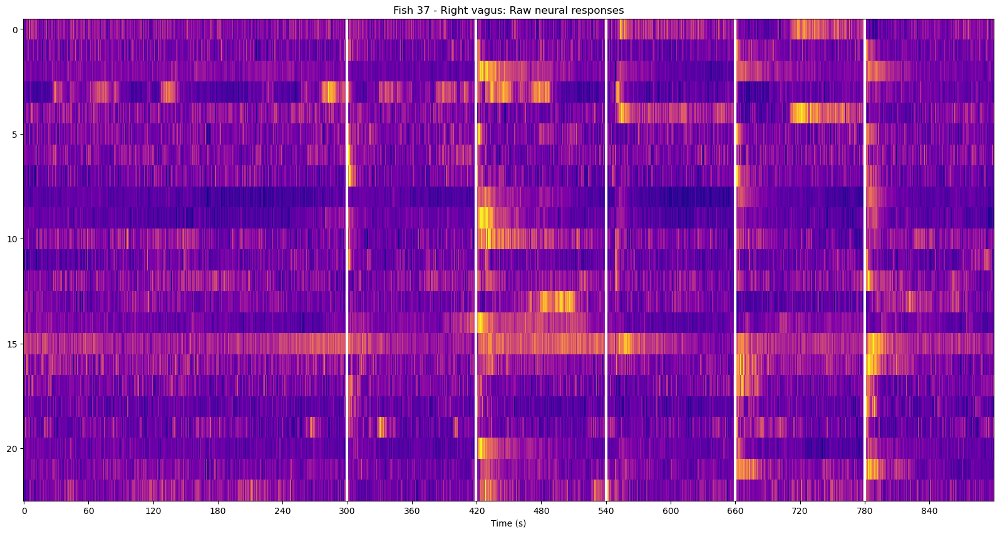

/Users/minelarinel/caImageAnalysis/caImageAnalysis/bruker_2P/voltage_output.py:22: GuessedAtParserWarning: No parser was explicitly specified, so I'm using the best available HTML parser for this system ("html.parser"). This usually isn't a problem, but if you run this code on another system, or in a different virtual environment, it may use a different parser and behave differently.

The code that caused this warning is on line 22 of the file /Users/minelarinel/caImageAnalysis/caImageAnalysis/bruker_2P/voltage_output.py. To get rid of this warning, pass the additional argument 'features="html.parser"' to the BeautifulSoup constructor.

  Bs_data = BeautifulSoup(xml)
/Users/minelarinel/mambaforge/envs/mescore/lib/python3.10/site-packages/bs4/builder/__init__.py:545: XMLParsedAsHTMLWarning: It looks like you're parsing an XML document using an HTML parser. If this really is an HTML document (maybe it's XHTML?), you can ignore or filter this warning. If it's XML, you should know that usi

Batch exists. Loading batch.pickle


/Users/minelarinel/caImageAnalysis/caImageAnalysis/bruker_2P/bruker.py:166: GuessedAtParserWarning: No parser was explicitly specified, so I'm using the best available HTML parser for this system ("html.parser"). This usually isn't a problem, but if you run this code on another system, or in a different virtual environment, it may use a different parser and behave differently.

The code that caused this warning is on line 166 of the file /Users/minelarinel/caImageAnalysis/caImageAnalysis/bruker_2P/bruker.py. To get rid of this warning, pass the additional argument 'features="html.parser"' to the BeautifulSoup constructor.

  Bs_data = BeautifulSoup(log)
/Users/minelarinel/mambaforge/envs/mescore/lib/python3.10/site-packages/bs4/builder/__init__.py:545: XMLParsedAsHTMLWarning: It looks like you're parsing an XML document using an HTML parser. If this really is an HTML document (maybe it's XHTML?), you can ignore or filter this warning. If it's XML, you should know that using an XML pars

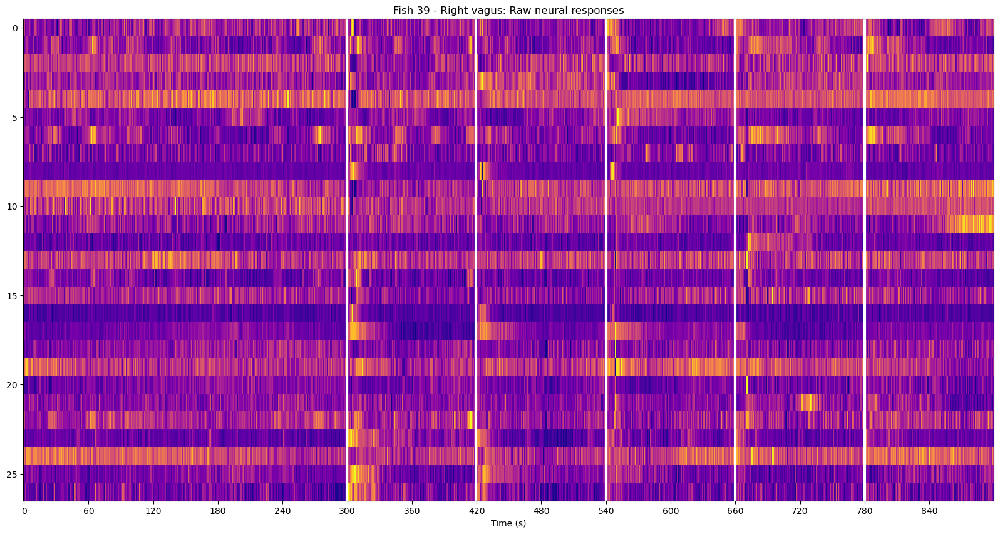

/Users/minelarinel/caImageAnalysis/caImageAnalysis/bruker_2P/voltage_output.py:22: GuessedAtParserWarning: No parser was explicitly specified, so I'm using the best available HTML parser for this system ("html.parser"). This usually isn't a problem, but if you run this code on another system, or in a different virtual environment, it may use a different parser and behave differently.

The code that caused this warning is on line 22 of the file /Users/minelarinel/caImageAnalysis/caImageAnalysis/bruker_2P/voltage_output.py. To get rid of this warning, pass the additional argument 'features="html.parser"' to the BeautifulSoup constructor.

  Bs_data = BeautifulSoup(xml)
/Users/minelarinel/mambaforge/envs/mescore/lib/python3.10/site-packages/bs4/builder/__init__.py:545: XMLParsedAsHTMLWarning: It looks like you're parsing an XML document using an HTML parser. If this really is an HTML document (maybe it's XHTML?), you can ignore or filter this warning. If it's XML, you should know that usi

Batch exists. Loading batch.pickle


/Users/minelarinel/caImageAnalysis/caImageAnalysis/bruker_2P/bruker.py:166: GuessedAtParserWarning: No parser was explicitly specified, so I'm using the best available HTML parser for this system ("html.parser"). This usually isn't a problem, but if you run this code on another system, or in a different virtual environment, it may use a different parser and behave differently.

The code that caused this warning is on line 166 of the file /Users/minelarinel/caImageAnalysis/caImageAnalysis/bruker_2P/bruker.py. To get rid of this warning, pass the additional argument 'features="html.parser"' to the BeautifulSoup constructor.

  Bs_data = BeautifulSoup(log)
/Users/minelarinel/mambaforge/envs/mescore/lib/python3.10/site-packages/bs4/builder/__init__.py:545: XMLParsedAsHTMLWarning: It looks like you're parsing an XML document using an HTML parser. If this really is an HTML document (maybe it's XHTML?), you can ignore or filter this warning. If it's XML, you should know that using an XML pars

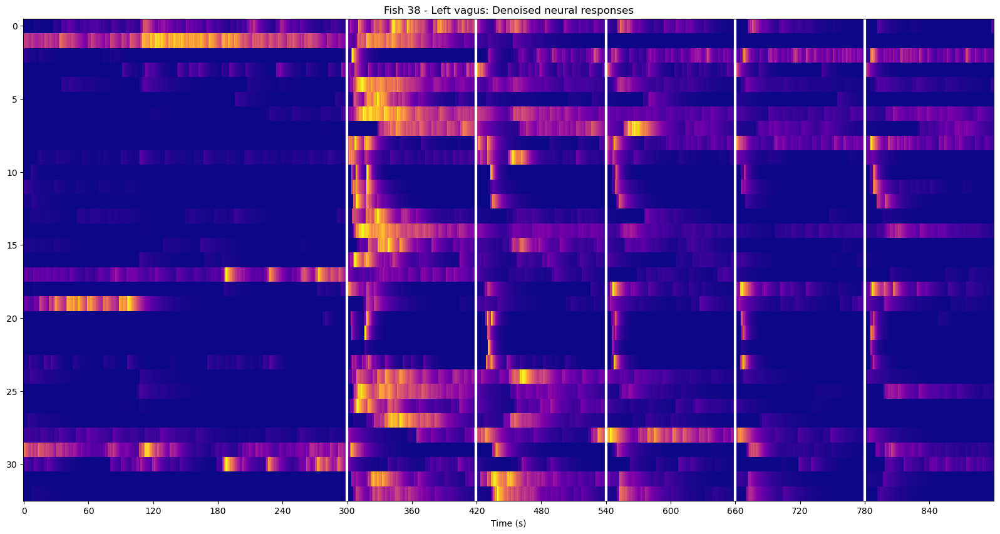

/Users/minelarinel/caImageAnalysis/caImageAnalysis/bruker_2P/voltage_output.py:22: GuessedAtParserWarning: No parser was explicitly specified, so I'm using the best available HTML parser for this system ("html.parser"). This usually isn't a problem, but if you run this code on another system, or in a different virtual environment, it may use a different parser and behave differently.

The code that caused this warning is on line 22 of the file /Users/minelarinel/caImageAnalysis/caImageAnalysis/bruker_2P/voltage_output.py. To get rid of this warning, pass the additional argument 'features="html.parser"' to the BeautifulSoup constructor.

  Bs_data = BeautifulSoup(xml)
/Users/minelarinel/mambaforge/envs/mescore/lib/python3.10/site-packages/bs4/builder/__init__.py:545: XMLParsedAsHTMLWarning: It looks like you're parsing an XML document using an HTML parser. If this really is an HTML document (maybe it's XHTML?), you can ignore or filter this warning. If it's XML, you should know that usi

Batch exists. Loading batch.pickle


/Users/minelarinel/caImageAnalysis/caImageAnalysis/bruker_2P/bruker.py:166: GuessedAtParserWarning: No parser was explicitly specified, so I'm using the best available HTML parser for this system ("html.parser"). This usually isn't a problem, but if you run this code on another system, or in a different virtual environment, it may use a different parser and behave differently.

The code that caused this warning is on line 166 of the file /Users/minelarinel/caImageAnalysis/caImageAnalysis/bruker_2P/bruker.py. To get rid of this warning, pass the additional argument 'features="html.parser"' to the BeautifulSoup constructor.

  Bs_data = BeautifulSoup(log)
/Users/minelarinel/mambaforge/envs/mescore/lib/python3.10/site-packages/bs4/builder/__init__.py:545: XMLParsedAsHTMLWarning: It looks like you're parsing an XML document using an HTML parser. If this really is an HTML document (maybe it's XHTML?), you can ignore or filter this warning. If it's XML, you should know that using an XML pars

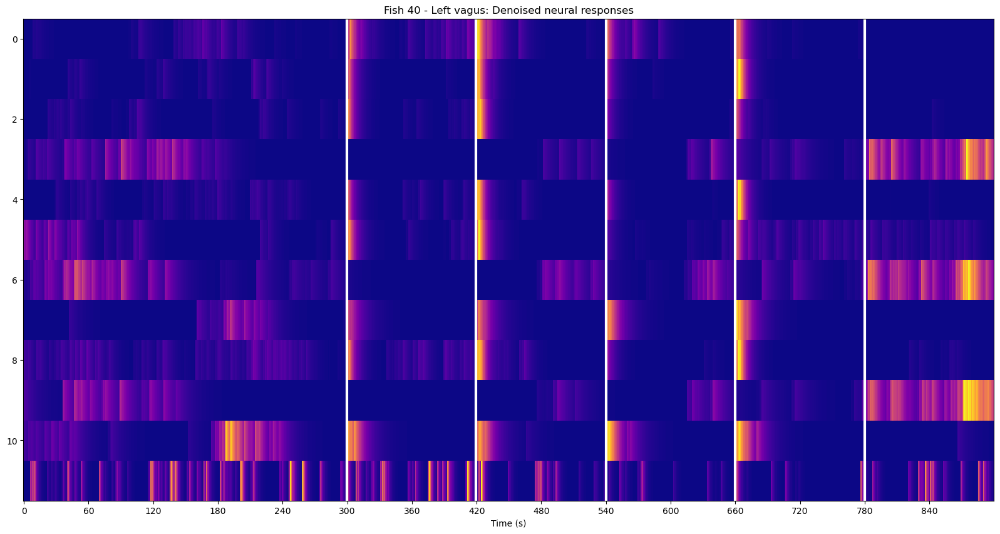

/Users/minelarinel/caImageAnalysis/caImageAnalysis/bruker_2P/voltage_output.py:22: GuessedAtParserWarning: No parser was explicitly specified, so I'm using the best available HTML parser for this system ("html.parser"). This usually isn't a problem, but if you run this code on another system, or in a different virtual environment, it may use a different parser and behave differently.

The code that caused this warning is on line 22 of the file /Users/minelarinel/caImageAnalysis/caImageAnalysis/bruker_2P/voltage_output.py. To get rid of this warning, pass the additional argument 'features="html.parser"' to the BeautifulSoup constructor.

  Bs_data = BeautifulSoup(xml)
/Users/minelarinel/mambaforge/envs/mescore/lib/python3.10/site-packages/bs4/builder/__init__.py:545: XMLParsedAsHTMLWarning: It looks like you're parsing an XML document using an HTML parser. If this really is an HTML document (maybe it's XHTML?), you can ignore or filter this warning. If it's XML, you should know that usi

Batch exists. Loading batch.pickle


/Users/minelarinel/caImageAnalysis/caImageAnalysis/bruker_2P/bruker.py:166: GuessedAtParserWarning: No parser was explicitly specified, so I'm using the best available HTML parser for this system ("html.parser"). This usually isn't a problem, but if you run this code on another system, or in a different virtual environment, it may use a different parser and behave differently.

The code that caused this warning is on line 166 of the file /Users/minelarinel/caImageAnalysis/caImageAnalysis/bruker_2P/bruker.py. To get rid of this warning, pass the additional argument 'features="html.parser"' to the BeautifulSoup constructor.

  Bs_data = BeautifulSoup(log)
/Users/minelarinel/mambaforge/envs/mescore/lib/python3.10/site-packages/bs4/builder/__init__.py:545: XMLParsedAsHTMLWarning: It looks like you're parsing an XML document using an HTML parser. If this really is an HTML document (maybe it's XHTML?), you can ignore or filter this warning. If it's XML, you should know that using an XML pars

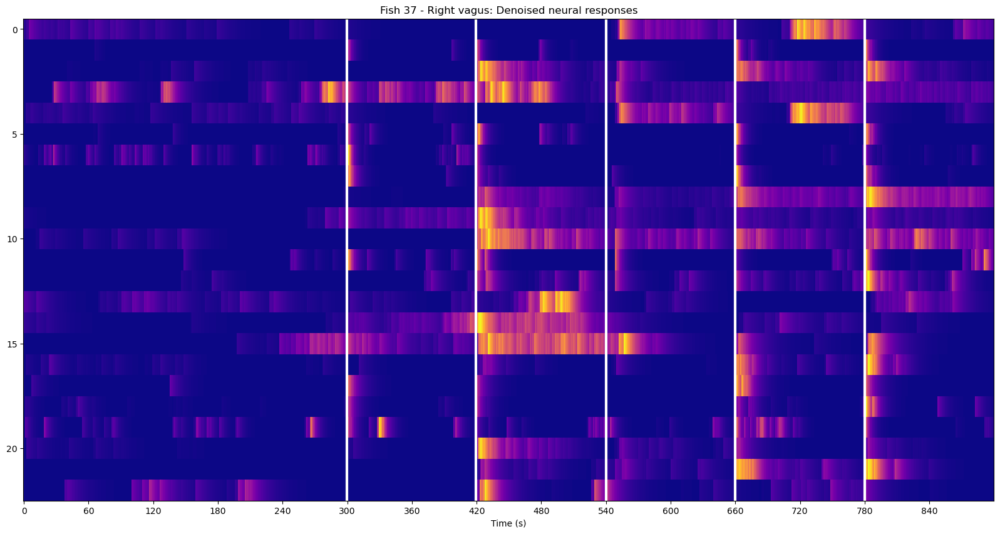

/Users/minelarinel/caImageAnalysis/caImageAnalysis/bruker_2P/voltage_output.py:22: GuessedAtParserWarning: No parser was explicitly specified, so I'm using the best available HTML parser for this system ("html.parser"). This usually isn't a problem, but if you run this code on another system, or in a different virtual environment, it may use a different parser and behave differently.

The code that caused this warning is on line 22 of the file /Users/minelarinel/caImageAnalysis/caImageAnalysis/bruker_2P/voltage_output.py. To get rid of this warning, pass the additional argument 'features="html.parser"' to the BeautifulSoup constructor.

  Bs_data = BeautifulSoup(xml)
/Users/minelarinel/mambaforge/envs/mescore/lib/python3.10/site-packages/bs4/builder/__init__.py:545: XMLParsedAsHTMLWarning: It looks like you're parsing an XML document using an HTML parser. If this really is an HTML document (maybe it's XHTML?), you can ignore or filter this warning. If it's XML, you should know that usi

Batch exists. Loading batch.pickle


/Users/minelarinel/caImageAnalysis/caImageAnalysis/bruker_2P/bruker.py:166: GuessedAtParserWarning: No parser was explicitly specified, so I'm using the best available HTML parser for this system ("html.parser"). This usually isn't a problem, but if you run this code on another system, or in a different virtual environment, it may use a different parser and behave differently.

The code that caused this warning is on line 166 of the file /Users/minelarinel/caImageAnalysis/caImageAnalysis/bruker_2P/bruker.py. To get rid of this warning, pass the additional argument 'features="html.parser"' to the BeautifulSoup constructor.

  Bs_data = BeautifulSoup(log)
/Users/minelarinel/mambaforge/envs/mescore/lib/python3.10/site-packages/bs4/builder/__init__.py:545: XMLParsedAsHTMLWarning: It looks like you're parsing an XML document using an HTML parser. If this really is an HTML document (maybe it's XHTML?), you can ignore or filter this warning. If it's XML, you should know that using an XML pars

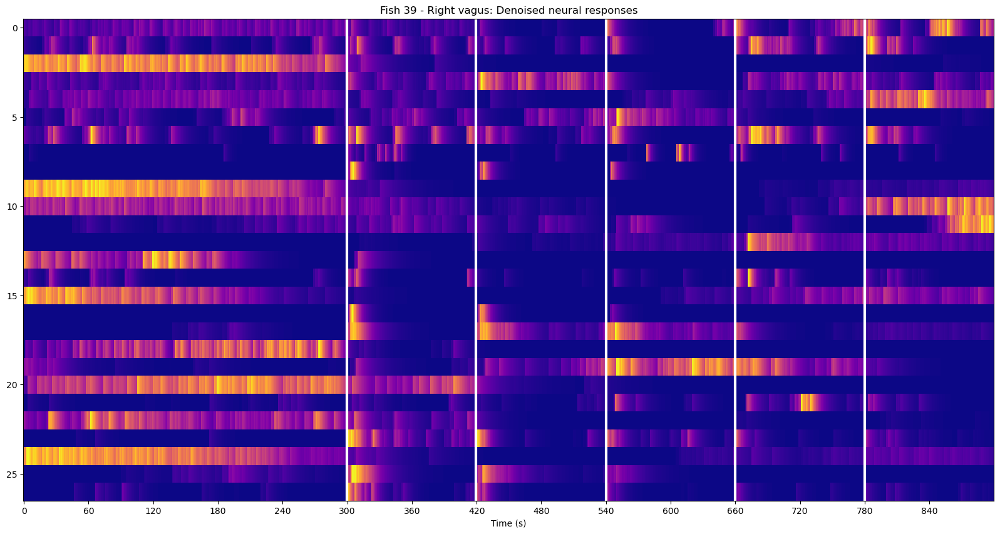

In [179]:
# Heatmaps for individual fish
for i, exp_folder in enumerate(vagalL_paths):
    traces = list()
    fish = BrukerFish(exp_folder)
    
    traces.extend([row['raw_norm_dff'] for _, row in fish.temporal_df.iterrows()])

    plot_heatmap(np.vstack(traces))
    plt.title(f'Fish {vagalL_ids[i]} - Left vagus: Raw neural responses')
    plt.show()

for i, exp_folder in enumerate(vagalR_paths):
    traces = list()
    fish = BrukerFish(exp_folder)
    
    traces.extend([row['raw_norm_dff'] for _, row in fish.temporal_df.iterrows()])

    plot_heatmap(np.vstack(traces))
    plt.title(f'Fish {vagalR_ids[i]} - Right vagus: Raw neural responses')
    plt.show()

for i, exp_folder in enumerate(vagalL_paths):
    traces = list()
    fish = BrukerFish(exp_folder)
    
    traces.extend([row['norm_dff'] for _, row in fish.temporal_df.iterrows()])

    plot_heatmap(np.vstack(traces))
    plt.title(f'Fish {vagalL_ids[i]} - Left vagus: Denoised neural responses')
    plt.show()

for i, exp_folder in enumerate(vagalR_paths):
    traces = list()
    fish = BrukerFish(exp_folder)
    
    traces.extend([row['norm_dff'] for _, row in fish.temporal_df.iterrows()])

    plot_heatmap(np.vstack(traces))
    plt.title(f'Fish {vagalR_ids[i]} - Right vagus: Denoised neural responses')
    plt.show()

In [40]:
# Raw neural traces for the left vagus
raw_norm_vol_dfs_L = list()
n_traces_per_fish_L = list()

for exp_folder in vagalL_paths:
    fish = BrukerFish(exp_folder)
    
    traces = [row['raw_norm_temporal'] for _, row in fish.temporal_df.iterrows()]
    raw_norm_vol_dfs_L.extend(traces)

    n_traces_per_fish_L.append(np.array([len(t) for t in traces]).sum())

    
raw_norm_vol_dfs_L = np.vstack(raw_norm_vol_dfs_L)

# Raw neural traces for the right vagus
raw_norm_vol_dfs_R = list()
n_traces_per_fish_R = list()

for exp_folder in vagalR_paths:
    fish = BrukerFish(exp_folder)

    traces = [row['raw_norm_temporal'] for _, row in fish.temporal_df.iterrows()]
    raw_norm_vol_dfs_R.extend(traces)

    n_traces_per_fish_R.append(np.array([len(t) for t in traces]).sum())
    
raw_norm_vol_dfs_R = np.vstack(raw_norm_vol_dfs_R)

# Denoised neural traces for the left vagus
norm_vol_dfs_L = list()

for exp_folder in vagalL_paths:
    fish = BrukerFish(exp_folder)
    norm_vol_dfs_L.extend([row['norm_temporal'] for _, row in fish.temporal_df.iterrows()])
    
norm_vol_dfs_L = np.vstack(norm_vol_dfs_L)

# Denoised neural traces for the right vagus
norm_vol_dfs_R = list()

for exp_folder in vagalR_paths:
    fish = BrukerFish(exp_folder)
    norm_vol_dfs_R.extend([row['norm_temporal'] for _, row in fish.temporal_df.iterrows()])
    
norm_vol_dfs_R = np.vstack(norm_vol_dfs_R)

/Users/minelarinel/caImageAnalysis/caImageAnalysis/bruker_2P/voltage_output.py:22: GuessedAtParserWarning: No parser was explicitly specified, so I'm using the best available HTML parser for this system ("html.parser"). This usually isn't a problem, but if you run this code on another system, or in a different virtual environment, it may use a different parser and behave differently.

The code that caused this warning is on line 22 of the file /Users/minelarinel/caImageAnalysis/caImageAnalysis/bruker_2P/voltage_output.py. To get rid of this warning, pass the additional argument 'features="html.parser"' to the BeautifulSoup constructor.

  Bs_data = BeautifulSoup(xml)
/Users/minelarinel/mambaforge/envs/mescore/lib/python3.10/site-packages/bs4/builder/__init__.py:545: XMLParsedAsHTMLWarning: It looks like you're parsing an XML document using an HTML parser. If this really is an HTML document (maybe it's XHTML?), you can ignore or filter this warning. If it's XML, you should know that usi

Batch exists. Loading batch.pickle


/Users/minelarinel/caImageAnalysis/caImageAnalysis/bruker_2P/bruker.py:166: GuessedAtParserWarning: No parser was explicitly specified, so I'm using the best available HTML parser for this system ("html.parser"). This usually isn't a problem, but if you run this code on another system, or in a different virtual environment, it may use a different parser and behave differently.

The code that caused this warning is on line 166 of the file /Users/minelarinel/caImageAnalysis/caImageAnalysis/bruker_2P/bruker.py. To get rid of this warning, pass the additional argument 'features="html.parser"' to the BeautifulSoup constructor.

  Bs_data = BeautifulSoup(log)
/Users/minelarinel/mambaforge/envs/mescore/lib/python3.10/site-packages/bs4/builder/__init__.py:545: XMLParsedAsHTMLWarning: It looks like you're parsing an XML document using an HTML parser. If this really is an HTML document (maybe it's XHTML?), you can ignore or filter this warning. If it's XML, you should know that using an XML pars

Batch exists. Loading batch.pickle


/Users/minelarinel/caImageAnalysis/caImageAnalysis/bruker_2P/bruker.py:166: GuessedAtParserWarning: No parser was explicitly specified, so I'm using the best available HTML parser for this system ("html.parser"). This usually isn't a problem, but if you run this code on another system, or in a different virtual environment, it may use a different parser and behave differently.

The code that caused this warning is on line 166 of the file /Users/minelarinel/caImageAnalysis/caImageAnalysis/bruker_2P/bruker.py. To get rid of this warning, pass the additional argument 'features="html.parser"' to the BeautifulSoup constructor.

  Bs_data = BeautifulSoup(log)
/Users/minelarinel/mambaforge/envs/mescore/lib/python3.10/site-packages/bs4/builder/__init__.py:545: XMLParsedAsHTMLWarning: It looks like you're parsing an XML document using an HTML parser. If this really is an HTML document (maybe it's XHTML?), you can ignore or filter this warning. If it's XML, you should know that using an XML pars

Batch exists. Loading batch.pickle


/Users/minelarinel/caImageAnalysis/caImageAnalysis/bruker_2P/bruker.py:166: GuessedAtParserWarning: No parser was explicitly specified, so I'm using the best available HTML parser for this system ("html.parser"). This usually isn't a problem, but if you run this code on another system, or in a different virtual environment, it may use a different parser and behave differently.

The code that caused this warning is on line 166 of the file /Users/minelarinel/caImageAnalysis/caImageAnalysis/bruker_2P/bruker.py. To get rid of this warning, pass the additional argument 'features="html.parser"' to the BeautifulSoup constructor.

  Bs_data = BeautifulSoup(log)
/Users/minelarinel/mambaforge/envs/mescore/lib/python3.10/site-packages/bs4/builder/__init__.py:545: XMLParsedAsHTMLWarning: It looks like you're parsing an XML document using an HTML parser. If this really is an HTML document (maybe it's XHTML?), you can ignore or filter this warning. If it's XML, you should know that using an XML pars

Batch exists. Loading batch.pickle


/Users/minelarinel/caImageAnalysis/caImageAnalysis/bruker_2P/bruker.py:166: GuessedAtParserWarning: No parser was explicitly specified, so I'm using the best available HTML parser for this system ("html.parser"). This usually isn't a problem, but if you run this code on another system, or in a different virtual environment, it may use a different parser and behave differently.

The code that caused this warning is on line 166 of the file /Users/minelarinel/caImageAnalysis/caImageAnalysis/bruker_2P/bruker.py. To get rid of this warning, pass the additional argument 'features="html.parser"' to the BeautifulSoup constructor.

  Bs_data = BeautifulSoup(log)
/Users/minelarinel/mambaforge/envs/mescore/lib/python3.10/site-packages/bs4/builder/__init__.py:545: XMLParsedAsHTMLWarning: It looks like you're parsing an XML document using an HTML parser. If this really is an HTML document (maybe it's XHTML?), you can ignore or filter this warning. If it's XML, you should know that using an XML pars

Batch exists. Loading batch.pickle


/Users/minelarinel/caImageAnalysis/caImageAnalysis/bruker_2P/bruker.py:166: GuessedAtParserWarning: No parser was explicitly specified, so I'm using the best available HTML parser for this system ("html.parser"). This usually isn't a problem, but if you run this code on another system, or in a different virtual environment, it may use a different parser and behave differently.

The code that caused this warning is on line 166 of the file /Users/minelarinel/caImageAnalysis/caImageAnalysis/bruker_2P/bruker.py. To get rid of this warning, pass the additional argument 'features="html.parser"' to the BeautifulSoup constructor.

  Bs_data = BeautifulSoup(log)
/Users/minelarinel/mambaforge/envs/mescore/lib/python3.10/site-packages/bs4/builder/__init__.py:545: XMLParsedAsHTMLWarning: It looks like you're parsing an XML document using an HTML parser. If this really is an HTML document (maybe it's XHTML?), you can ignore or filter this warning. If it's XML, you should know that using an XML pars

Batch exists. Loading batch.pickle


/Users/minelarinel/caImageAnalysis/caImageAnalysis/bruker_2P/bruker.py:166: GuessedAtParserWarning: No parser was explicitly specified, so I'm using the best available HTML parser for this system ("html.parser"). This usually isn't a problem, but if you run this code on another system, or in a different virtual environment, it may use a different parser and behave differently.

The code that caused this warning is on line 166 of the file /Users/minelarinel/caImageAnalysis/caImageAnalysis/bruker_2P/bruker.py. To get rid of this warning, pass the additional argument 'features="html.parser"' to the BeautifulSoup constructor.

  Bs_data = BeautifulSoup(log)
/Users/minelarinel/mambaforge/envs/mescore/lib/python3.10/site-packages/bs4/builder/__init__.py:545: XMLParsedAsHTMLWarning: It looks like you're parsing an XML document using an HTML parser. If this really is an HTML document (maybe it's XHTML?), you can ignore or filter this warning. If it's XML, you should know that using an XML pars

Batch exists. Loading batch.pickle


/Users/minelarinel/caImageAnalysis/caImageAnalysis/bruker_2P/bruker.py:166: GuessedAtParserWarning: No parser was explicitly specified, so I'm using the best available HTML parser for this system ("html.parser"). This usually isn't a problem, but if you run this code on another system, or in a different virtual environment, it may use a different parser and behave differently.

The code that caused this warning is on line 166 of the file /Users/minelarinel/caImageAnalysis/caImageAnalysis/bruker_2P/bruker.py. To get rid of this warning, pass the additional argument 'features="html.parser"' to the BeautifulSoup constructor.

  Bs_data = BeautifulSoup(log)
/Users/minelarinel/mambaforge/envs/mescore/lib/python3.10/site-packages/bs4/builder/__init__.py:545: XMLParsedAsHTMLWarning: It looks like you're parsing an XML document using an HTML parser. If this really is an HTML document (maybe it's XHTML?), you can ignore or filter this warning. If it's XML, you should know that using an XML pars

Batch exists. Loading batch.pickle


/Users/minelarinel/caImageAnalysis/caImageAnalysis/bruker_2P/bruker.py:166: GuessedAtParserWarning: No parser was explicitly specified, so I'm using the best available HTML parser for this system ("html.parser"). This usually isn't a problem, but if you run this code on another system, or in a different virtual environment, it may use a different parser and behave differently.

The code that caused this warning is on line 166 of the file /Users/minelarinel/caImageAnalysis/caImageAnalysis/bruker_2P/bruker.py. To get rid of this warning, pass the additional argument 'features="html.parser"' to the BeautifulSoup constructor.

  Bs_data = BeautifulSoup(log)
/Users/minelarinel/mambaforge/envs/mescore/lib/python3.10/site-packages/bs4/builder/__init__.py:545: XMLParsedAsHTMLWarning: It looks like you're parsing an XML document using an HTML parser. If this really is an HTML document (maybe it's XHTML?), you can ignore or filter this warning. If it's XML, you should know that using an XML pars

Batch exists. Loading batch.pickle


/Users/minelarinel/caImageAnalysis/caImageAnalysis/bruker_2P/bruker.py:166: GuessedAtParserWarning: No parser was explicitly specified, so I'm using the best available HTML parser for this system ("html.parser"). This usually isn't a problem, but if you run this code on another system, or in a different virtual environment, it may use a different parser and behave differently.

The code that caused this warning is on line 166 of the file /Users/minelarinel/caImageAnalysis/caImageAnalysis/bruker_2P/bruker.py. To get rid of this warning, pass the additional argument 'features="html.parser"' to the BeautifulSoup constructor.

  Bs_data = BeautifulSoup(log)
/Users/minelarinel/mambaforge/envs/mescore/lib/python3.10/site-packages/bs4/builder/__init__.py:545: XMLParsedAsHTMLWarning: It looks like you're parsing an XML document using an HTML parser. If this really is an HTML document (maybe it's XHTML?), you can ignore or filter this warning. If it's XML, you should know that using an XML pars

Batch exists. Loading batch.pickle


/Users/minelarinel/caImageAnalysis/caImageAnalysis/bruker_2P/bruker.py:166: GuessedAtParserWarning: No parser was explicitly specified, so I'm using the best available HTML parser for this system ("html.parser"). This usually isn't a problem, but if you run this code on another system, or in a different virtual environment, it may use a different parser and behave differently.

The code that caused this warning is on line 166 of the file /Users/minelarinel/caImageAnalysis/caImageAnalysis/bruker_2P/bruker.py. To get rid of this warning, pass the additional argument 'features="html.parser"' to the BeautifulSoup constructor.

  Bs_data = BeautifulSoup(log)
/Users/minelarinel/mambaforge/envs/mescore/lib/python3.10/site-packages/bs4/builder/__init__.py:545: XMLParsedAsHTMLWarning: It looks like you're parsing an XML document using an HTML parser. If this really is an HTML document (maybe it's XHTML?), you can ignore or filter this warning. If it's XML, you should know that using an XML pars

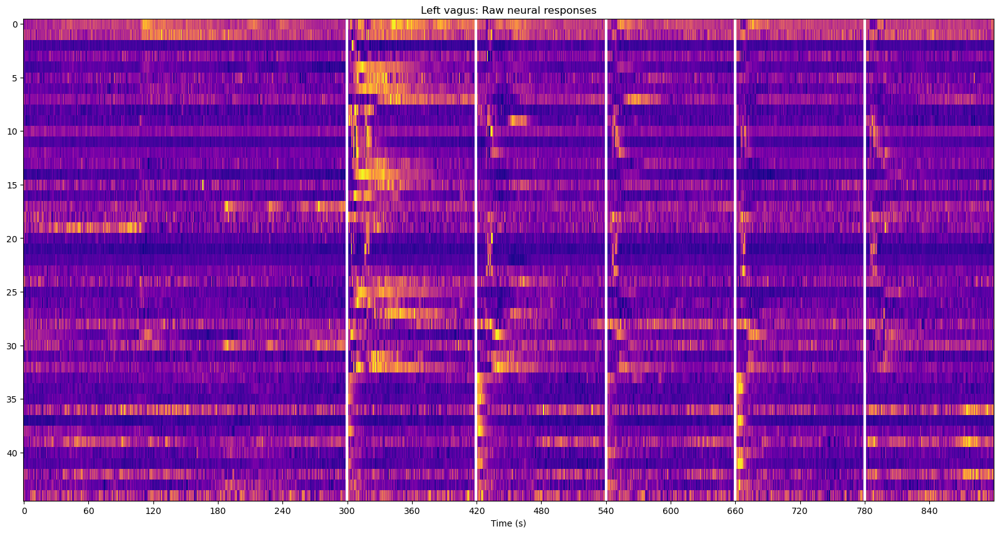

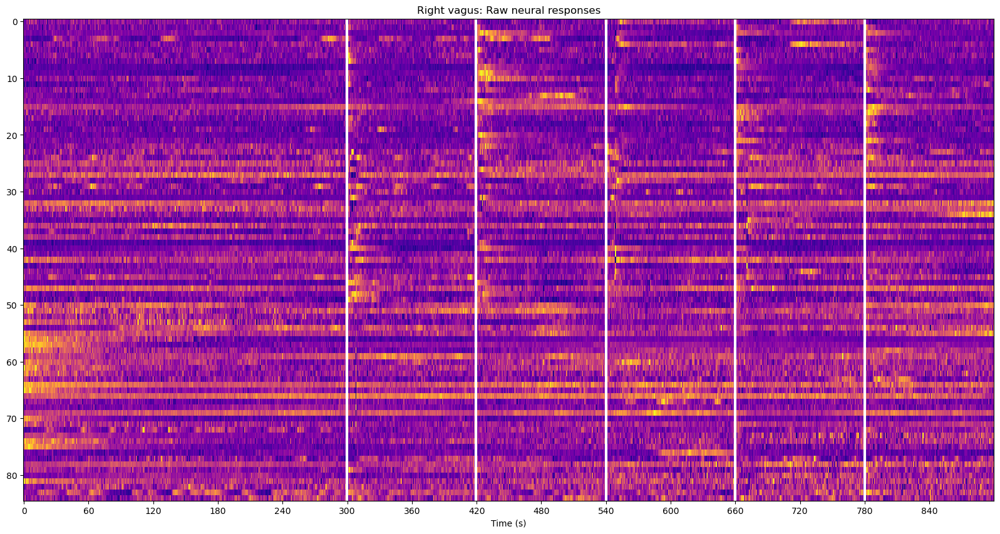

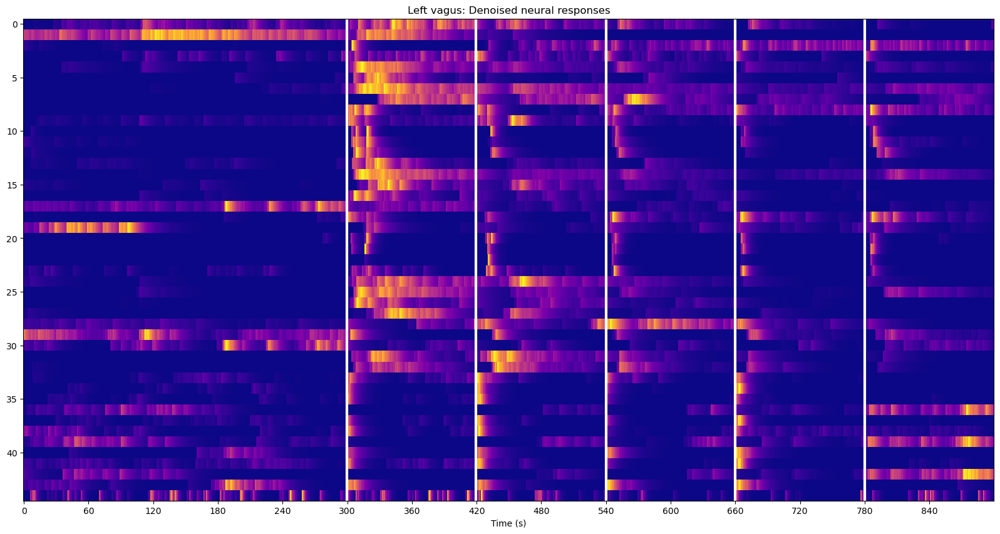

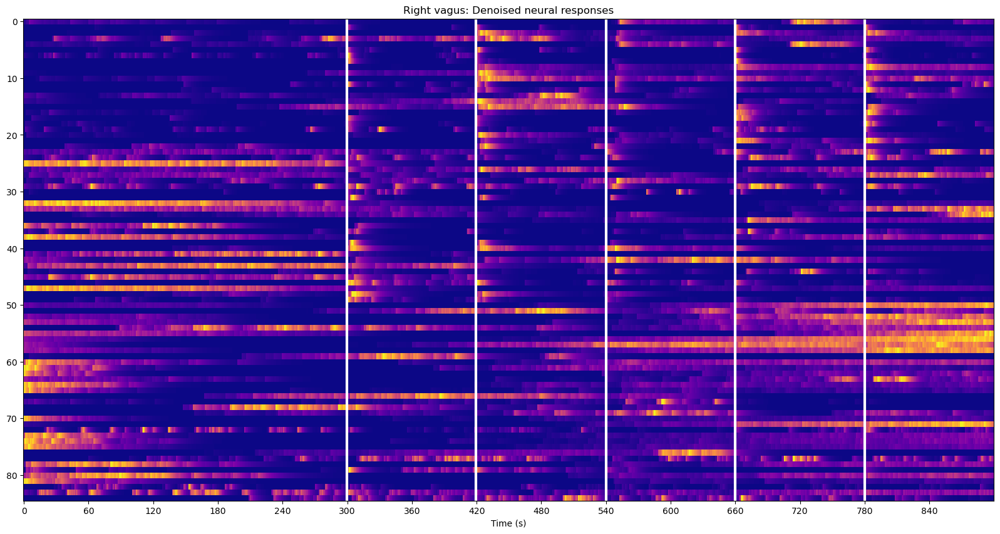

In [7]:
# Plot the combined dataframes as heatmaps
plot_heatmap(raw_norm_vol_dfs_L)
plt.title('Left vagus: Raw neural responses')

plot_heatmap(raw_norm_vol_dfs_R)
plt.title('Right vagus: Raw neural responses')

plot_heatmap(norm_vol_dfs_L)
plt.title('Left vagus: Denoised neural responses')

plot_heatmap(norm_vol_dfs_R)
plt.title('Right vagus: Denoised neural responses')

plt.show()

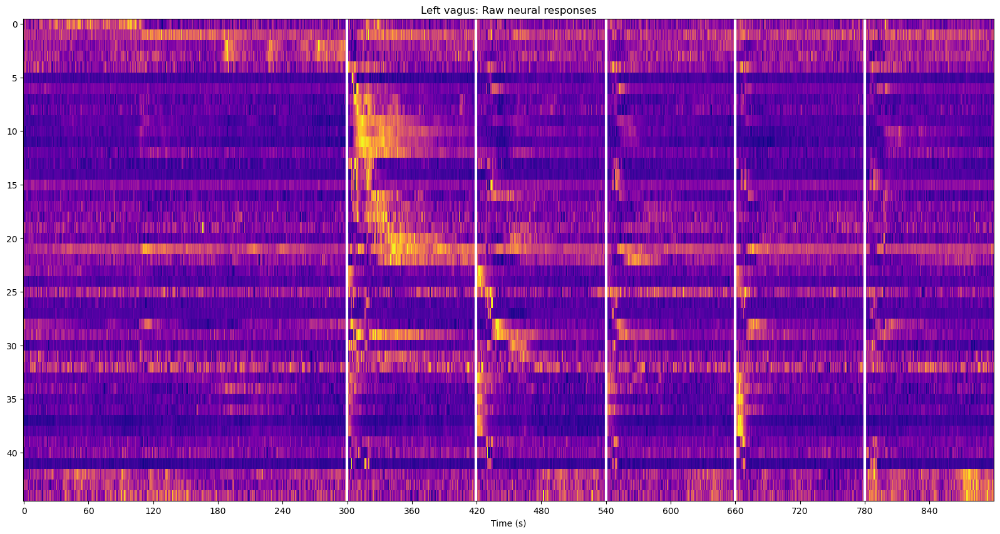

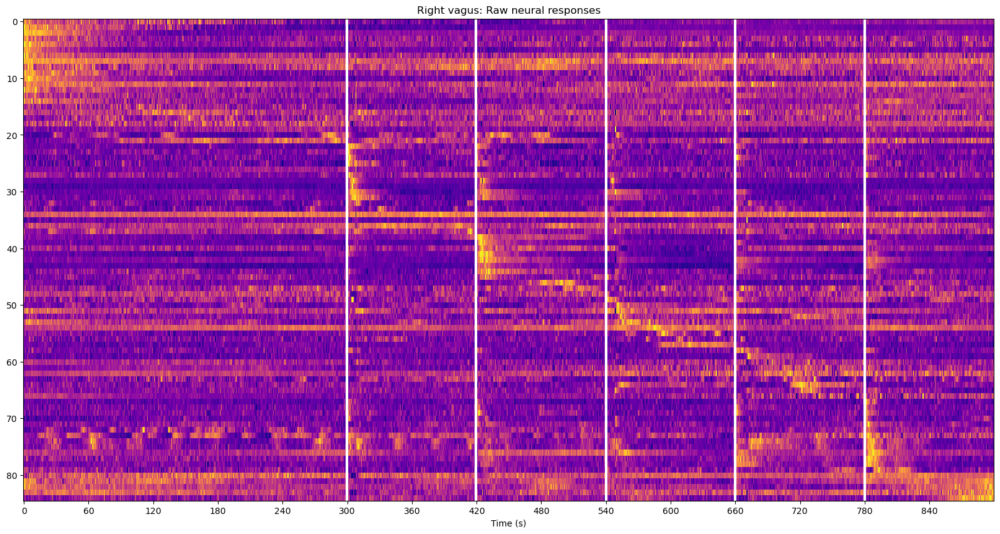

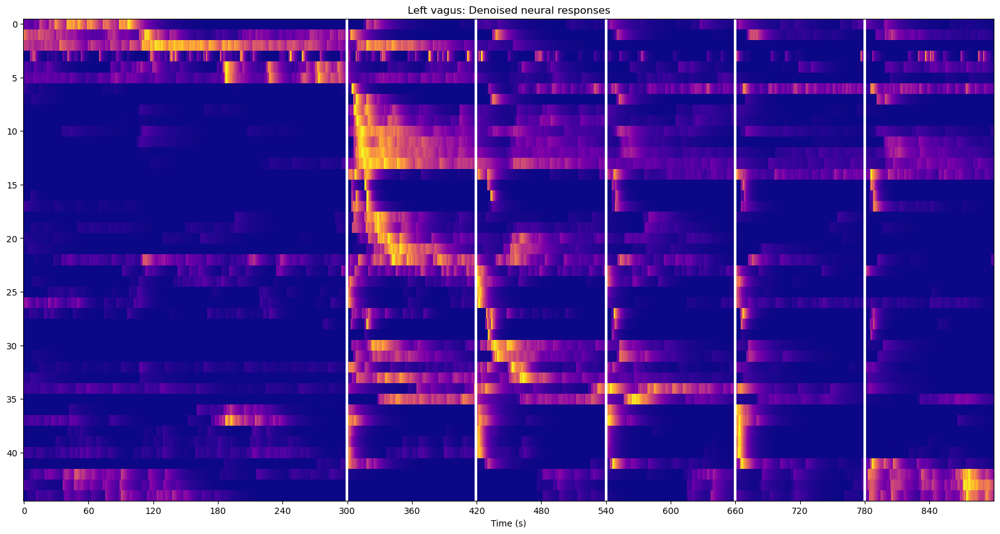

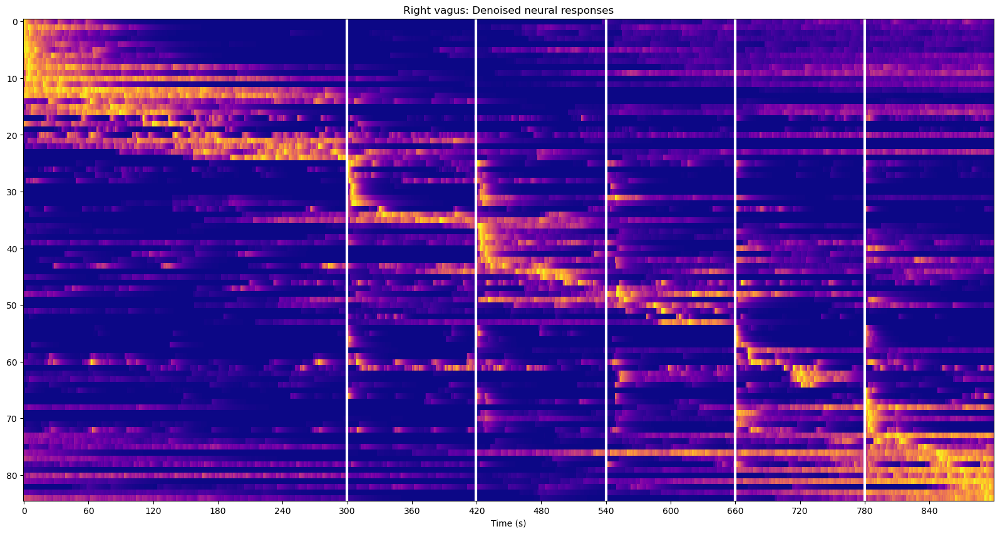

In [7]:
# Sort the neural traces by their peak response
sorted_raw_norm_vol_dfs_L = sort_by_peak(raw_norm_vol_dfs_L)
plot_heatmap(sorted_raw_norm_vol_dfs_L)
plt.title('Left vagus: Raw neural responses')
plt.savefig(os.path.join(data_folder, 'figures', "raw_left_glucose_vagal_heatmap_sorted_by_peak.pdf"), transparent=True, bbox_inches="tight")

raw_sorted_norm_vol_dfs_R = sort_by_peak(raw_norm_vol_dfs_R)
plot_heatmap(raw_sorted_norm_vol_dfs_R)
plt.title('Right vagus: Raw neural responses')
plt.savefig(os.path.join(data_folder, 'figures', "raw_right_glucose_vagal_heatmap_sorted_by_peak.pdf"), transparent=True, bbox_inches="tight")

sorted_norm_vol_dfs_L = sort_by_peak(norm_vol_dfs_L)
plot_heatmap(sorted_norm_vol_dfs_L)
plt.title('Left vagus: Denoised neural responses')
plt.savefig(os.path.join(data_folder, 'figures', "denoised_left_glucose_vagal_heatmap_sorted_by_peak.pdf"), transparent=True, bbox_inches="tight")

sorted_norm_vol_dfs_R = sort_by_peak(norm_vol_dfs_R)
plot_heatmap(sorted_norm_vol_dfs_R)
plt.title('Right vagus: Denoised neural responses')
plt.savefig(os.path.join(data_folder, 'figures', "denoised_right_glucose_vagal_heatmap_sorted_by_peak.pdf"), transparent=True, bbox_inches="tight")

plt.show()

In [8]:
n_traces_per_fish_L

[33, 12]

In [9]:
n_traces_per_fish_R

[23, 27, 35]

## Clustering

### Fish-specific clustering

Text(0.5, 1.0, 'Right vagus: t-SNE on denoised data')

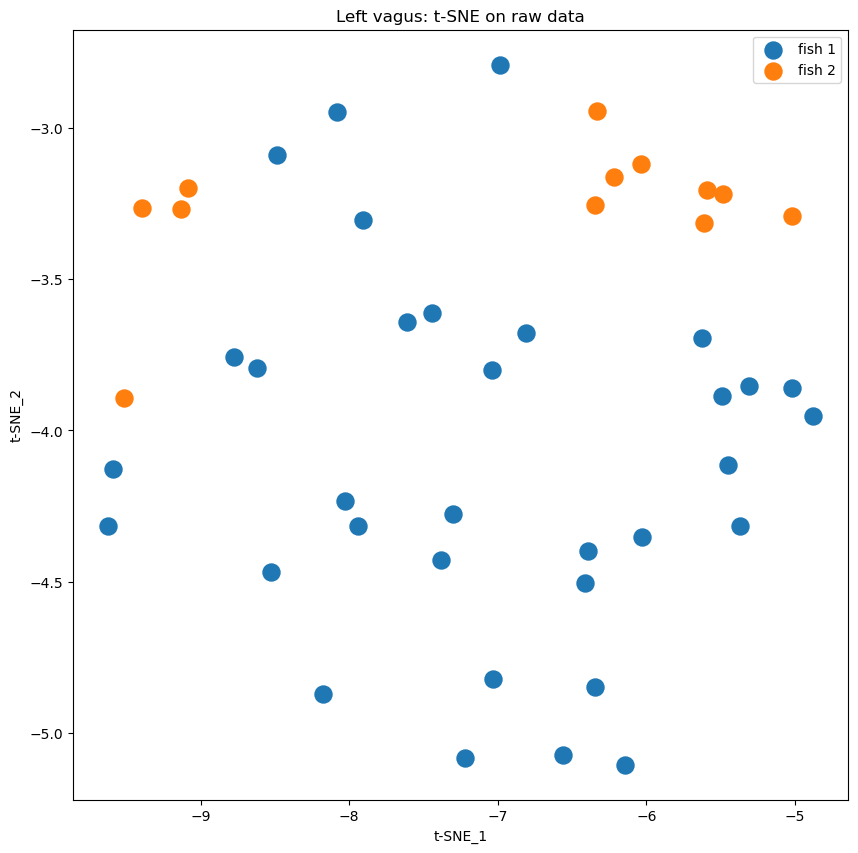

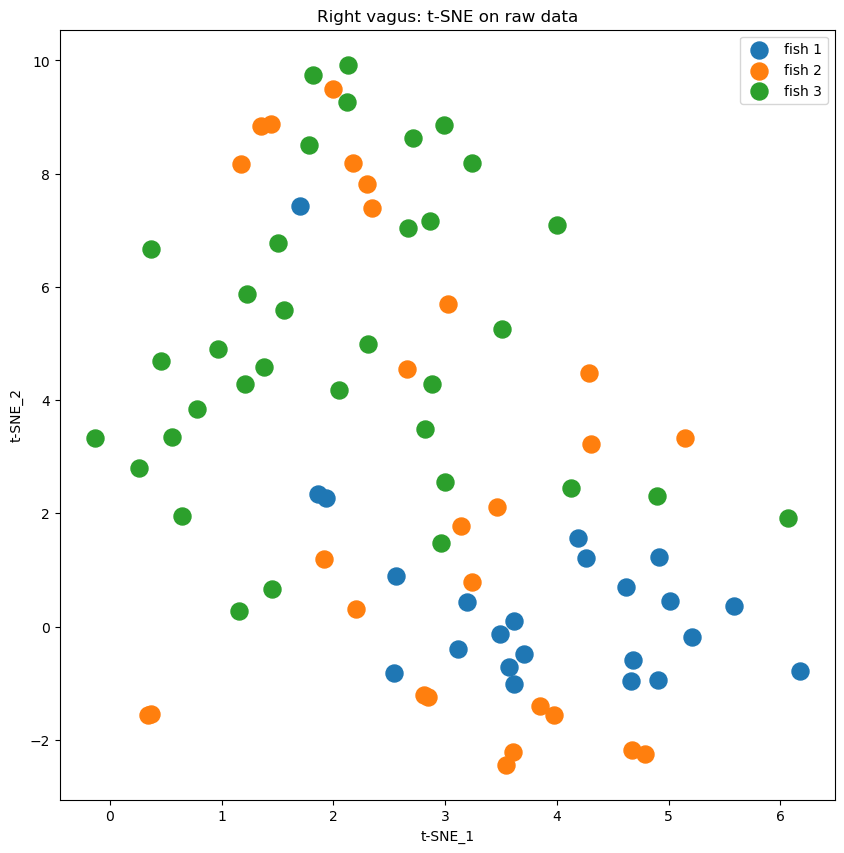

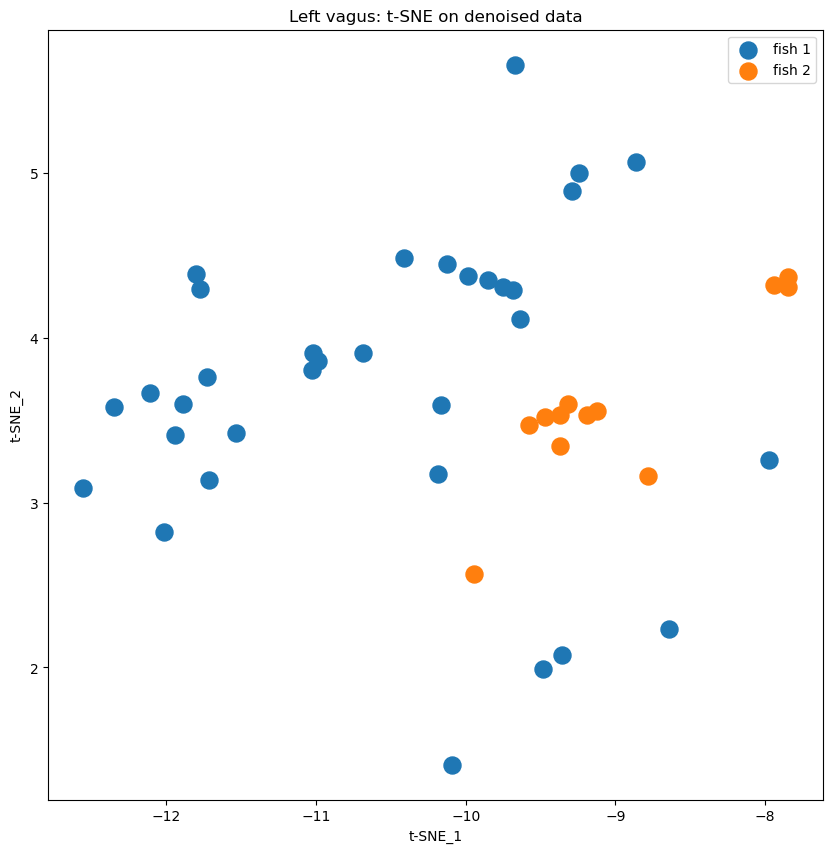

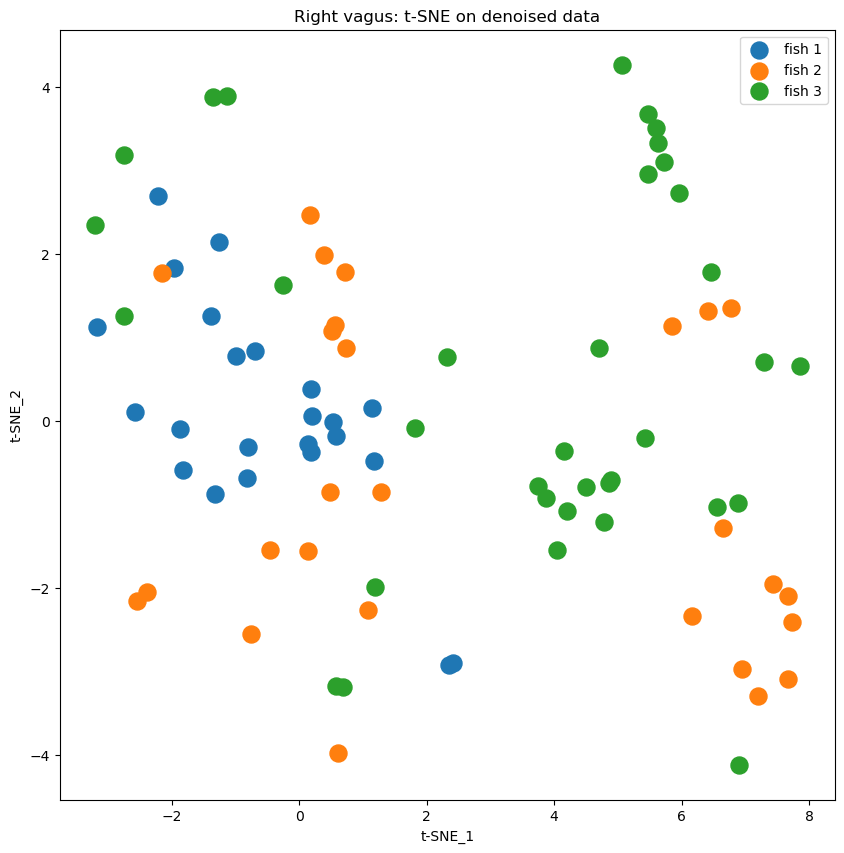

In [14]:
from sklearn.manifold import TSNE

# perform t-SNE dimentionality reduction
# t-SNE relies or random number generation, so we fix random_state to have same result each time we run the code
X_embedded = TSNE(n_components=2, learning_rate='auto', init='random', random_state=1113).fit_transform(raw_norm_vol_dfs_L)

plt.figure(figsize=(10, 10))

# plot t-SNE embedding in two-dimentional space
final_trace_indices_L = np.cumsum(n_traces_per_fish_L)  # indices of the final neural traces of each fish
for n_fish, n_traces in enumerate(final_trace_indices_L):
    if n_fish == 0:
        tsnes_x = X_embedded[:n_traces, 0]
        tsnes_y = X_embedded[:n_traces, 1]
        plt.scatter(tsnes_x, tsnes_y, label=f'fish {n_fish+1}', s=150)

    else:
        tsnes_x = X_embedded[final_trace_indices_L[n_fish-1]:n_traces, 0]
        tsnes_y = X_embedded[final_trace_indices_L[n_fish-1]:n_traces, 1]
        plt.scatter(tsnes_x, tsnes_y, label=f'fish {n_fish+1}', s=150)

plt.legend()
plt.xlabel('t-SNE_1')
plt.ylabel('t-SNE_2')
plt.title('Left vagus: t-SNE on raw data')


# perform t-SNE dimentionality reduction
# t-SNE relies or random number generation, so we fix random_state to have same result each time we run the code
X_embedded = TSNE(n_components=2, learning_rate='auto', init='random', random_state=1113).fit_transform(raw_norm_vol_dfs_R)

plt.figure(figsize=(10, 10))

# plot t-SNE embedding in two-dimentional space
final_trace_indices_R = np.cumsum(n_traces_per_fish_R)  # indices of the final neural traces of each fish
for n_fish, n_traces in enumerate(final_trace_indices_R):
    if n_fish == 0:
        tsnes_x = X_embedded[:n_traces, 0]
        tsnes_y = X_embedded[:n_traces, 1]
        plt.scatter(tsnes_x, tsnes_y, label=f'fish {n_fish+1}', s=150)

    else:
        tsnes_x = X_embedded[final_trace_indices_R[n_fish-1]:n_traces, 0]
        tsnes_y = X_embedded[final_trace_indices_R[n_fish-1]:n_traces, 1]
        plt.scatter(tsnes_x, tsnes_y, label=f'fish {n_fish+1}', s=150)

plt.legend()
plt.xlabel('t-SNE_1')
plt.ylabel('t-SNE_2')
plt.title('Right vagus: t-SNE on raw data')


# perform t-SNE dimentionality reduction
# t-SNE relies or random number generation, so we fix random_state to have same result each time we run the code
X_embedded = TSNE(n_components=2, learning_rate='auto', init='random', random_state=1113).fit_transform(norm_vol_dfs_L)

plt.figure(figsize=(10, 10))

# plot t-SNE embedding in two-dimentional space
final_trace_indices_L = np.cumsum(n_traces_per_fish_L)  # indices of the final neural traces of each fish
for n_fish, n_traces in enumerate(final_trace_indices_L):
    if n_fish == 0:
        tsnes_x = X_embedded[:n_traces, 0]
        tsnes_y = X_embedded[:n_traces, 1]
        plt.scatter(tsnes_x, tsnes_y, label=f'fish {n_fish+1}', s=150)

    else:
        tsnes_x = X_embedded[final_trace_indices_L[n_fish-1]:n_traces, 0]
        tsnes_y = X_embedded[final_trace_indices_L[n_fish-1]:n_traces, 1]
        plt.scatter(tsnes_x, tsnes_y, label=f'fish {n_fish+1}', s=150)

plt.legend()
plt.xlabel('t-SNE_1')
plt.ylabel('t-SNE_2')
plt.title('Left vagus: t-SNE on denoised data')


# perform t-SNE dimentionality reduction
# t-SNE relies or random number generation, so we fix random_state to have same result each time we run the code
X_embedded = TSNE(n_components=2, learning_rate='auto', init='random', random_state=1113).fit_transform(norm_vol_dfs_R)

plt.figure(figsize=(10, 10))

# plot t-SNE embedding in two-dimentional space
final_trace_indices_R = np.cumsum(n_traces_per_fish_R)  # indices of the final neural traces of each fish
for n_fish, n_traces in enumerate(final_trace_indices_R):
    if n_fish == 0:
        tsnes_x = X_embedded[:n_traces, 0]
        tsnes_y = X_embedded[:n_traces, 1]
        plt.scatter(tsnes_x, tsnes_y, label=f'fish {n_fish+1}', s=150)

    else:
        tsnes_x = X_embedded[final_trace_indices_R[n_fish-1]:n_traces, 0]
        tsnes_y = X_embedded[final_trace_indices_R[n_fish-1]:n_traces, 1]
        plt.scatter(tsnes_x, tsnes_y, label=f'fish {n_fish+1}', s=150)

plt.legend()
plt.xlabel('t-SNE_1')
plt.ylabel('t-SNE_2')
plt.title('Right vagus: t-SNE on denoised data')

/Users/minelarinel/mambaforge/envs/mescore/lib/python3.10/site-packages/umap/umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")
/Users/minelarinel/mambaforge/envs/mescore/lib/python3.10/site-packages/umap/umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")
/Users/minelarinel/mambaforge/envs/mescore/lib/python3.10/site-packages/umap/umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")
/Users/minelarinel/mambaforge/envs/mescore/lib/python3.10/site-packages/umap/umap_.py:1943: UserWarning

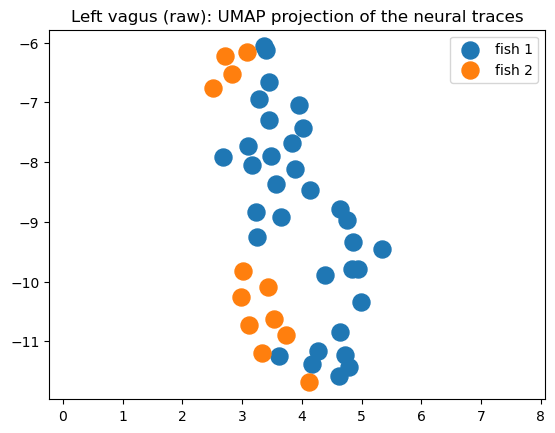

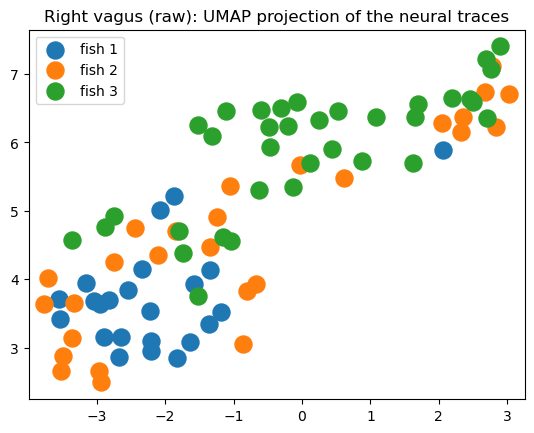

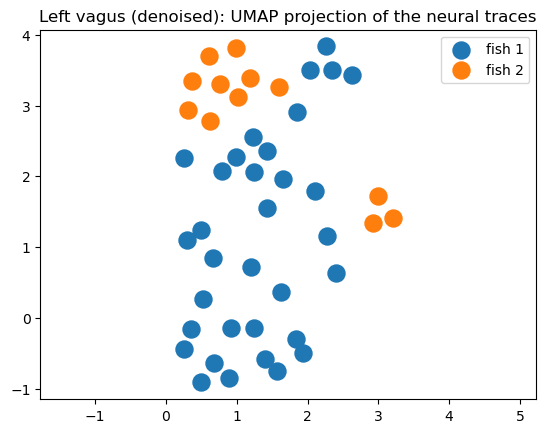

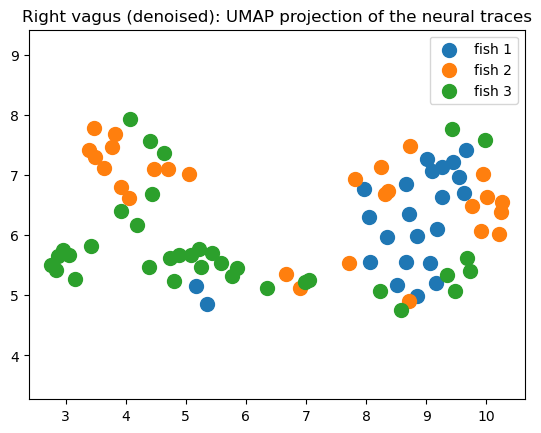

In [16]:
import umap
from sklearn.preprocessing import StandardScaler
import seaborn as sns

reducer = umap.UMAP(random_state=1113)
scaled_data = StandardScaler().fit_transform(raw_norm_vol_dfs_L)
embedding = reducer.fit_transform(scaled_data)
embedding.shape

plt.figure()

# plot UMAP embedding in two-dimentional space
final_trace_indices_L = np.cumsum(n_traces_per_fish_L)  # indices of the final neural traces of each fish
for n_fish, n_traces in enumerate(final_trace_indices_L):
    if n_fish == 0:
        umap_x = embedding[:n_traces, 0]
        umap_y = embedding[:n_traces, 1]
        plt.scatter(umap_x, umap_y, label=f'fish {n_fish+1}', s=150)

    else:
        umap_x = embedding[final_trace_indices_L[n_fish-1]:n_traces, 0]
        umap_y = embedding[final_trace_indices_L[n_fish-1]:n_traces, 1]
        plt.scatter(umap_x, umap_y, label=f'fish {n_fish+1}', s=150)

plt.gca().set_aspect('equal', 'datalim')
plt.title('Left vagus (raw): UMAP projection of the neural traces')
plt.legend()
plt.grid(visible=False)


reducer = umap.UMAP(random_state=1113)
scaled_data = StandardScaler().fit_transform(raw_norm_vol_dfs_R)
embedding = reducer.fit_transform(scaled_data)
embedding.shape

plt.figure()

# plot UMAP embedding in two-dimentional space
final_trace_indices_R = np.cumsum(n_traces_per_fish_R)  # indices of the final neural traces of each fish
for n_fish, n_traces in enumerate(final_trace_indices_R):
    if n_fish == 0:
        umap_x = embedding[:n_traces, 0]
        umap_y = embedding[:n_traces, 1]
        plt.scatter(umap_x, umap_y, label=f'fish {n_fish+1}', s=150)

    else:
        umap_x = embedding[final_trace_indices_R[n_fish-1]:n_traces, 0]
        umap_y = embedding[final_trace_indices_R[n_fish-1]:n_traces, 1]
        plt.scatter(umap_x, umap_y, label=f'fish {n_fish+1}', s=150)

plt.gca().set_aspect('equal', 'datalim')
plt.title('Right vagus (raw): UMAP projection of the neural traces')
plt.legend()
plt.grid(visible=False)


reducer = umap.UMAP(random_state=1113)
scaled_data = StandardScaler().fit_transform(norm_vol_dfs_L)
embedding = reducer.fit_transform(scaled_data)
embedding.shape

plt.figure()

# plot UMAP embedding in two-dimentional space
final_trace_indices_L = np.cumsum(n_traces_per_fish_L)  # indices of the final neural traces of each fish
for n_fish, n_traces in enumerate(final_trace_indices_L):
    if n_fish == 0:
        umap_x = embedding[:n_traces, 0]
        umap_y = embedding[:n_traces, 1]
        plt.scatter(umap_x, umap_y, label=f'fish {n_fish+1}', s=150)

    else:
        umap_x = embedding[final_trace_indices_L[n_fish-1]:n_traces, 0]
        umap_y = embedding[final_trace_indices_L[n_fish-1]:n_traces, 1]
        plt.scatter(umap_x, umap_y, label=f'fish {n_fish+1}', s=150)

plt.gca().set_aspect('equal', 'datalim')
plt.title('Left vagus (denoised): UMAP projection of the neural traces')
plt.legend()
plt.grid(visible=False)


reducer = umap.UMAP(random_state=1113)
scaled_data = StandardScaler().fit_transform(norm_vol_dfs_R)
embedding = reducer.fit_transform(scaled_data)
embedding.shape

plt.figure()

# plot UMAP embedding in two-dimentional space
final_trace_indices_R = np.cumsum(n_traces_per_fish_R)  # indices of the final neural traces of each fish
for n_fish, n_traces in enumerate(final_trace_indices_R):
    if n_fish == 0:
        umap_x = embedding[:n_traces, 0]
        umap_y = embedding[:n_traces, 1]
        plt.scatter(umap_x, umap_y, label=f'fish {n_fish+1}', s=100)

    else:
        umap_x = embedding[final_trace_indices_R[n_fish-1]:n_traces, 0]
        umap_y = embedding[final_trace_indices_R[n_fish-1]:n_traces, 1]
        plt.scatter(umap_x, umap_y, label=f'fish {n_fish+1}', s=100)

plt.gca().set_aspect('equal', 'datalim')
plt.title('Right vagus (denoised): UMAP projection of the neural traces')
plt.legend()
plt.grid(visible=False)

### Side-specific clustering

Text(0.5, 1.0, 't-SNE on denoised data')

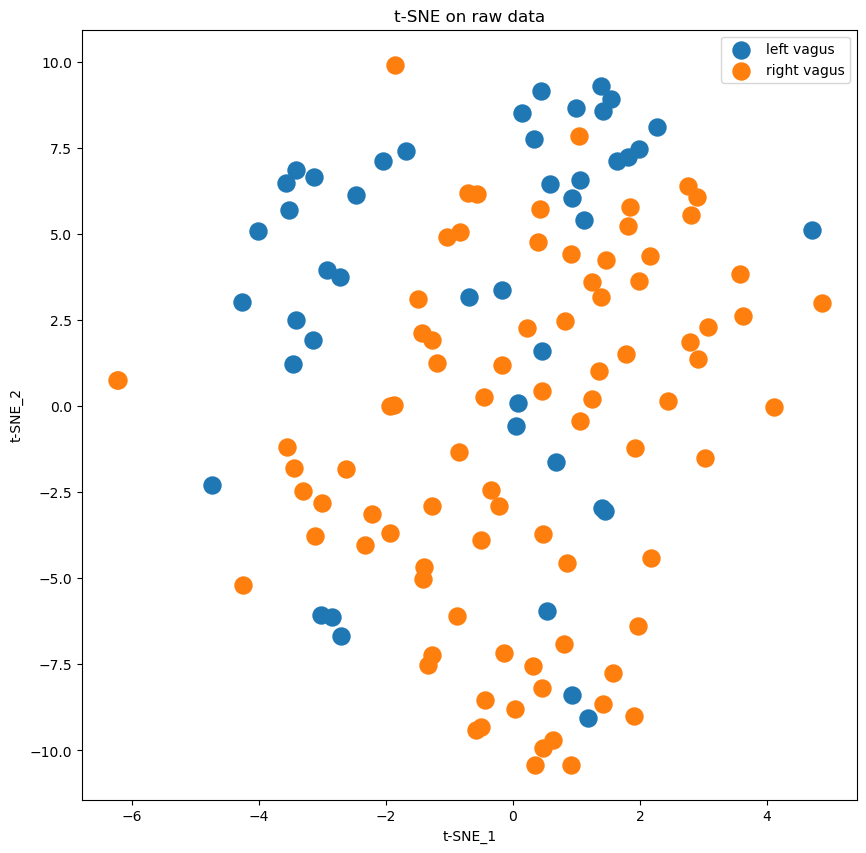

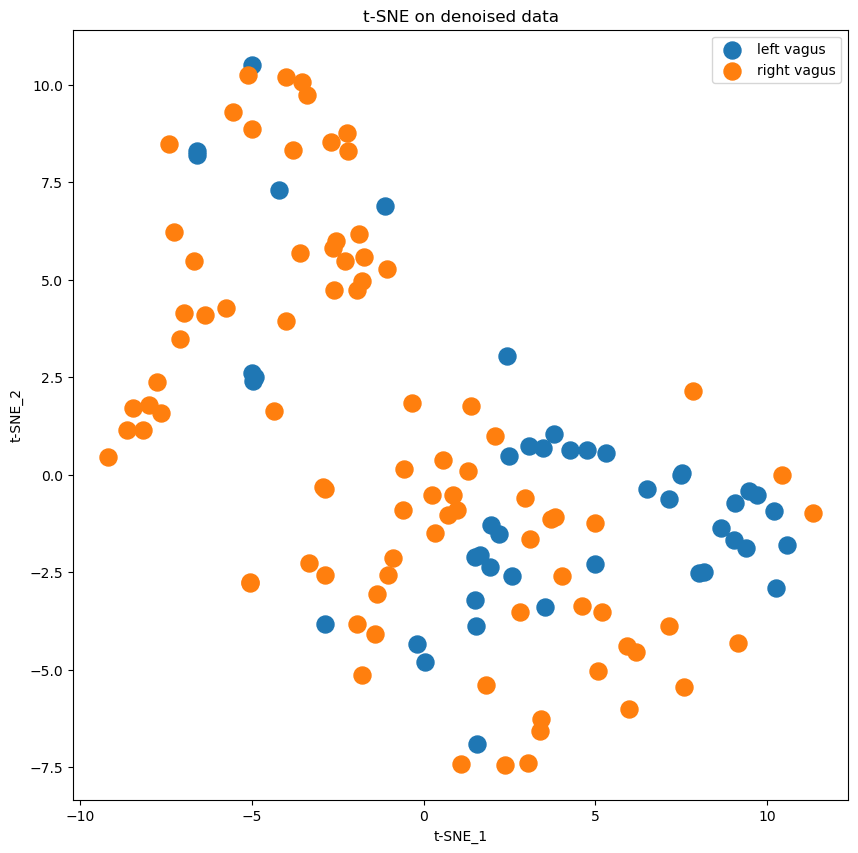

In [31]:
from sklearn.manifold import TSNE

# perform t-SNE dimentionality reduction
# t-SNE relies or random number generation, so we fix random_state to have same result each time we run the code
raw_norm_vol_dfs_combined = np.concatenate((raw_norm_vol_dfs_L, raw_norm_vol_dfs_R))
X_embedded = TSNE(n_components=2, learning_rate='auto', init='random', random_state=1113).fit_transform(raw_norm_vol_dfs_combined)

plt.figure(figsize=(10, 10))

# plot t-SNE embedding in two-dimentional space
final_trace_indices = np.cumsum([raw_norm_vol_dfs_L.shape[0], raw_norm_vol_dfs_R.shape[0]])  # indices of the final neural traces of each fish
for side, n_traces in enumerate(final_trace_indices):
    if side == 0:  # left vagus
        tsnes_x = X_embedded[:n_traces, 0]
        tsnes_y = X_embedded[:n_traces, 1]
        plt.scatter(tsnes_x, tsnes_y, label=f'left vagus', s=150)

    else:  # right vagus
        tsnes_x = X_embedded[final_trace_indices[side-1]:n_traces, 0]
        tsnes_y = X_embedded[final_trace_indices[side-1]:n_traces, 1]
        plt.scatter(tsnes_x, tsnes_y, label=f'right vagus', s=150)

plt.legend()
plt.xlabel('t-SNE_1')
plt.ylabel('t-SNE_2')
plt.title('t-SNE on raw data')

########################################

# perform t-SNE dimentionality reduction
# t-SNE relies or random number generation, so we fix random_state to have same result each time we run the code
norm_vol_dfs_combined = np.concatenate((norm_vol_dfs_L, norm_vol_dfs_R))
X_embedded = TSNE(n_components=2, learning_rate='auto', init='random', random_state=1113).fit_transform(norm_vol_dfs_combined)

plt.figure(figsize=(10, 10))

# plot t-SNE embedding in two-dimentional space
final_trace_indices = np.cumsum([norm_vol_dfs_L.shape[0], norm_vol_dfs_R.shape[0]])  # indices of the final neural traces of each fish
for side, n_traces in enumerate(final_trace_indices):
    if side == 0:  # left vagus
        tsnes_x = X_embedded[:n_traces, 0]
        tsnes_y = X_embedded[:n_traces, 1]
        plt.scatter(tsnes_x, tsnes_y, label=f'left vagus', s=150)

    else:  # right vagus
        tsnes_x = X_embedded[final_trace_indices[side-1]:n_traces, 0]
        tsnes_y = X_embedded[final_trace_indices[side-1]:n_traces, 1]
        plt.scatter(tsnes_x, tsnes_y, label=f'right vagus', s=150)

plt.legend()
plt.xlabel('t-SNE_1')
plt.ylabel('t-SNE_2')
plt.title('t-SNE on denoised data')

/Users/minelarinel/mambaforge/envs/mescore/lib/python3.10/site-packages/umap/umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")
/Users/minelarinel/mambaforge/envs/mescore/lib/python3.10/site-packages/umap/umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


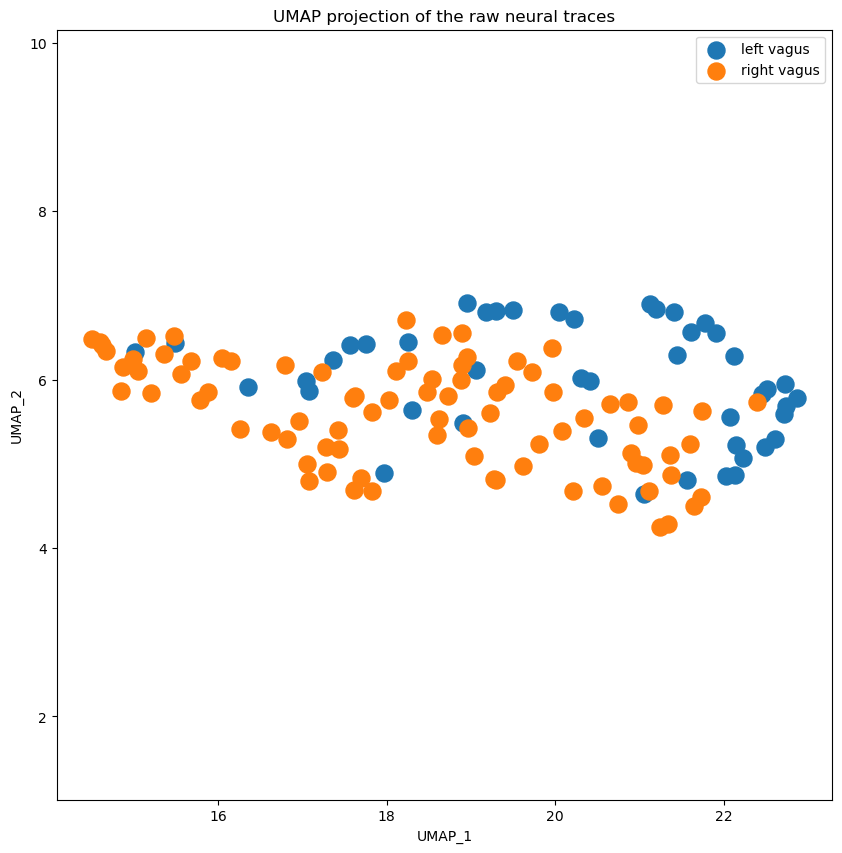

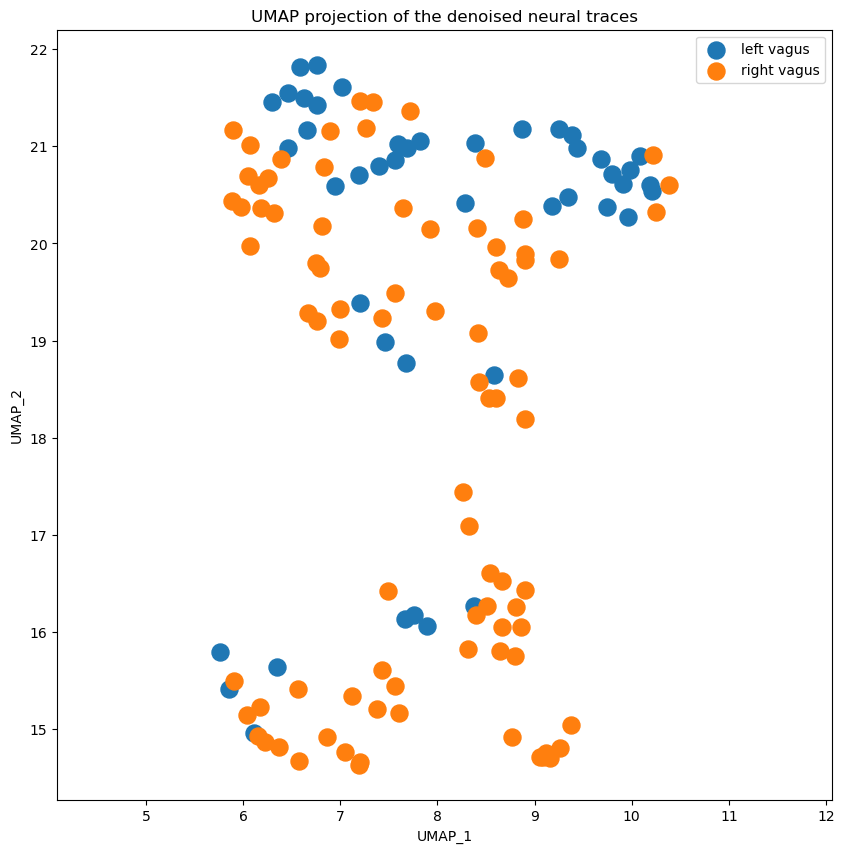

In [34]:
import umap
from sklearn.preprocessing import StandardScaler

raw_norm_vol_dfs_combined = np.concatenate((raw_norm_vol_dfs_L, raw_norm_vol_dfs_R))

reducer = umap.UMAP(random_state=1113)
scaled_data = StandardScaler().fit_transform(raw_norm_vol_dfs_combined)
embedding = reducer.fit_transform(scaled_data)
embedding.shape

plt.figure(figsize=(10, 10))

# plot UMAP embedding in two-dimentional space
final_trace_indices = np.cumsum([raw_norm_vol_dfs_L.shape[0], raw_norm_vol_dfs_R.shape[0]])  # indices of the final neural traces of each fish
for side, n_traces in enumerate(final_trace_indices):
    if side == 0:  # left vagus
        umap_x = embedding[:n_traces, 0]
        umap_y = embedding[:n_traces, 1]
        plt.scatter(umap_x, umap_y, label=f'left vagus', s=150)

    else:  # right vagus
        umap_x = embedding[final_trace_indices[side-1]:n_traces, 0]
        umap_y = embedding[final_trace_indices[side-1]:n_traces, 1]
        plt.scatter(umap_x, umap_y, label=f'right vagus', s=150)

plt.gca().set_aspect('equal', 'datalim')
plt.title('UMAP projection of the raw neural traces')
plt.legend()
plt.xlabel('UMAP_1')
plt.ylabel('UMAP_2')
plt.grid(visible=False)

###################################################

norm_vol_dfs_combined = np.concatenate((norm_vol_dfs_L, norm_vol_dfs_R))

reducer = umap.UMAP(random_state=1113)
scaled_data = StandardScaler().fit_transform(norm_vol_dfs_combined)
embedding = reducer.fit_transform(scaled_data)
embedding.shape

plt.figure(figsize=(10, 10))

# plot UMAP embedding in two-dimentional space
final_trace_indices = np.cumsum([norm_vol_dfs_L.shape[0], norm_vol_dfs_R.shape[0]])  # indices of the final neural traces of each fish
for side, n_traces in enumerate(final_trace_indices):
    if side == 0:  # left vagus
        umap_x = embedding[:n_traces, 0]
        umap_y = embedding[:n_traces, 1]
        plt.scatter(umap_x, umap_y, label=f'left vagus', s=150)

    else:  # right vagus
        umap_x = embedding[final_trace_indices[side-1]:n_traces, 0]
        umap_y = embedding[final_trace_indices[side-1]:n_traces, 1]
        plt.scatter(umap_x, umap_y, label=f'right vagus', s=150)

plt.gca().set_aspect('equal', 'datalim')
plt.title('UMAP projection of the denoised neural traces')
plt.legend()
plt.xlabel('UMAP_1')
plt.ylabel('UMAP_2')
plt.grid(visible=False)

### Individual neuronal clustering

Number of clusters: 7


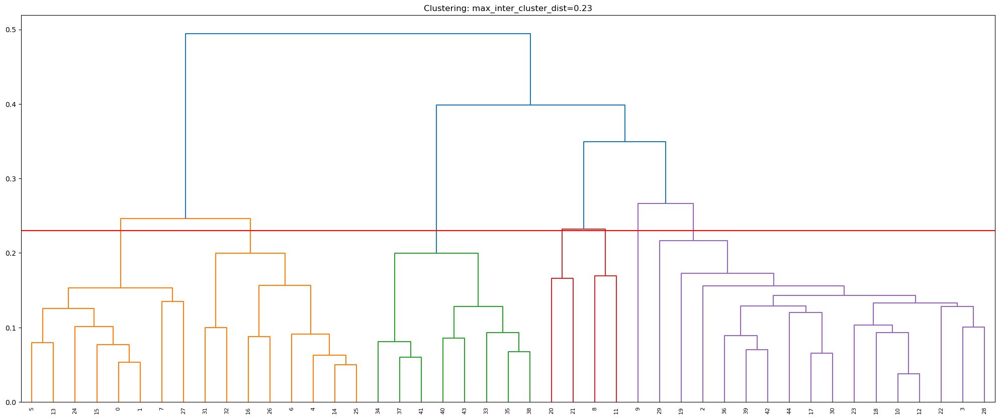

Number of clusters: 15


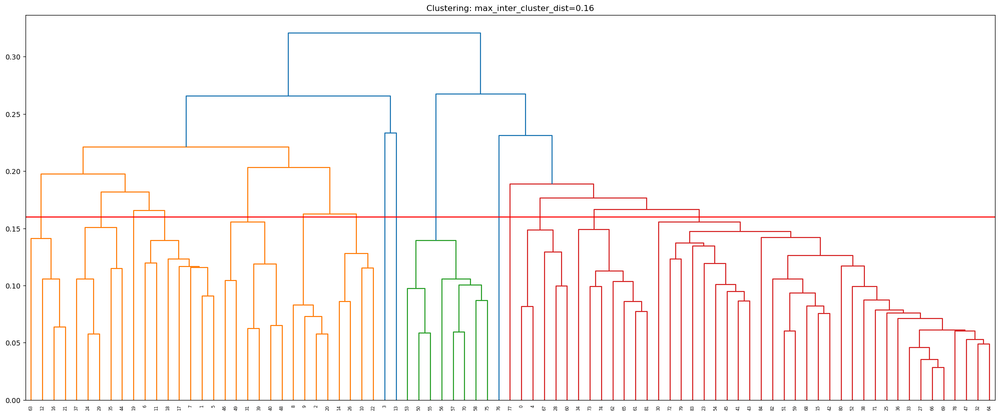

Number of clusters: 7


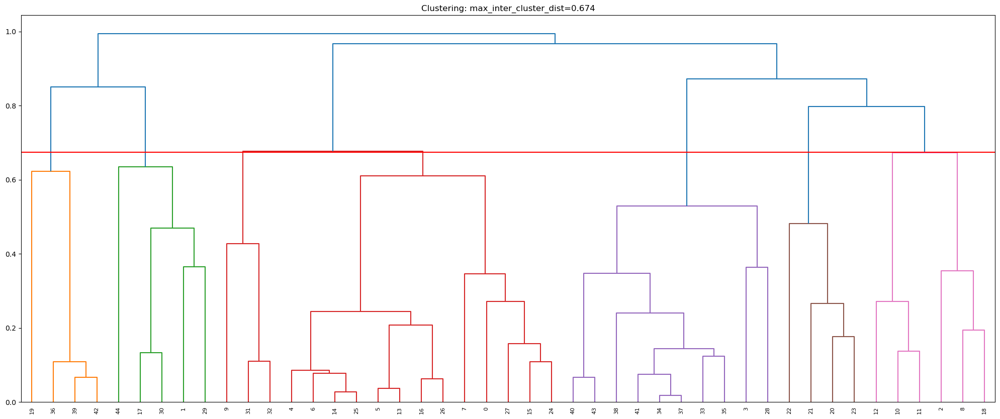

Number of clusters: 12


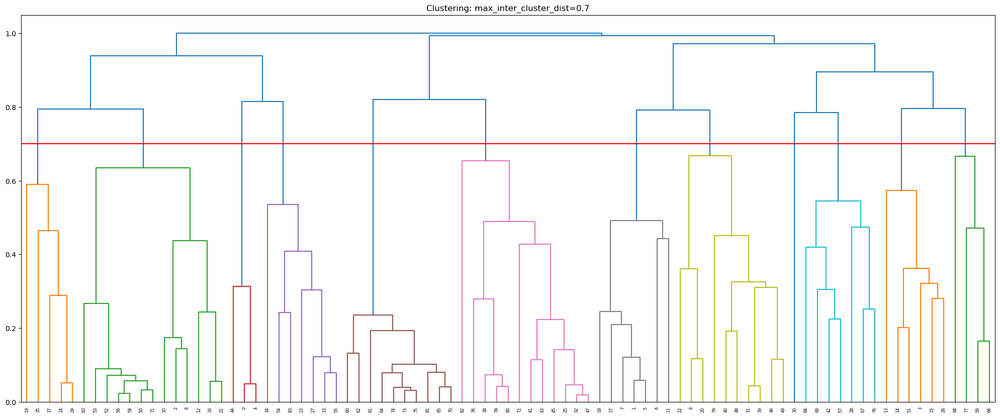

In [10]:
raw_clusters_L, _ = hierarchical_clustering(raw_norm_vol_dfs_L, 0.23)
raw_clusters_R, _ = hierarchical_clustering(raw_norm_vol_dfs_R, 0.16)
clusters_L, _ = hierarchical_clustering(norm_vol_dfs_L, 0.674)
clusters_R, _ = hierarchical_clustering(norm_vol_dfs_R, 0.7)

/var/folders/48/8y2gqcvx5q5575kwkzngl6qw0000gn/T/ipykernel_26178/1967664373.py:42: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = get_cmap('Set1')  # type: matplotlib.colors.ListedColormap


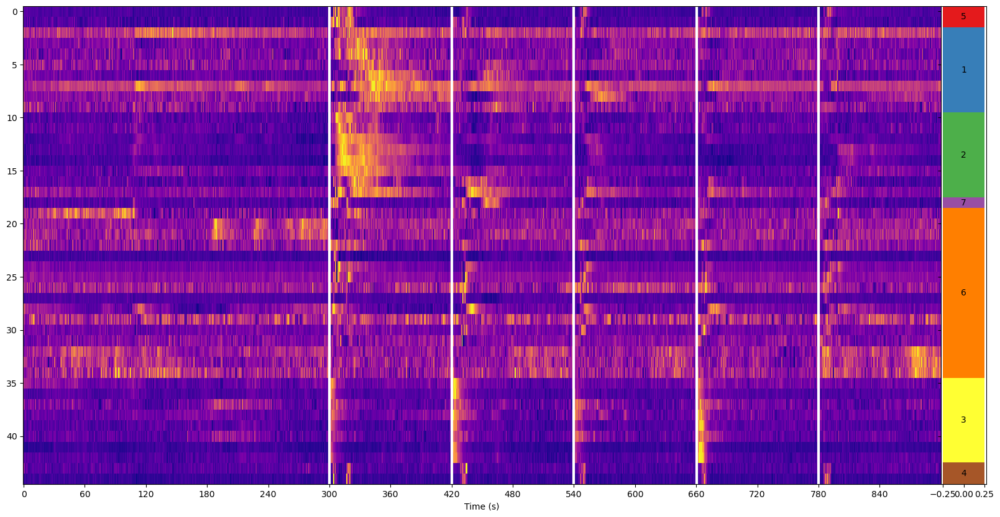

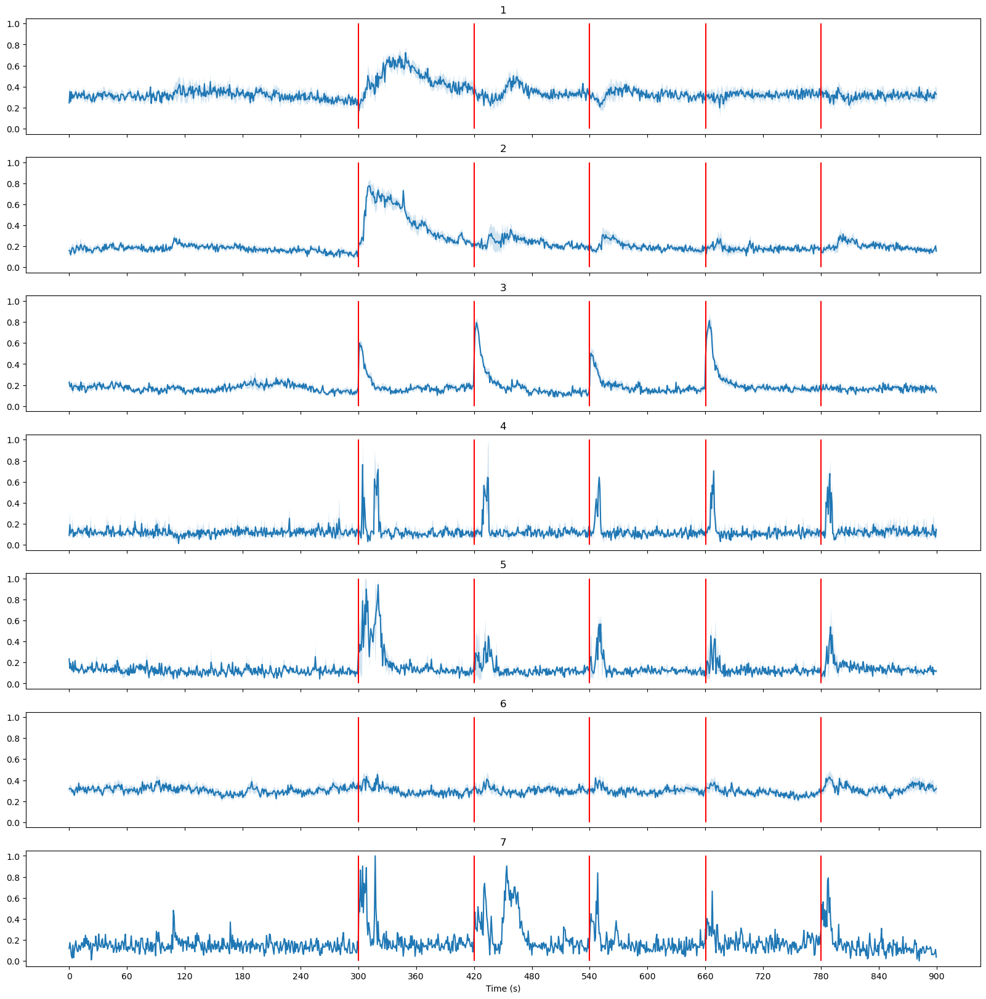

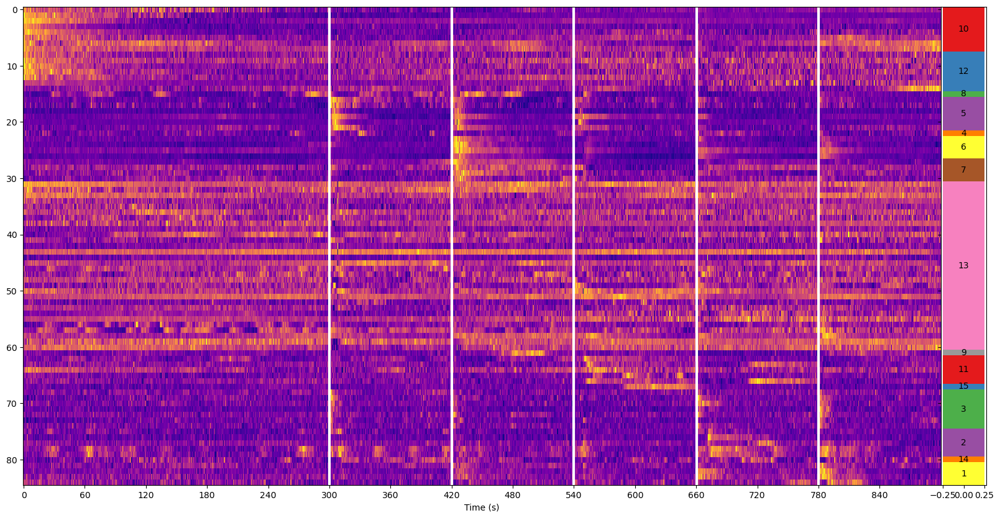

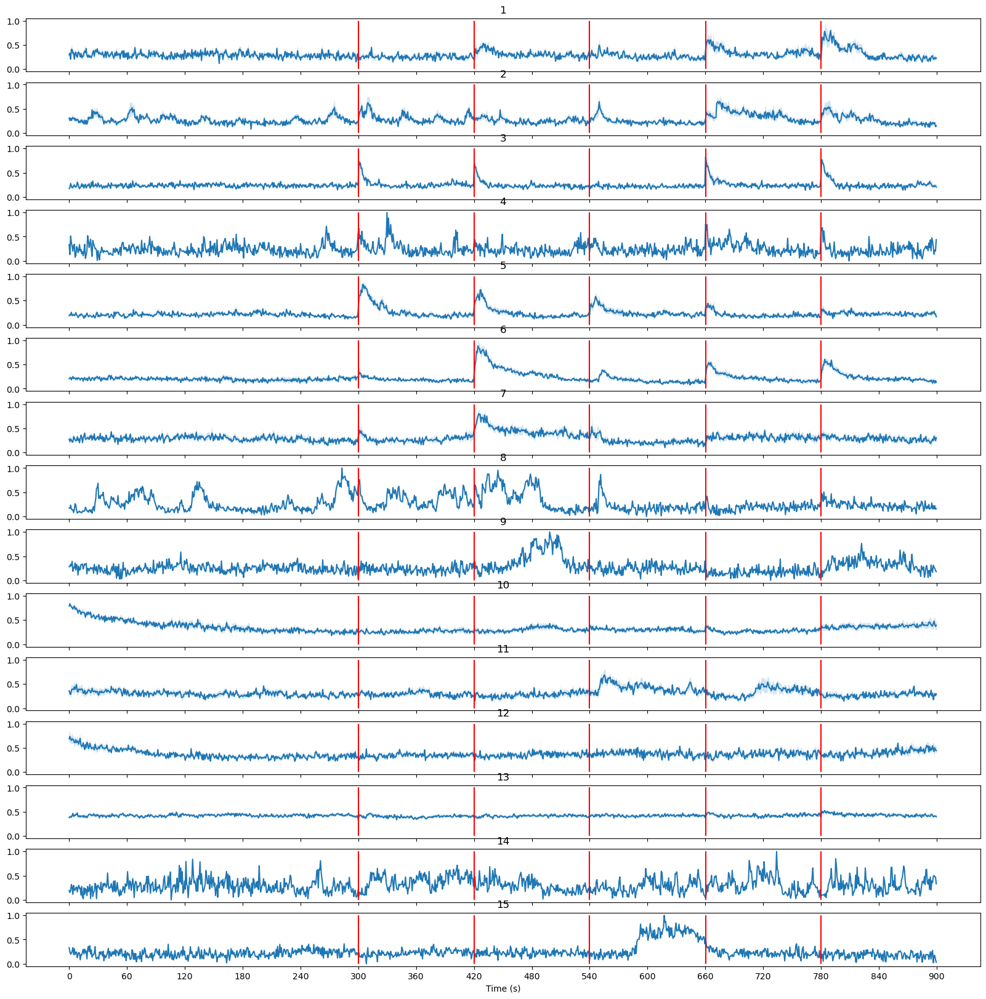

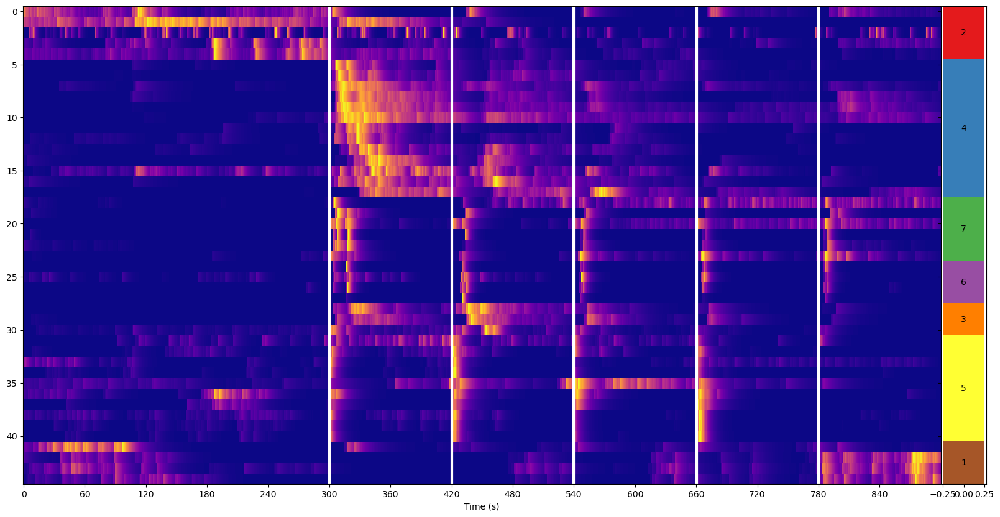

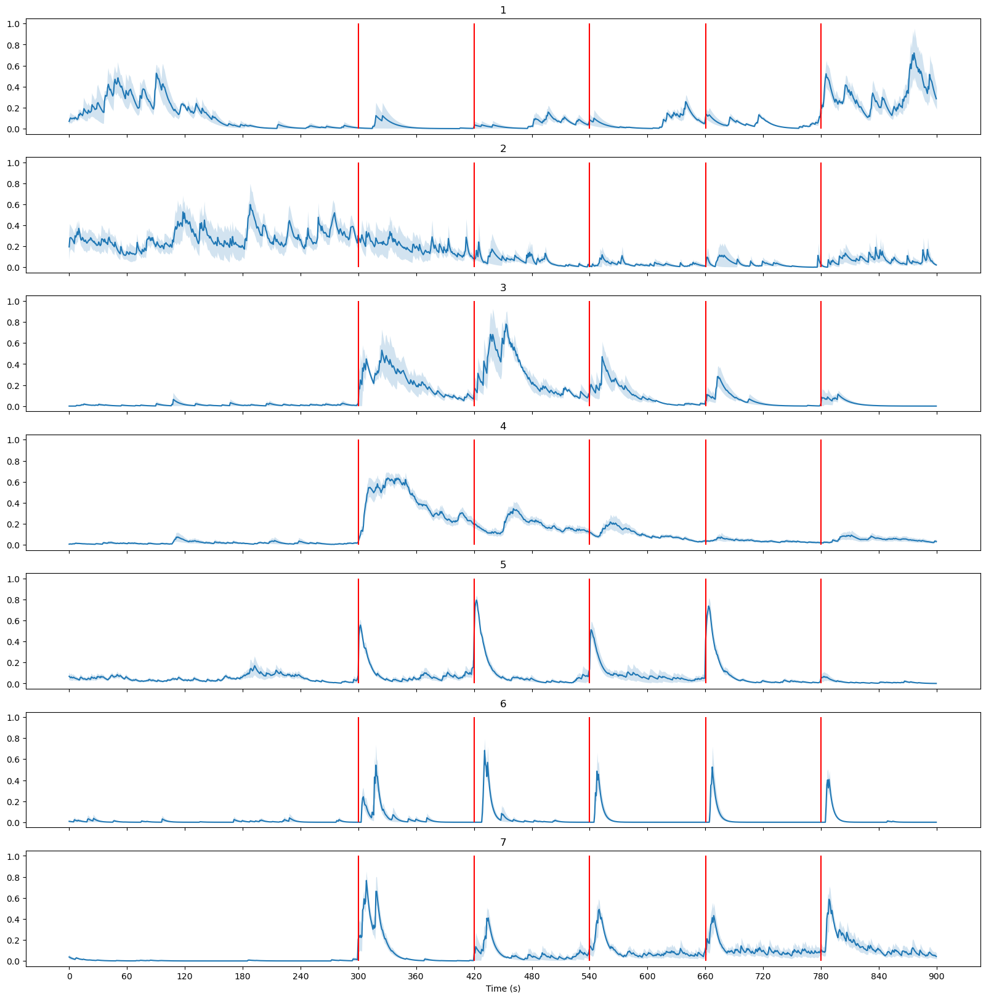

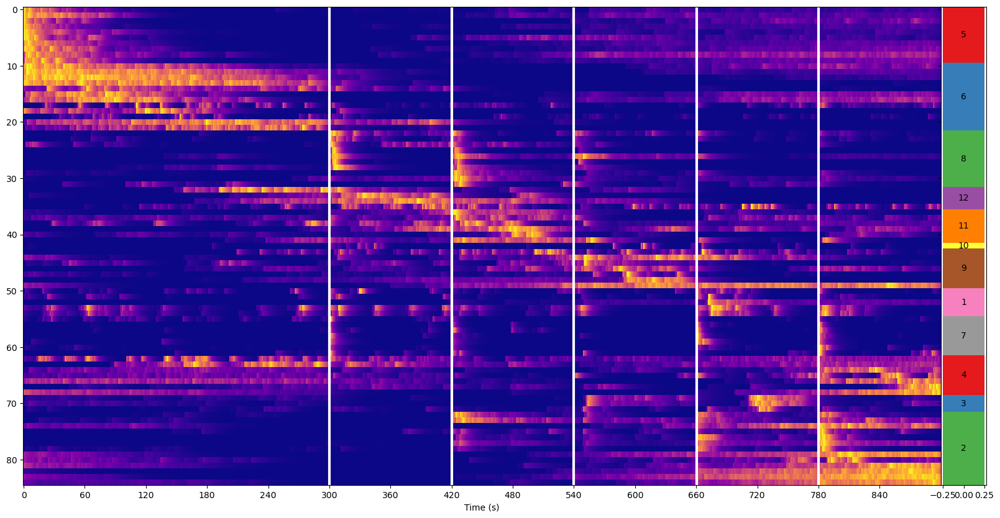

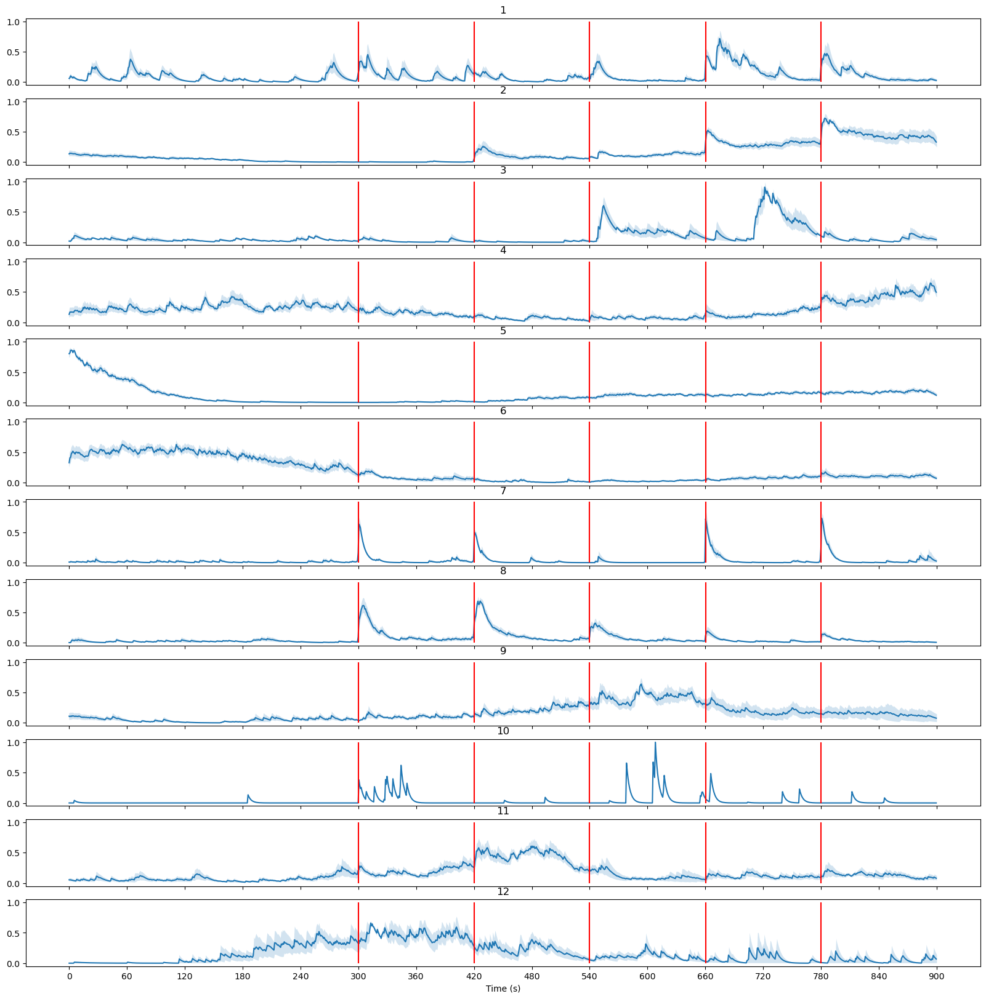

In [13]:
# plot hierarchical clustering heatmaps
clusters = [raw_clusters_L, raw_clusters_R, clusters_L, clusters_R]

for cluster in clusters:
	peak_clusters = dict()
	peak_indices = list()

	for cl in cluster:
		sorted_ts = sort_by_peak(cluster[cl])
		peak_clusters[cl] = sorted_ts

		# calculate an index that takes a sliding window sum of each trace to find the "peak" time point
		# this "peak" time point is then added for each trace of the cluster to create a peak_index
		# the peak_index will be used to sort the clusters
		peak_index = np.array([np.argmax(np.convolve(arr, np.ones(10), 'valid')) for arr in sorted_ts]).mean()
		peak_indices.append(peak_index)

	sorted_peak_clusters = sorted(peak_clusters, key=lambda k: peak_indices[k-1])   

	sorted_traces = list()
	for cl in sorted_peak_clusters:
		sorted_traces.extend(peak_clusters[cl])

	fps=1.3039181000348583
	pulses=[391, 548, 704, 861, 1017]

	fig, (ax1, ax2) = plt.subplots(1, 2, sharey=True, width_ratios=[20, 1], height_ratios=[1], figsize=(20, 10))
	ax1.imshow(sorted_traces, cmap='plasma', interpolation='nearest', aspect='auto')

	ticks = np.arange(0, 16*60*fps, 60*fps)
	ax1.set_xticks(ticks=ticks, labels=np.round(ticks/fps).astype(int))

	for pulse in pulses:
		ax1.vlines(pulse, -0.5, len(sorted_traces)-0.5, color='w', lw=3)

	ax1.set_xlabel('Time (s)')

	bottom = -0.5  # y-coordinates of the bottom side of the bar
	x = 0
	width = 0.5

	cmap = get_cmap('Set1')  # type: matplotlib.colors.ListedColormap
	colors = cmap.colors  # type: list
	ax2.set_prop_cycle(color=colors)

	# Make the colormap for the clusters
	for cl in sorted_peak_clusters:
		temps = peak_clusters[cl]

		p = ax2.bar(x, len(temps), width, label=str(cl), bottom=bottom)
		bottom += len(temps)
		
		ax2.bar_label(p, labels=[str(cl)], label_type='center')
	ax1.grid(visible=False)
	plt.subplots_adjust(wspace=0)

	plot_average_traces(cluster, pulses=[391, 548, 704, 861, 1017], fps=fps)

/var/folders/48/8y2gqcvx5q5575kwkzngl6qw0000gn/T/ipykernel_60015/4011845026.py:46: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = get_cmap('Set1')  # type: matplotlib.colors.ListedColormap


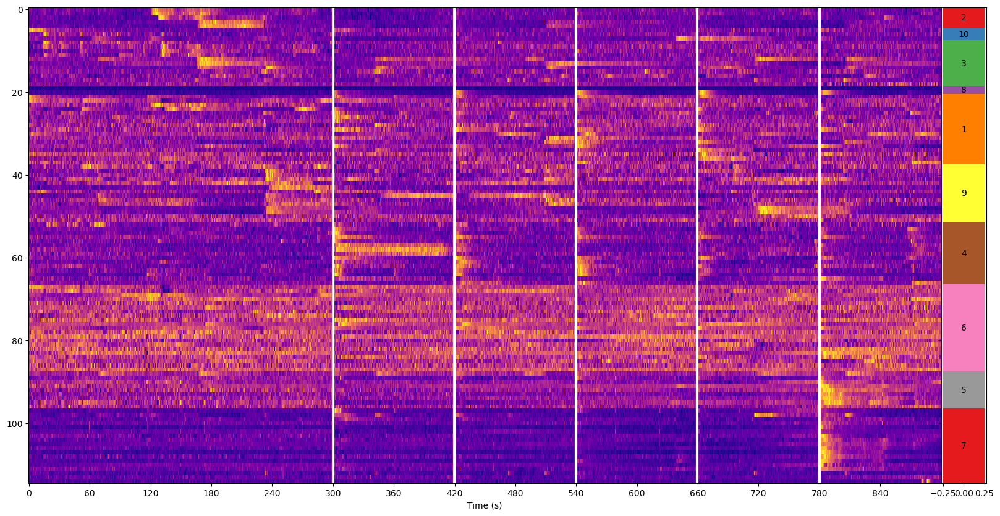

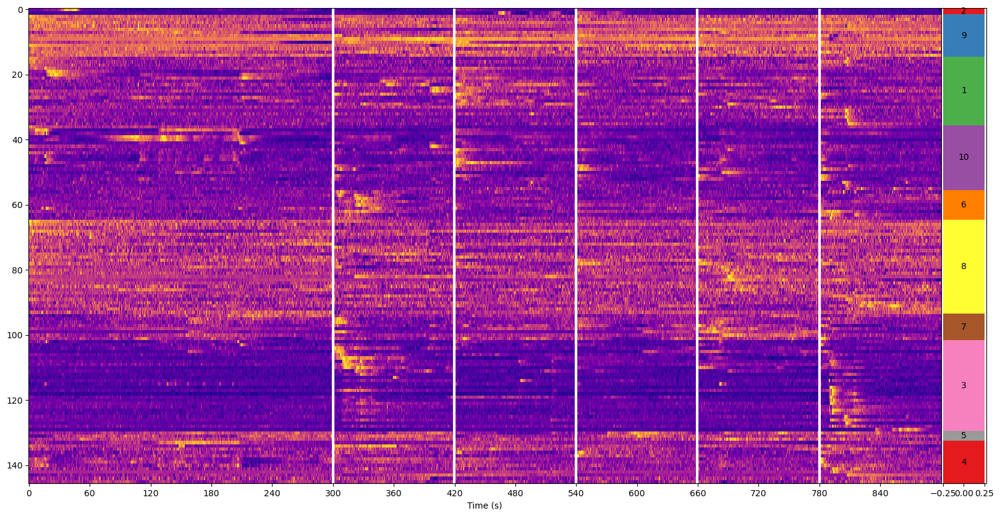

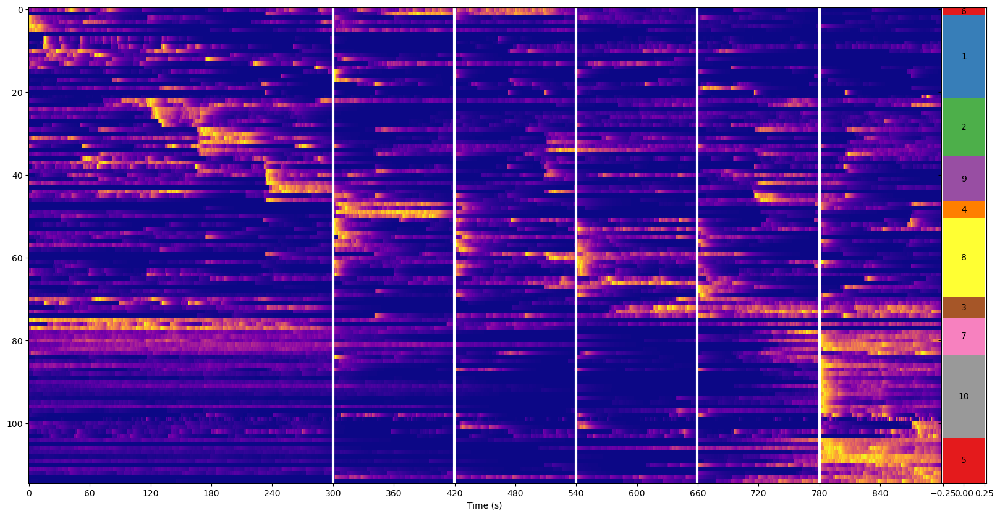

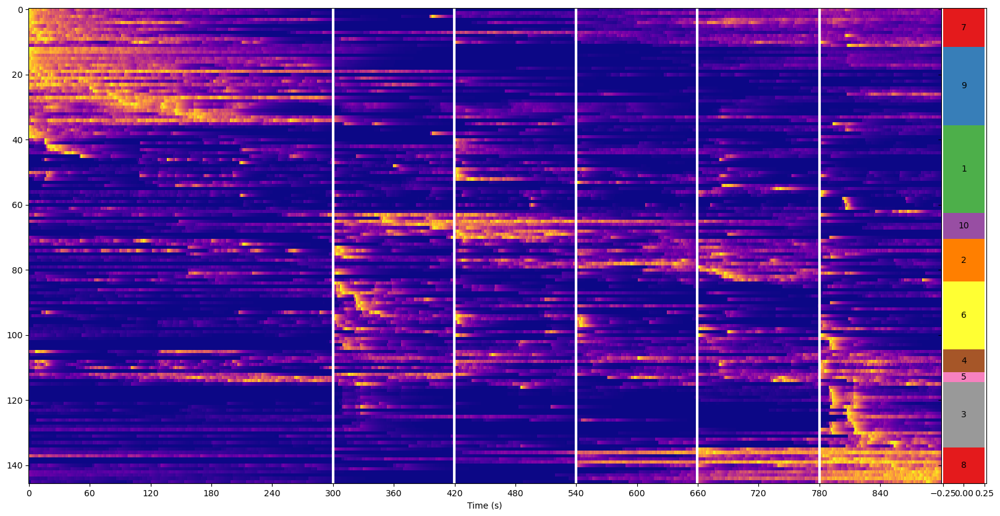

In [53]:
# Run k-means clustering
k = 10
all_data = [raw_norm_vol_dfs_L, raw_norm_vol_dfs_R, norm_vol_dfs_L, norm_vol_dfs_R]

for data in all_data:
	kmeans_clusters, centroids = kmeans_clustering(data, k)

	peak_clusters = dict()
	peak_indices = list()

	for cl in kmeans_clusters:
		sorted_ts = sort_by_peak(kmeans_clusters[cl])
		peak_clusters[cl] = sorted_ts

		# calculate an index that takes a sliding window sum of each trace to find the "peak" time point
		# this "peak" time point is then added for each trace of the cluster to create a peak_index
		# the peak_index will be used to sort the clusters
		peak_index = np.array([np.argmax(np.convolve(arr, np.ones(10), 'valid')) for arr in sorted_ts]).mean()
		peak_indices.append(peak_index)

	indices = np.argsort(peak_indices)
	sorted_peak_clusters = np.array(list(peak_clusters.keys()))[indices]

	sorted_traces = list()
	for cl in sorted_peak_clusters:
		sorted_traces.extend(peak_clusters[cl])

	fps=1.3039181000348583
	pulses=[391, 547, 704, 860, 1017]

	fig, (ax1, ax2) = plt.subplots(1, 2, sharey=True, width_ratios=[20, 1], height_ratios=[1], figsize=(20, 10))
	ax1.imshow(sorted_traces, cmap='plasma', interpolation='nearest', aspect='auto')

	ticks = np.arange(0, 16*60*fps, 60*fps)
	ax1.set_xticks(ticks=ticks, labels=np.round(ticks/fps).astype(int))

	for pulse in pulses:
		ax1.vlines(pulse, -0.5, len(sorted_traces)-0.5, color='w', lw=3)

	ax1.set_xlabel('Time (s)')

	bottom = -0.5  # y-coordinates of the bottom side of the bar
	x = 0
	width = 0.5

	cmap = get_cmap('Set1')  # type: matplotlib.colors.ListedColormap
	colors = cmap.colors  # type: list
	ax2.set_prop_cycle(color=colors)

	# Make the colormap for the clusters
	for cl in sorted_peak_clusters:
		temps = peak_clusters[cl]

		p = ax2.bar(x, len(temps), width, label=str(cl), bottom=bottom)
		bottom += len(temps)
		
		ax2.bar_label(p, labels=[str(cl)], label_type='center')
	ax1.grid(visible=False)
	plt.subplots_adjust(wspace=0)
	plt.show()

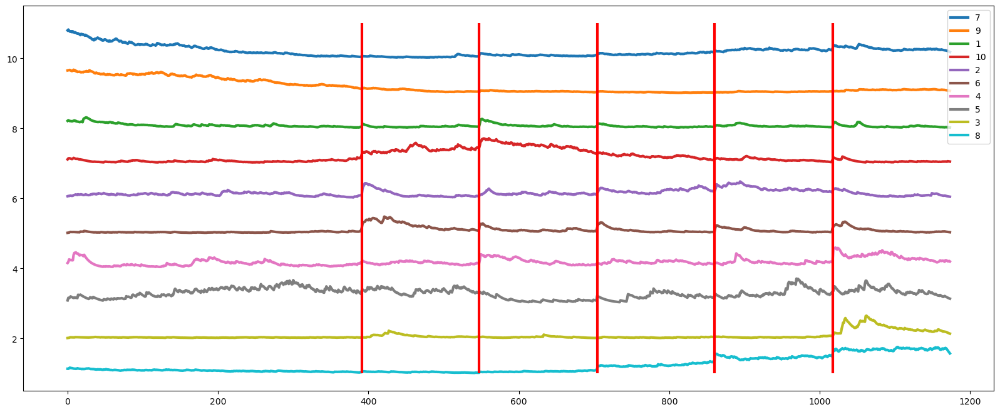

In [55]:
plt.figure(figsize=(20, 0.8*len(sorted_peak_clusters)))

for i, cl in enumerate(sorted_peak_clusters):
    plt.plot(centroids[cl-1]+k-i, lw=3, label=cl)

pulses=[391, 547, 704, 860, 1017]
for pulse in pulses:
    plt.vlines(pulse, 1, k+1, color='r', lw=3)

plt.legend()
plt.show()


# INDIVIDUAL BASELINES

## Unrolled temporal dataframes

In [198]:
# Create unrolled temporal dfs
left_dfs = list()
for exp_folder in vagalL_paths:
    fish = BrukerFish(exp_folder)
    df = unroll_temporal_df(fish, pre_frame_num=15, post_frame_num=5, peak_threshold=0.2, min_threshold=-0.2, key='raw_norm_temporal', normalize=True)
    left_dfs.append(df)

right_dfs = list()
for exp_folder in vagalR_paths:
    fish = BrukerFish(exp_folder)
    df = unroll_temporal_df(fish, pre_frame_num=15, post_frame_num=5, peak_threshold=0.2, min_threshold=-0.2, key='raw_norm_temporal', normalize=True)
    right_dfs.append(df)

left_df = pd.concat(left_dfs, ignore_index=True)
right_df = pd.concat(right_dfs, ignore_index=True)

/Users/minelarinel/caImageAnalysis/caImageAnalysis/bruker_2P/voltage_output.py:22: GuessedAtParserWarning: No parser was explicitly specified, so I'm using the best available HTML parser for this system ("html.parser"). This usually isn't a problem, but if you run this code on another system, or in a different virtual environment, it may use a different parser and behave differently.

The code that caused this warning is on line 22 of the file /Users/minelarinel/caImageAnalysis/caImageAnalysis/bruker_2P/voltage_output.py. To get rid of this warning, pass the additional argument 'features="html.parser"' to the BeautifulSoup constructor.

  Bs_data = BeautifulSoup(xml)
/Users/minelarinel/mambaforge/envs/mescore/lib/python3.10/site-packages/bs4/builder/__init__.py:545: XMLParsedAsHTMLWarning: It looks like you're parsing an XML document using an HTML parser. If this really is an HTML document (maybe it's XHTML?), you can ignore or filter this warning. If it's XML, you should know that usi

Batch exists. Loading batch.pickle


/Users/minelarinel/caImageAnalysis/caImageAnalysis/bruker_2P/bruker.py:166: GuessedAtParserWarning: No parser was explicitly specified, so I'm using the best available HTML parser for this system ("html.parser"). This usually isn't a problem, but if you run this code on another system, or in a different virtual environment, it may use a different parser and behave differently.

The code that caused this warning is on line 166 of the file /Users/minelarinel/caImageAnalysis/caImageAnalysis/bruker_2P/bruker.py. To get rid of this warning, pass the additional argument 'features="html.parser"' to the BeautifulSoup constructor.

  Bs_data = BeautifulSoup(log)
/Users/minelarinel/mambaforge/envs/mescore/lib/python3.10/site-packages/bs4/builder/__init__.py:545: XMLParsedAsHTMLWarning: It looks like you're parsing an XML document using an HTML parser. If this really is an HTML document (maybe it's XHTML?), you can ignore or filter this warning. If it's XML, you should know that using an XML pars

neuron 3 is activated
neuron 3 responds to stimulus 1 (activated)
neuron 3 responds to stimulus 2 (activated)
neuron 3 responds to stimulus 3 (activated)
neuron 3 responds to stimulus 4 (activated)
neuron 3 responds to stimulus 5 (activated)
neuron 3 responds to 100.0% of injections

neuron 8 is activated
neuron 8 responds to stimulus 1 (activated)
neuron 8 responds to stimulus 2 (activated)
neuron 8 responds to stimulus 3 (activated)
neuron 8 responds to stimulus 4 (activated)
neuron 8 responds to 80.0% of injections

neuron 9 is activated
neuron 9 responds to stimulus 1 (activated)
neuron 9 responds to stimulus 2 (activated)
neuron 9 responds to stimulus 3 (activated)
neuron 9 responds to stimulus 4 (activated)
neuron 9 responds to stimulus 5 (activated)
neuron 9 responds to 100.0% of injections

neuron 18 is activated
neuron 18 responds to stimulus 1 (activated)
neuron 18 responds to stimulus 2 (activated)
neuron 18 responds to stimulus 4 (activated)
neuron 18 responds to 60.0% of i

/Users/minelarinel/caImageAnalysis/caImageAnalysis/temporal.py:1009: PerformanceWarning: 
your performance may suffer as PyTables will pickle object types that it cannot
map directly to c-types [inferred_type->mixed-integer,key->block1_values] [items->Index(['fish_id', 'plane', 'neuron', 'raw_temporal', 'temporal',
       'raw_norm_temporal', 'norm_temporalraw_dff', 'dff', 'raw_norm_dff',
       'norm_dff', 'raw_zscore', 'zscore', 'raw_percentile', 'percentile',
       'roi_index', 'pulse_frames', 'norm_temporal', 'raw_dff', 'activated',
       'inhibited', 'pulse_response'],
      dtype='object')]

/Users/minelarinel/caImageAnalysis/caImageAnalysis/bruker_2P/voltage_output.py:22: GuessedAtParserWarning: No parser was explicitly specified, so I'm using the best available HTML parser for this system ("html.parser"). This usually isn't a problem, but if you run this code on another system, or in a different virtual environment, it may use a different parser and behave differently.

The c

Batch exists. Loading batch.pickle


/Users/minelarinel/caImageAnalysis/caImageAnalysis/bruker_2P/voltage_output.py:22: GuessedAtParserWarning: No parser was explicitly specified, so I'm using the best available HTML parser for this system ("html.parser"). This usually isn't a problem, but if you run this code on another system, or in a different virtual environment, it may use a different parser and behave differently.

The code that caused this warning is on line 22 of the file /Users/minelarinel/caImageAnalysis/caImageAnalysis/bruker_2P/voltage_output.py. To get rid of this warning, pass the additional argument 'features="html.parser"' to the BeautifulSoup constructor.

  Bs_data = BeautifulSoup(xml)
/Users/minelarinel/mambaforge/envs/mescore/lib/python3.10/site-packages/bs4/builder/__init__.py:545: XMLParsedAsHTMLWarning: It looks like you're parsing an XML document using an HTML parser. If this really is an HTML document (maybe it's XHTML?), you can ignore or filter this warning. If it's XML, you should know that usi

Batch exists. Loading batch.pickle


/Users/minelarinel/caImageAnalysis/caImageAnalysis/bruker_2P/bruker.py:166: GuessedAtParserWarning: No parser was explicitly specified, so I'm using the best available HTML parser for this system ("html.parser"). This usually isn't a problem, but if you run this code on another system, or in a different virtual environment, it may use a different parser and behave differently.

The code that caused this warning is on line 166 of the file /Users/minelarinel/caImageAnalysis/caImageAnalysis/bruker_2P/bruker.py. To get rid of this warning, pass the additional argument 'features="html.parser"' to the BeautifulSoup constructor.

  Bs_data = BeautifulSoup(log)
/Users/minelarinel/mambaforge/envs/mescore/lib/python3.10/site-packages/bs4/builder/__init__.py:545: XMLParsedAsHTMLWarning: It looks like you're parsing an XML document using an HTML parser. If this really is an HTML document (maybe it's XHTML?), you can ignore or filter this warning. If it's XML, you should know that using an XML pars

neuron 0 is activated
neuron 0 responds to stimulus 1 (activated)
neuron 0 responds to stimulus 2 (activated)
neuron 0 responds to stimulus 3 (activated)
neuron 0 responds to stimulus 4 (activated)
neuron 0 responds to 80.0% of injections

neuron 1 is activated
neuron 1 responds to stimulus 1 (activated)
neuron 1 responds to stimulus 2 (activated)
neuron 1 responds to stimulus 3 (activated)
neuron 1 responds to stimulus 4 (activated)
neuron 1 responds to 80.0% of injections

neuron 2 is activated
neuron 2 responds to stimulus 1 (activated)
neuron 2 responds to stimulus 2 (activated)
neuron 2 responds to stimulus 3 (activated)
neuron 2 responds to stimulus 4 (activated)
neuron 2 responds to 80.0% of injections

neuron 4 is activated
neuron 4 responds to stimulus 1 (activated)
neuron 4 responds to stimulus 2 (activated)
neuron 4 responds to stimulus 3 (activated)
neuron 4 responds to stimulus 4 (activated)
neuron 4 responds to 80.0% of injections

neuron 5 is activated
neuron 5 responds 

/Users/minelarinel/caImageAnalysis/caImageAnalysis/temporal.py:1009: PerformanceWarning: 
your performance may suffer as PyTables will pickle object types that it cannot
map directly to c-types [inferred_type->mixed-integer,key->block1_values] [items->Index(['fish_id', 'plane', 'neuron', 'raw_temporal', 'temporal',
       'raw_norm_temporal', 'norm_temporalraw_dff', 'dff', 'raw_norm_dff',
       'norm_dff', 'raw_zscore', 'zscore', 'raw_percentile', 'percentile',
       'roi_index', 'pulse_frames', 'norm_temporal', 'raw_dff', 'activated',
       'inhibited', 'pulse_response'],
      dtype='object')]

/Users/minelarinel/caImageAnalysis/caImageAnalysis/bruker_2P/voltage_output.py:22: GuessedAtParserWarning: No parser was explicitly specified, so I'm using the best available HTML parser for this system ("html.parser"). This usually isn't a problem, but if you run this code on another system, or in a different virtual environment, it may use a different parser and behave differently.

The c

Batch exists. Loading batch.pickle


/Users/minelarinel/caImageAnalysis/caImageAnalysis/bruker_2P/voltage_output.py:22: GuessedAtParserWarning: No parser was explicitly specified, so I'm using the best available HTML parser for this system ("html.parser"). This usually isn't a problem, but if you run this code on another system, or in a different virtual environment, it may use a different parser and behave differently.

The code that caused this warning is on line 22 of the file /Users/minelarinel/caImageAnalysis/caImageAnalysis/bruker_2P/voltage_output.py. To get rid of this warning, pass the additional argument 'features="html.parser"' to the BeautifulSoup constructor.

  Bs_data = BeautifulSoup(xml)
/Users/minelarinel/mambaforge/envs/mescore/lib/python3.10/site-packages/bs4/builder/__init__.py:545: XMLParsedAsHTMLWarning: It looks like you're parsing an XML document using an HTML parser. If this really is an HTML document (maybe it's XHTML?), you can ignore or filter this warning. If it's XML, you should know that usi

Batch exists. Loading batch.pickle


/Users/minelarinel/caImageAnalysis/caImageAnalysis/bruker_2P/bruker.py:166: GuessedAtParserWarning: No parser was explicitly specified, so I'm using the best available HTML parser for this system ("html.parser"). This usually isn't a problem, but if you run this code on another system, or in a different virtual environment, it may use a different parser and behave differently.

The code that caused this warning is on line 166 of the file /Users/minelarinel/caImageAnalysis/caImageAnalysis/bruker_2P/bruker.py. To get rid of this warning, pass the additional argument 'features="html.parser"' to the BeautifulSoup constructor.

  Bs_data = BeautifulSoup(log)
/Users/minelarinel/mambaforge/envs/mescore/lib/python3.10/site-packages/bs4/builder/__init__.py:545: XMLParsedAsHTMLWarning: It looks like you're parsing an XML document using an HTML parser. If this really is an HTML document (maybe it's XHTML?), you can ignore or filter this warning. If it's XML, you should know that using an XML pars

neuron 1 is activated
neuron 1 responds to stimulus 1 (activated)
neuron 1 responds to stimulus 2 (activated)
neuron 1 responds to stimulus 4 (activated)
neuron 1 responds to stimulus 5 (activated)
neuron 1 responds to 80.0% of injections

neuron 2 is activated
neuron 2 responds to stimulus 2 (activated)
neuron 2 responds to stimulus 4 (activated)
neuron 2 responds to stimulus 5 (activated)
neuron 2 responds to 60.0% of injections

neuron 5 is activated
neuron 5 responds to stimulus 1 (activated)
neuron 5 responds to stimulus 2 (activated)
neuron 5 responds to stimulus 4 (activated)
neuron 5 responds to stimulus 5 (activated)
neuron 5 responds to 80.0% of injections

neuron 6 is activated
neuron 6 responds to stimulus 1 (activated)
neuron 6 responds to stimulus 2 (activated)
neuron 6 responds to stimulus 4 (activated)
neuron 6 responds to stimulus 5 (activated)
neuron 6 responds to 80.0% of injections

neuron 7 is activated
neuron 7 responds to stimulus 1 (activated)
neuron 7 responds 

/Users/minelarinel/caImageAnalysis/caImageAnalysis/temporal.py:1009: PerformanceWarning: 
your performance may suffer as PyTables will pickle object types that it cannot
map directly to c-types [inferred_type->mixed-integer,key->block1_values] [items->Index(['fish_id', 'plane', 'neuron', 'raw_temporal', 'temporal',
       'raw_norm_temporal', 'norm_temporalraw_dff', 'dff', 'raw_norm_dff',
       'norm_dff', 'raw_zscore', 'zscore', 'raw_percentile', 'percentile',
       'roi_index', 'pulse_frames', 'norm_temporal', 'raw_dff', 'activated',
       'inhibited', 'pulse_response'],
      dtype='object')]

/Users/minelarinel/caImageAnalysis/caImageAnalysis/bruker_2P/voltage_output.py:22: GuessedAtParserWarning: No parser was explicitly specified, so I'm using the best available HTML parser for this system ("html.parser"). This usually isn't a problem, but if you run this code on another system, or in a different virtual environment, it may use a different parser and behave differently.

The c

Batch exists. Loading batch.pickle


/Users/minelarinel/caImageAnalysis/caImageAnalysis/bruker_2P/voltage_output.py:22: GuessedAtParserWarning: No parser was explicitly specified, so I'm using the best available HTML parser for this system ("html.parser"). This usually isn't a problem, but if you run this code on another system, or in a different virtual environment, it may use a different parser and behave differently.

The code that caused this warning is on line 22 of the file /Users/minelarinel/caImageAnalysis/caImageAnalysis/bruker_2P/voltage_output.py. To get rid of this warning, pass the additional argument 'features="html.parser"' to the BeautifulSoup constructor.

  Bs_data = BeautifulSoup(xml)
/Users/minelarinel/mambaforge/envs/mescore/lib/python3.10/site-packages/bs4/builder/__init__.py:545: XMLParsedAsHTMLWarning: It looks like you're parsing an XML document using an HTML parser. If this really is an HTML document (maybe it's XHTML?), you can ignore or filter this warning. If it's XML, you should know that usi

Batch exists. Loading batch.pickle


/Users/minelarinel/caImageAnalysis/caImageAnalysis/bruker_2P/bruker.py:166: GuessedAtParserWarning: No parser was explicitly specified, so I'm using the best available HTML parser for this system ("html.parser"). This usually isn't a problem, but if you run this code on another system, or in a different virtual environment, it may use a different parser and behave differently.

The code that caused this warning is on line 166 of the file /Users/minelarinel/caImageAnalysis/caImageAnalysis/bruker_2P/bruker.py. To get rid of this warning, pass the additional argument 'features="html.parser"' to the BeautifulSoup constructor.

  Bs_data = BeautifulSoup(log)
/Users/minelarinel/mambaforge/envs/mescore/lib/python3.10/site-packages/bs4/builder/__init__.py:545: XMLParsedAsHTMLWarning: It looks like you're parsing an XML document using an HTML parser. If this really is an HTML document (maybe it's XHTML?), you can ignore or filter this warning. If it's XML, you should know that using an XML pars

neuron 0 is activated
neuron 0 responds to stimulus 1 (activated)
neuron 0 responds to stimulus 2 (activated)
neuron 0 responds to stimulus 3 (activated)
neuron 0 responds to stimulus 4 (activated)
neuron 0 responds to 80.0% of injections

neuron 1 is activated
neuron 1 responds to stimulus 1 (activated)
neuron 1 responds to stimulus 3 (activated)
neuron 1 responds to stimulus 4 (activated)
neuron 1 responds to stimulus 5 (activated)
neuron 1 responds to 80.0% of injections

neuron 2 is activated
neuron 2 responds to stimulus 2 (activated)
neuron 2 responds to stimulus 3 (activated)
neuron 2 responds to stimulus 4 (activated)
neuron 2 responds to stimulus 5 (activated)
neuron 2 responds to 80.0% of injections

neuron 6 is activated
neuron 6 responds to stimulus 1 (activated)
neuron 6 responds to stimulus 3 (activated)
neuron 6 responds to stimulus 4 (activated)
neuron 6 responds to stimulus 5 (activated)
neuron 6 responds to 80.0% of injections

neuron 8 is activated
neuron 8 responds 

/Users/minelarinel/caImageAnalysis/caImageAnalysis/temporal.py:1009: PerformanceWarning: 
your performance may suffer as PyTables will pickle object types that it cannot
map directly to c-types [inferred_type->mixed-integer,key->block1_values] [items->Index(['fish_id', 'plane', 'neuron', 'raw_temporal', 'temporal',
       'raw_norm_temporal', 'norm_temporalraw_dff', 'dff', 'raw_norm_dff',
       'norm_dff', 'raw_zscore', 'zscore', 'raw_percentile', 'percentile',
       'roi_index', 'pulse_frames', 'norm_temporal', 'raw_dff', 'activated',
       'inhibited', 'pulse_response'],
      dtype='object')]

/Users/minelarinel/caImageAnalysis/caImageAnalysis/bruker_2P/voltage_output.py:22: GuessedAtParserWarning: No parser was explicitly specified, so I'm using the best available HTML parser for this system ("html.parser"). This usually isn't a problem, but if you run this code on another system, or in a different virtual environment, it may use a different parser and behave differently.

The c

Batch exists. Loading batch.pickle


/Users/minelarinel/caImageAnalysis/caImageAnalysis/bruker_2P/voltage_output.py:22: GuessedAtParserWarning: No parser was explicitly specified, so I'm using the best available HTML parser for this system ("html.parser"). This usually isn't a problem, but if you run this code on another system, or in a different virtual environment, it may use a different parser and behave differently.

The code that caused this warning is on line 22 of the file /Users/minelarinel/caImageAnalysis/caImageAnalysis/bruker_2P/voltage_output.py. To get rid of this warning, pass the additional argument 'features="html.parser"' to the BeautifulSoup constructor.

  Bs_data = BeautifulSoup(xml)
/Users/minelarinel/mambaforge/envs/mescore/lib/python3.10/site-packages/bs4/builder/__init__.py:545: XMLParsedAsHTMLWarning: It looks like you're parsing an XML document using an HTML parser. If this really is an HTML document (maybe it's XHTML?), you can ignore or filter this warning. If it's XML, you should know that usi

Batch exists. Loading batch.pickle


/Users/minelarinel/caImageAnalysis/caImageAnalysis/bruker_2P/bruker.py:166: GuessedAtParserWarning: No parser was explicitly specified, so I'm using the best available HTML parser for this system ("html.parser"). This usually isn't a problem, but if you run this code on another system, or in a different virtual environment, it may use a different parser and behave differently.

The code that caused this warning is on line 166 of the file /Users/minelarinel/caImageAnalysis/caImageAnalysis/bruker_2P/bruker.py. To get rid of this warning, pass the additional argument 'features="html.parser"' to the BeautifulSoup constructor.

  Bs_data = BeautifulSoup(log)
/Users/minelarinel/mambaforge/envs/mescore/lib/python3.10/site-packages/bs4/builder/__init__.py:545: XMLParsedAsHTMLWarning: It looks like you're parsing an XML document using an HTML parser. If this really is an HTML document (maybe it's XHTML?), you can ignore or filter this warning. If it's XML, you should know that using an XML pars

neuron 0 is activated
neuron 0 responds to stimulus 1 (activated)
neuron 0 responds to stimulus 3 (activated)
neuron 0 responds to stimulus 4 (activated)
neuron 0 responds to stimulus 5 (activated)
neuron 0 responds to 80.0% of injections

neuron 28 is inhibited
neuron 28 responds to stimulus 4 (inhibited)
neuron 28 responds to stimulus 5 (inhibited)
neuron 28 responds to 40.0% of injections

neuron 29 is activated
neuron 29 responds to stimulus 1 (activated)
neuron 29 responds to stimulus 2 (activated)
neuron 29 responds to stimulus 3 (activated)
neuron 29 responds to stimulus 4 (activated)
neuron 29 responds to stimulus 5 (activated)
neuron 29 responds to 100.0% of injections

neuron 32 is inhibited
neuron 32 responds to stimulus 1 (inhibited)
neuron 32 responds to stimulus 3 (inhibited)
neuron 32 responds to 40.0% of injections

4 out of 35 neurons is stimulus responsive: 11.428571428571429%
number of inhibited neurons: 2
% of inhibited neurons: 50.0
number of activated neurons: 2
%

/Users/minelarinel/caImageAnalysis/caImageAnalysis/temporal.py:1009: PerformanceWarning: 
your performance may suffer as PyTables will pickle object types that it cannot
map directly to c-types [inferred_type->mixed-integer,key->block1_values] [items->Index(['fish_id', 'plane', 'neuron', 'raw_temporal', 'temporal',
       'raw_norm_temporal', 'norm_temporalraw_dff', 'dff', 'raw_norm_dff',
       'norm_dff', 'raw_zscore', 'zscore', 'raw_percentile', 'percentile',
       'roi_index', 'pulse_frames', 'norm_temporal', 'raw_dff', 'activated',
       'inhibited', 'pulse_response'],
      dtype='object')]

/Users/minelarinel/caImageAnalysis/caImageAnalysis/bruker_2P/voltage_output.py:22: GuessedAtParserWarning: No parser was explicitly specified, so I'm using the best available HTML parser for this system ("html.parser"). This usually isn't a problem, but if you run this code on another system, or in a different virtual environment, it may use a different parser and behave differently.

The c

Batch exists. Loading batch.pickle


### Determine baseline

In [174]:
# Crete pre-injection traces of 100 frames to determine the freq of oscillation

pre_frame_num = 100
post_frame_num = 0

traces = list()

x = np.arange(0-pre_frame_num, 0+post_frame_num)

for i, neuron in left_df.iterrows():
    pulses = neuron['pulse_frames']
    
    for pulse in pulses:
        start_frame = pulse - pre_frame_num  # when the neuron traces will start
        stop_frame = pulse  # when the neuron traces will end

        trace = neuron['raw_norm_dff'][start_frame:stop_frame]
        traces.append(trace)

for i, neuron in right_df.iterrows():
    pulses = neuron['pulse_frames']
    
    for pulse in pulses:
        start_frame = pulse - pre_frame_num  # when the neuron traces will start
        stop_frame = pulse  # when the neuron traces will end

        trace = neuron['raw_norm_dff'][start_frame:stop_frame]
        traces.append(trace)

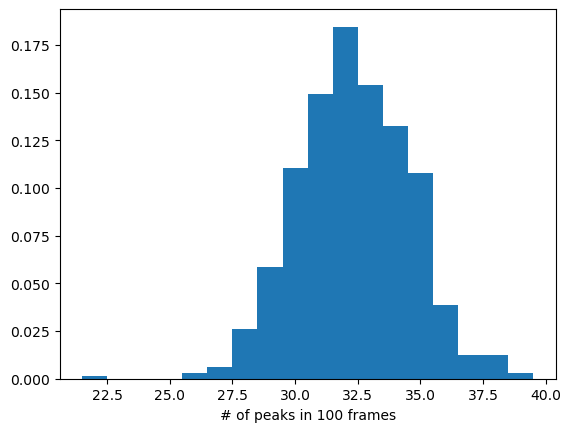

In [175]:
# Histogram of number of peaks in 100 frames

from scipy.signal import find_peaks

n_peaks = list()

for trace in traces:
    peaks, _ = find_peaks(trace)

    # plt.plot(trace)
    # plt.plot(peaks, trace[peaks], "x")
    # plt.ylim(0, 1)
    # plt.show()
    
    n_peaks.append(len(peaks))

n, bins, _ = plt.hist(n_peaks, bins=np.arange(np.array(n_peaks).min(), np.array(n_peaks).max()+2)-0.5, density=True, align='mid')
plt.xlabel('# of peaks in 100 frames')
plt.show()

15


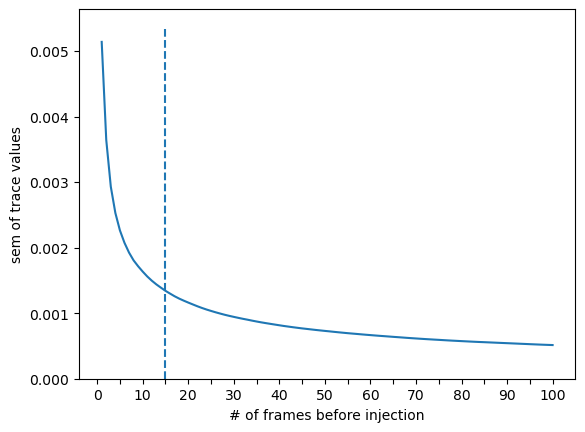

In [909]:
# Second way to determine baseline: elbow method

from kneed import KneeLocator

pre_frame_range = 100

x = np.arange(1, pre_frame_range+1)

sems = list()
for t in x:
    traces = list()

    for i, neuron in left_df.iterrows():
        pulses = neuron['pulse_frames']
        
        for pulse in pulses:
            start_frame = pulse - t  # when the neuron traces will start
            stop_frame = pulse  # when the neuron traces will end

            trace = neuron['raw_norm_dff'][start_frame:stop_frame]
            traces.extend(trace)

    for i, neuron in right_df.iterrows():
        pulses = neuron['pulse_frames']
        
        for pulse in pulses:
            start_frame = pulse - t  # when the neuron traces will start
            stop_frame = pulse  # when the neuron traces will end

            trace = neuron['raw_norm_dff'][start_frame:stop_frame]
            traces.extend(trace)

    sems.append(sem(traces))

kn = KneeLocator(x, sems, curve='convex', direction='decreasing')
print(kn.knee)

plt.plot(x, sems)
plt.vlines(kn.knee, 0, plt.ylim()[1], linestyles='dashed')
plt.ylim(0)
plt.xticks(np.arange(0, 101, 5))
_, labels = plt.xticks()
for label in labels[1::2]:
    label.set_visible(False)
plt.xlabel('# of frames before injection')
plt.ylabel('sem of trace values')
plt.show()

## Pulse averages

In [35]:
# Left activated

pre_frame_num = 15
post_frame_num = 30

normalize = True
key = 'raw_norm_temporal'

activated = left_df[left_df['activated'] == True]
traces = list()

plt.figure(figsize=(10, 10))

x = np.arange(0-pre_frame_num, 0+post_frame_num+1)

for i, neuron in activated.iterrows():
	pulses = neuron['pulse_frames']

	for pulse in pulses:
		start_frame = pulse - pre_frame_num  # when the neuron traces will start
		stop_frame = pulse + post_frame_num  # when the neuron traces will end

		trace = neuron[key][start_frame:stop_frame+1]

		if normalize:
			baseline = np.mean(neuron[key][start_frame:pulse])
			trace = trace - baseline

		traces.append(trace)

		plt.plot(x, trace, 'lightgray', alpha=0.5)

avg_trace = np.array(traces).mean(axis=0)
sems = sem(np.array(traces), axis=0)

plt.plot (x, avg_trace, zorder=102)
plt.fill_between(x, avg_trace-sems, avg_trace+sems, alpha=0.2, zorder=101)
plt.axvspan(-1, 0, color='red', lw=2, alpha=0.2, ec=None, zorder=100)

if normalize:
	plt.ylim(top=1, bottom=-0.50)
else:
	plt.ylim(top=1, bottom=0)
	
plt.title('Left, activated', fontsize=18)

plt.show()

NameError: name 'left_df' is not defined

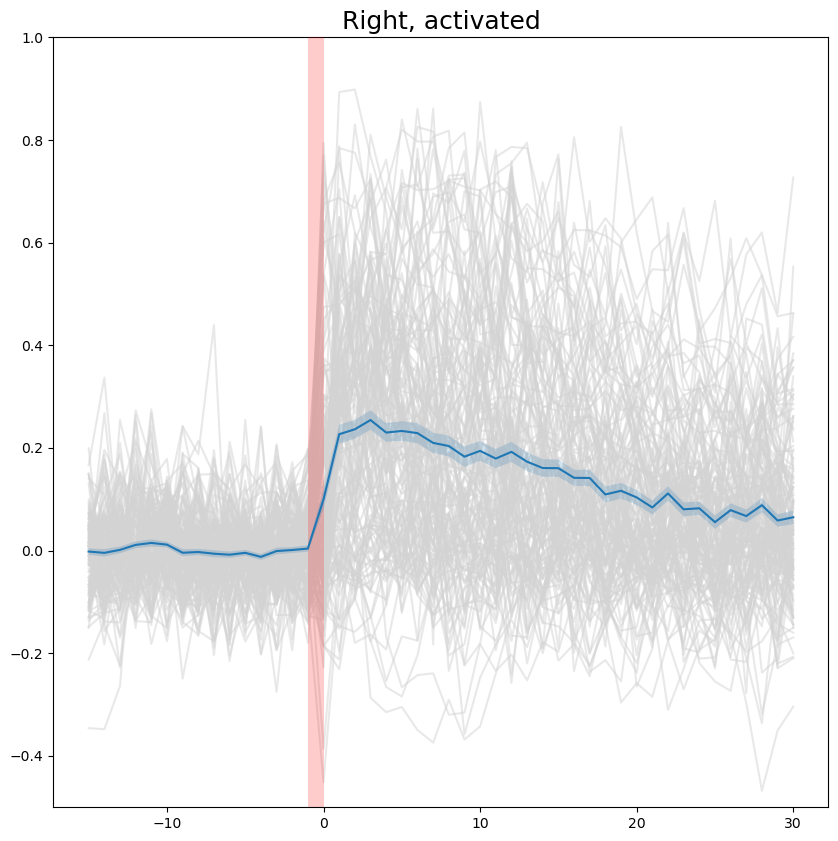

In [200]:
# Right activated

pre_frame_num = 15
post_frame_num = 30

normalize = True
key = 'raw_norm_temporal'

activated = right_df[right_df['activated'] == True]
traces = list()

plt.figure(figsize=(10, 10))

x = np.arange(0-pre_frame_num, 0+post_frame_num+1)

for i, neuron in activated.iterrows():
	pulses = neuron['pulse_frames']

	for pulse in pulses:
		start_frame = pulse - pre_frame_num  # when the neuron traces will start
		stop_frame = pulse + post_frame_num  # when the neuron traces will end

		trace = neuron[key][start_frame:stop_frame+1]

		if normalize:
			baseline = np.mean(neuron[key][start_frame:pulse])
			trace = trace - baseline
			
		traces.append(trace)

		plt.plot(x, trace, 'lightgray', alpha=0.5)

avg_trace = np.array(traces).mean(axis=0)
sems = sem(np.array(traces), axis=0)

plt.plot (x, avg_trace, zorder=102)
plt.fill_between(x, avg_trace-sems, avg_trace+sems, alpha=0.2, zorder=101)
plt.axvspan(-1, 0, color='red', lw=2, alpha=0.2, ec=None, zorder=100)

if normalize:
	plt.ylim(top=1, bottom=-0.5)
else:
	plt.ylim(top=1, bottom=0)
	
plt.title('Right, activated', fontsize=18)

plt.show()

/var/folders/48/8y2gqcvx5q5575kwkzngl6qw0000gn/T/ipykernel_78420/2224629868.py:33: RuntimeWarning: Mean of empty slice.
  avg_trace = np.array(traces).mean(axis=0)
/Users/minelarinel/mambaforge/envs/mescore/lib/python3.10/site-packages/numpy/core/_methods.py:129: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
/Users/minelarinel/mambaforge/envs/mescore/lib/python3.10/site-packages/numpy/core/_methods.py:206: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/Users/minelarinel/mambaforge/envs/mescore/lib/python3.10/site-packages/numpy/core/_methods.py:163: RuntimeWarning: invalid value encountered in divide
  arrmean = um.true_divide(arrmean, div, out=arrmean,
/Users/minelarinel/mambaforge/envs/mescore/lib/python3.10/site-packages/numpy/core/_methods.py:198: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


ValueError: x and y must have same first dimension, but have shapes (46,) and (1,)

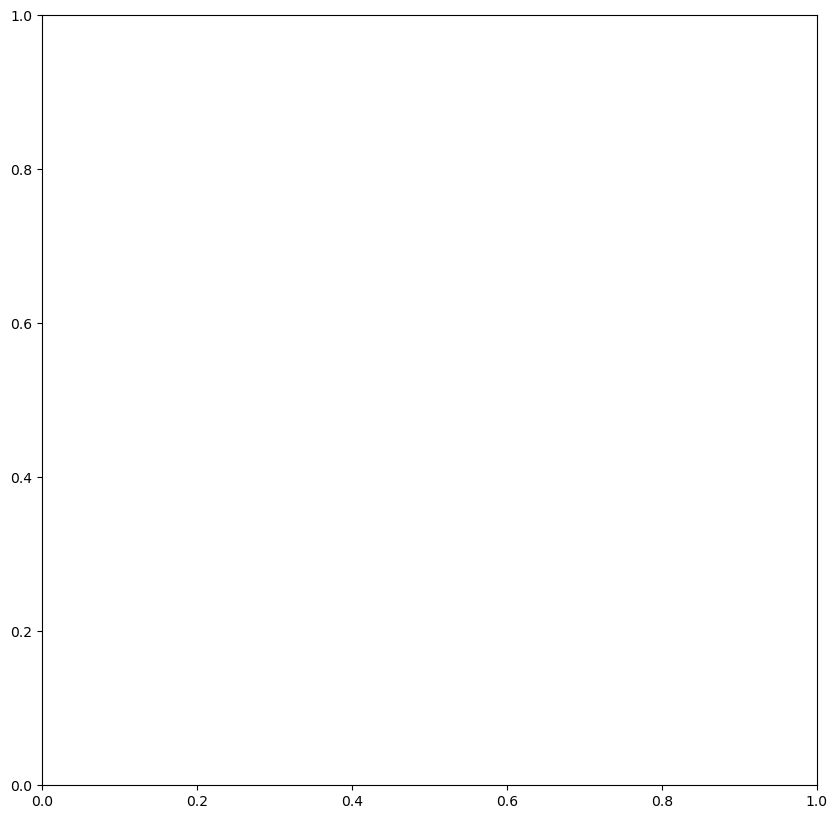

In [201]:
# Left inhibited

pre_frame_num = 15
post_frame_num = 30

normalize = True
key = 'raw_norm_temporal'

activated = left_df[left_df['inhibited'] == True]
traces = list()

plt.figure(figsize=(10, 10))

x = np.arange(0-pre_frame_num, 0+post_frame_num+1)

for i, neuron in activated.iterrows():
	pulses = neuron['pulse_frames']

	for pulse in pulses:
		start_frame = pulse - pre_frame_num  # when the neuron traces will start
		stop_frame = pulse + post_frame_num  # when the neuron traces will end

		trace = neuron[key][start_frame:stop_frame+1]

		if normalize:
			baseline = np.mean(neuron[key][start_frame:pulse])
			trace = trace - baseline

		traces.append(trace)

		plt.plot(x, trace, 'lightgray', alpha=0.5)

avg_trace = np.array(traces).mean(axis=0)
sems = sem(np.array(traces), axis=0)

plt.plot (x, avg_trace, zorder=102)
plt.fill_between(x, avg_trace-sems, avg_trace+sems, alpha=0.2, zorder=101)
plt.axvspan(-1, 0, color='red', lw=2, alpha=0.2, ec=None, zorder=100)

if normalize:
	plt.ylim(top=1, bottom=-0.5)
else:
	plt.ylim(top=1, bottom=0)
	
plt.title('Left, inhibited', fontsize=18)

plt.show()

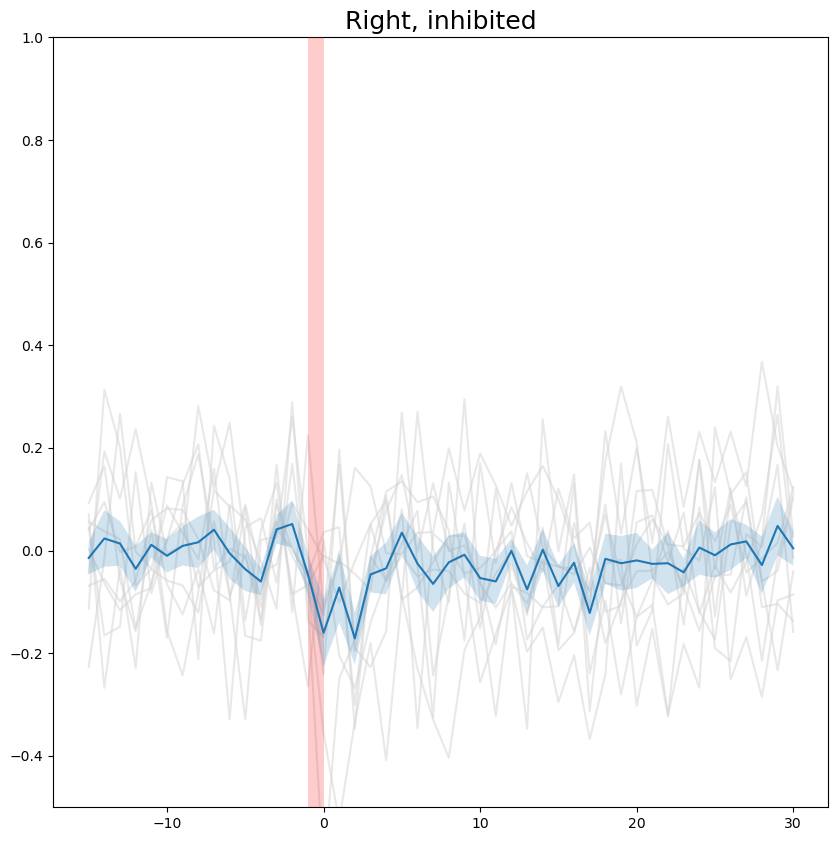

In [202]:
# Right inhibited

pre_frame_num = 15
post_frame_num = 30

normalize = True
key = 'raw_norm_temporal'

activated = right_df[right_df['inhibited'] == True]
traces = list()

plt.figure(figsize=(10, 10))

x = np.arange(0-pre_frame_num, 0+post_frame_num+1)

for i, neuron in activated.iterrows():
	pulses = neuron['pulse_frames']

	for pulse in pulses:
		start_frame = pulse - pre_frame_num  # when the neuron traces will start
		stop_frame = pulse + post_frame_num  # when the neuron traces will end

		trace = neuron[key][start_frame:stop_frame+1]

		if normalize:
			baseline = np.mean(neuron[key][start_frame:pulse])
			trace = trace - baseline

		traces.append(trace)

		plt.plot(x, trace, 'lightgray', alpha=0.5)

avg_trace = np.array(traces).mean(axis=0)
sems = sem(np.array(traces), axis=0)

plt.plot (x, avg_trace, zorder=102)
plt.fill_between(x, avg_trace-sems, avg_trace+sems, alpha=0.2, zorder=101)
plt.axvspan(-1, 0, color='red', lw=2, alpha=0.2, ec=None, zorder=100)

if normalize:
	plt.ylim(top=1, bottom=-0.5)
else:
	plt.ylim(top=1, bottom=0)
	
plt.title('Right, inhibited', fontsize=18)

plt.show()

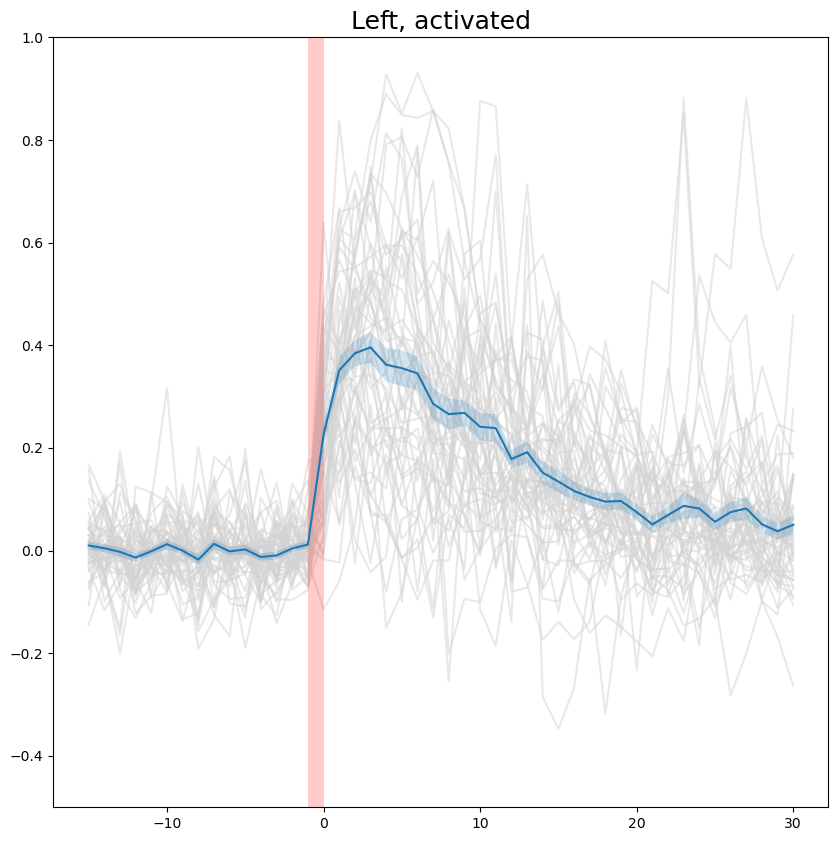

In [203]:
# Left activated - only the pulses that get activated

pre_frame_num = 15
post_frame_num = 30

normalize = True
key = 'raw_norm_temporal'

activated = left_df[left_df['activated'] == True]
traces = list()

plt.figure(figsize=(10, 10))

x = np.arange(0-pre_frame_num, 0+post_frame_num+1)

for i, neuron in activated.iterrows():
	responsive_pulses = [pr[0] for pr in neuron['pulse_response']]  # individual pulses that the neuron responded to
	pulse_activity = [pr[1] for pr in neuron['pulse_response']]  # if 1, activated, if 0, inhibited

	pulses = neuron['pulse_frames']

	for j, pulse in enumerate(responsive_pulses):
		if pulse_activity[j] == 1:
			start_frame = pulses[pulse-1] - pre_frame_num  # when the neuron traces will start
			stop_frame = pulses[pulse-1] + post_frame_num  # when the neuron traces will end

			trace = neuron[key][start_frame:stop_frame+1]

			if normalize:
				baseline = np.mean(neuron[key][start_frame:pulses[pulse-1]])
				trace = trace - baseline

			traces.append(trace)

			plt.plot(x, trace, 'lightgray', alpha=0.5)

avg_trace = np.array(traces).mean(axis=0)
sems = sem(np.array(traces), axis=0)

plt.plot (x, avg_trace, zorder=102)
plt.fill_between(x, avg_trace-sems, avg_trace+sems, alpha=0.2, zorder=101)
plt.axvspan(-1, 0, color='red', lw=2, alpha=0.2, ec=None, zorder=100)

if normalize:
	plt.ylim(top=1, bottom=-0.5)
else:
	plt.ylim(top=1, bottom=0)
	
plt.title('Left, activated', fontsize=18)

plt.show()

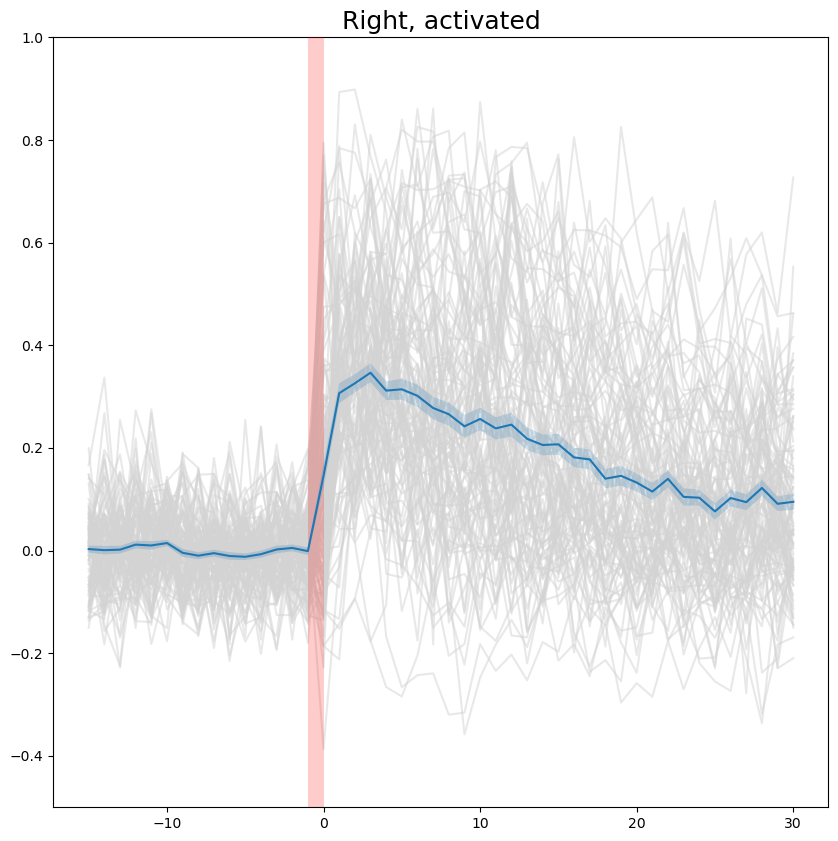

In [204]:
# Right activated - only the pulses that get activated

pre_frame_num = 15
post_frame_num = 30

normalize = True
key = 'raw_norm_temporal'

activated = right_df[right_df['activated'] == True]
traces = list()

plt.figure(figsize=(10, 10))

x = np.arange(0-pre_frame_num, 0+post_frame_num+1)

for i, neuron in activated.iterrows():
	responsive_pulses = [pr[0] for pr in neuron['pulse_response']]  # individual pulses that the neuron responded to
	pulse_activity = [pr[1] for pr in neuron['pulse_response']]  # if 1, activated, if 0, inhibited

	pulses = neuron['pulse_frames']

	for j, pulse in enumerate(responsive_pulses):
		if pulse_activity[j] == 1:
			start_frame = pulses[pulse-1] - pre_frame_num  # when the neuron traces will start
			stop_frame = pulses[pulse-1] + post_frame_num  # when the neuron traces will end

			trace = neuron[key][start_frame:stop_frame+1]

			if normalize:
				baseline = np.mean(neuron[key][start_frame:pulses[pulse-1]])
				trace = trace - baseline

			traces.append(trace)

			plt.plot(x, trace, 'lightgray', alpha=0.5)

avg_trace = np.array(traces).mean(axis=0)
sems = sem(np.array(traces), axis=0)

plt.plot (x, avg_trace, zorder=102)
plt.fill_between(x, avg_trace-sems, avg_trace+sems, alpha=0.2, zorder=101)
plt.axvspan(-1, 0, color='red', lw=2, alpha=0.2, ec=None, zorder=100)

if normalize:
	plt.ylim(top=1, bottom=-0.5)
else:
	plt.ylim(top=1, bottom=0)
	
plt.title('Right, activated', fontsize=18)

plt.show()

/var/folders/48/8y2gqcvx5q5575kwkzngl6qw0000gn/T/ipykernel_78420/2865368888.py:37: RuntimeWarning: Mean of empty slice.
  avg_trace = np.array(traces).mean(axis=0)


ValueError: x and y must have same first dimension, but have shapes (46,) and (1,)

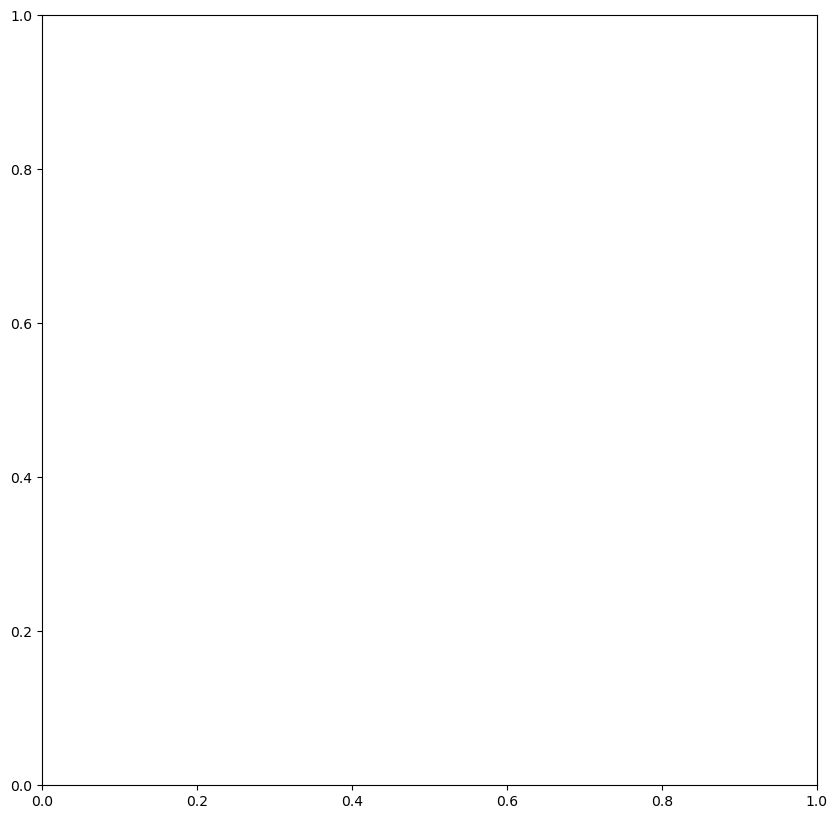

In [205]:
# Left inhibited - only the pulses that get activated

pre_frame_num = 15
post_frame_num = 30

normalize = True
key = 'raw_norm_temporal'

activated = left_df[left_df['inhibited'] == True]
traces = list()

plt.figure(figsize=(10, 10))

x = np.arange(0-pre_frame_num, 0+post_frame_num+1)

for i, neuron in activated.iterrows():
	responsive_pulses = [pr[0] for pr in neuron['pulse_response']]  # individual pulses that the neuron responded to
	pulse_activity = [pr[1] for pr in neuron['pulse_response']]  # if 1, activated, if 0, inhibited

	pulses = neuron['pulse_frames']

	for j, pulse in enumerate(responsive_pulses):
		if pulse_activity[j] == 0:
			start_frame = pulses[pulse-1] - pre_frame_num  # when the neuron traces will start
			stop_frame = pulses[pulse-1] + post_frame_num  # when the neuron traces will end

			trace = neuron[key][start_frame:stop_frame+1]

			if normalize:
				baseline = np.mean(neuron[key][start_frame:pulses[pulse-1]])
				trace = trace - baseline

			traces.append(trace)

			plt.plot(x, trace, 'lightgray', alpha=0.5)

avg_trace = np.array(traces).mean(axis=0)
sems = sem(np.array(traces), axis=0)

plt.plot (x, avg_trace, zorder=102)
plt.fill_between(x, avg_trace-sems, avg_trace+sems, alpha=0.2, zorder=101)
plt.axvspan(-1, 0, color='red', lw=2, alpha=0.2, ec=None, zorder=100)

if normalize:
	plt.ylim(top=1, bottom=-0.5)
else:
	plt.ylim(top=1, bottom=0)

plt.title('Left, inhibited', fontsize=18)

plt.show()

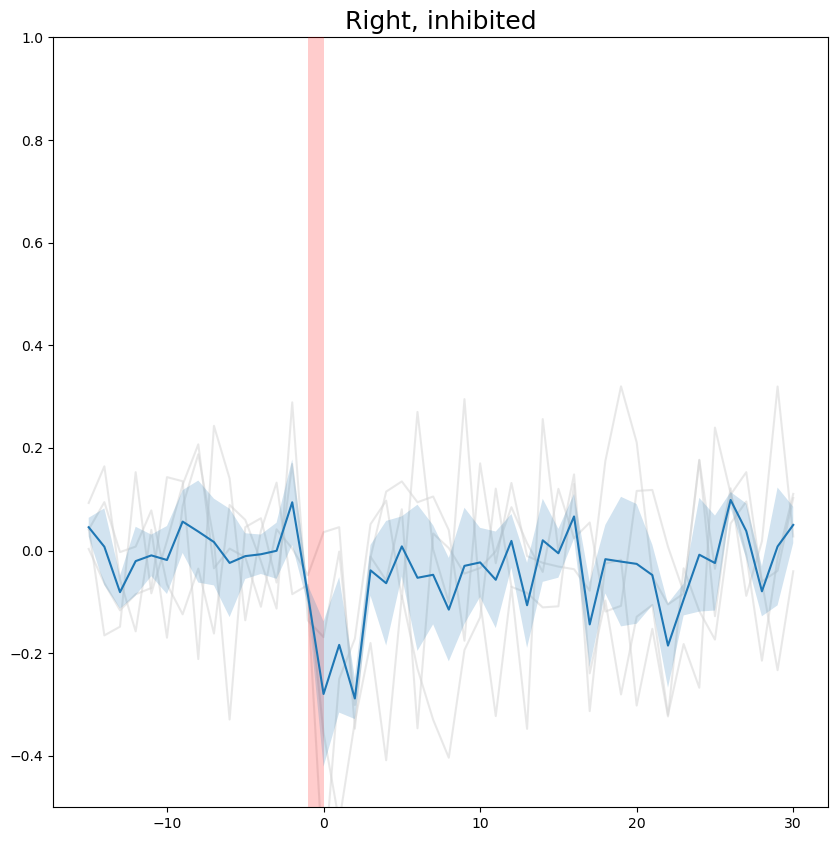

In [206]:
# Right inhibited - only the pulses that get activated

pre_frame_num = 15
post_frame_num = 30

normalize = True
key = 'raw_norm_temporal'

activated = right_df[right_df['inhibited'] == True]
traces = list()

plt.figure(figsize=(10, 10))

x = np.arange(0-pre_frame_num, 0+post_frame_num+1)

for i, neuron in activated.iterrows():
	responsive_pulses = [pr[0] for pr in neuron['pulse_response']]  # individual pulses that the neuron responded to
	pulse_activity = [pr[1] for pr in neuron['pulse_response']]  # if 1, activated, if 0, inhibited

	pulses = neuron['pulse_frames']

	for j, pulse in enumerate(responsive_pulses):
		if pulse_activity[j] == 0:
			start_frame = pulses[pulse-1] - pre_frame_num  # when the neuron traces will start
			stop_frame = pulses[pulse-1] + post_frame_num  # when the neuron traces will end

			trace = neuron[key][start_frame:stop_frame+1]

			if normalize:
				baseline = np.mean(neuron[key][start_frame:pulses[pulse-1]])
				trace = trace - baseline

			traces.append(trace)
			
			plt.plot(x, trace, 'lightgray', alpha=0.5)

avg_trace = np.array(traces).mean(axis=0)
sems = sem(np.array(traces), axis=0)

plt.plot (x, avg_trace, zorder=102)
plt.fill_between(x, avg_trace-sems, avg_trace+sems, alpha=0.2, zorder=101)
plt.axvspan(-1, 0, color='red', lw=2, alpha=0.2, ec=None, zorder=100)

if normalize:
	plt.ylim(top=1, bottom=-0.5)
else:
	plt.ylim(top=1, bottom=0)
	
plt.title('Right, inhibited', fontsize=18)

plt.show()

In [207]:
# number of pulse responses (e.g., responds to 3 out of 5 injections)

n_of_pulse_responses_L_act = list()
n_of_pulse_responses_L_inh = list()
n_of_pulse_responses_R_act = list()
n_of_pulse_responses_R_inh = list()

print('Left, activated')
d = left_df[(left_df['activated'] == True)]['pulse_response']

lens = np.array([len(i) for i in d])
for pulse in range(1, 6):
    print(f'pulse {pulse}: {np.count_nonzero(lens == pulse)}')
    n_of_pulse_responses_L_act.append(np.count_nonzero(lens == pulse))

print('\nLeft, inhibited')
d = left_df[(left_df['inhibited'] == True)]['pulse_response']

lens = np.array([len(i) for i in d])
for pulse in range(1, 6):
    print(f'pulse {pulse}: {np.count_nonzero(lens == pulse)}')
    n_of_pulse_responses_L_inh.append(np.count_nonzero(lens == pulse))

print('\nRight, activated')
d = right_df[(right_df['activated'] == True)]['pulse_response']

lens = np.array([len(i) for i in d])
for pulse in range(1, 6):
    print(f'pulse {pulse}: {np.count_nonzero(lens == pulse)}')
    n_of_pulse_responses_R_act.append(np.count_nonzero(lens == pulse))

print('\nRight, inhibited')
d = right_df[(right_df['inhibited'] == True)]['pulse_response']

lens = np.array([len(i) for i in d])
for pulse in range(1, 6):
    print(f'pulse {pulse}: {np.count_nonzero(lens == pulse)}')
    n_of_pulse_responses_R_inh.append(np.count_nonzero(lens == pulse))

Left, activated
pulse 1: 0
pulse 2: 0
pulse 3: 2
pulse 4: 9
pulse 5: 2

Left, inhibited
pulse 1: 0
pulse 2: 0
pulse 3: 0
pulse 4: 0
pulse 5: 0

Right, activated
pulse 1: 0
pulse 2: 2
pulse 3: 8
pulse 4: 17
pulse 5: 3

Right, inhibited
pulse 1: 0
pulse 2: 2
pulse 3: 0
pulse 4: 0
pulse 5: 0


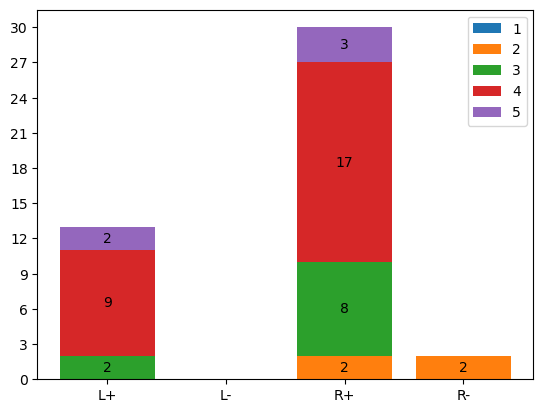

In [208]:
# number of pulse responses
x = ['L+', 'L-', 'R+', 'R-']

pulse_responses = [n_of_pulse_responses_L_act, n_of_pulse_responses_L_inh, n_of_pulse_responses_R_act, n_of_pulse_responses_R_inh]

for i, val in enumerate(n_of_pulse_responses_L_act):
	if i == 0:
		y1 = np.array([pr[i] for pr in pulse_responses])
	elif i == 1:
		y2 = np.array([pr[i] for pr in pulse_responses])
	elif i == 2:
		y3 = np.array([pr[i] for pr in pulse_responses])
	elif i == 3:
		y4 = np.array([pr[i] for pr in pulse_responses])
	elif i == 4:
		y5 = np.array([pr[i] for pr in pulse_responses])

p1 = plt.bar(x, y1, label='1')
p2 = plt.bar(x, y2, bottom=y1, label='2')
p3 = plt.bar(x, y3, bottom=y1+y2, label='3')
p4 = plt.bar(x, y4, bottom=y1+y2+y3, label='4')
p5 = plt.bar(x, y5, bottom=y1+y2+y3+y4, label='5')

plt.bar_label(p1, labels=[str(n) if n != 0 else '' for n in y1], label_type='center')
plt.bar_label(p2, labels=[str(n) if n != 0 else '' for n in y2], label_type='center')
plt.bar_label(p3, labels=[str(n) if n != 0 else '' for n in y3], label_type='center')
plt.bar_label(p4, labels=[str(n) if n != 0 else '' for n in y4], label_type='center')
plt.bar_label(p5, labels=[str(n) if n != 0 else '' for n in y5], label_type='center')

maxs = [np.sum(pr) for pr in pulse_responses]

plt.yticks(np.arange(np.max(maxs)+3, step=3))
plt.legend()
plt.show()

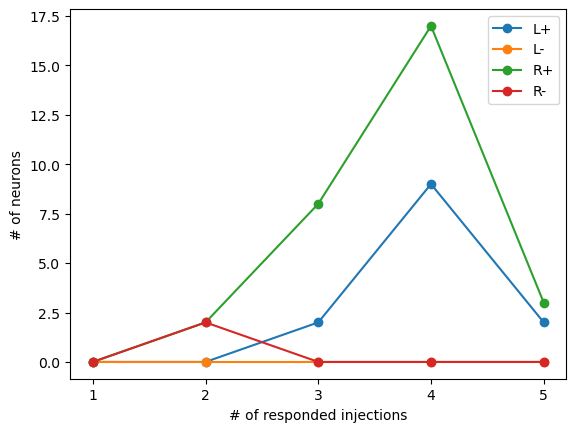

In [209]:
x = [1, 2, 3, 4, 5]

plt.plot(x, n_of_pulse_responses_L_act, label='L+', marker='o')
plt.plot(x, n_of_pulse_responses_L_inh, label='L-', marker='o')
plt.plot(x, n_of_pulse_responses_R_act, label='R+', marker='o')
plt.plot(x, n_of_pulse_responses_R_inh, label='R-', marker='o')

plt.xticks(x)
plt.legend()
plt.ylabel('# of neurons')
plt.xlabel('# of responded injections')
plt.show()

In [210]:
# Injection order of pulse responses

def injection_order_of_pulses(df):
    count_1 = 0
    count_2 = 0
    count_3 = 0
    count_4 = 0
    count_5 = 0

    for i in d:
        for inj in i:
            if inj[0] == 1:
                count_1 += 1
            elif inj[0] == 2:
                count_2 += 1
            elif inj[0] == 3:
                count_3 += 1
            elif inj[0] == 4:
                count_4 += 1
            elif inj[0] == 5:
                count_5 += 1

    print(count_1, count_2, count_3, count_4, count_5)
    return [count_1, count_2, count_3, count_4, count_5]

print('Left, activated')
d = left_df[(left_df['activated'] == True)]['pulse_response']
inj_order_pulses_L_act = injection_order_of_pulses(d)

print('\nLeft, inhibited')
d = left_df[(left_df['inhibited'] == True)]['pulse_response']
inj_order_pulses_L_inh = injection_order_of_pulses(d)

print('\nRight, activated')
d = right_df[(right_df['activated'] == True)]['pulse_response']
inj_order_pulses_R_act = injection_order_of_pulses(d)

print('\nRight, inhibited')
d = right_df[(right_df['inhibited'] == True)]['pulse_response']
inj_order_pulses_R_inh = injection_order_of_pulses(d)


Left, activated
13 13 11 13 2

Left, inhibited
0 0 0 0 0

Right, activated
22 27 11 26 25

Right, inhibited
1 0 1 1 1


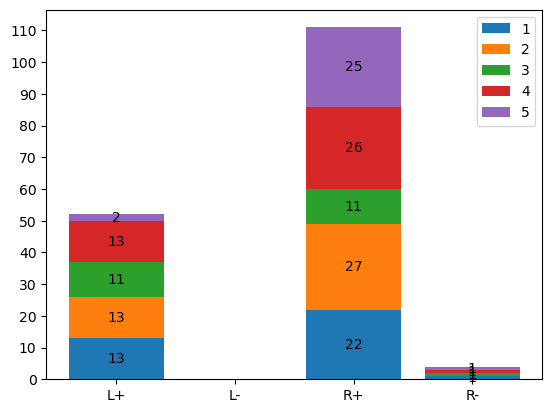

In [211]:
x = ['L+', 'L-', 'R+', 'R-']

injection_orders = [inj_order_pulses_L_act, inj_order_pulses_L_inh, inj_order_pulses_R_act, inj_order_pulses_R_inh]

for i, val in enumerate(inj_order_pulses_L_act):
	if i == 0:
		y1 = np.array([inj[i] for inj in injection_orders])
	elif i == 1:
		y2 = np.array([inj[i] for inj in injection_orders])
	elif i == 2:
		y3 = np.array([inj[i] for inj in injection_orders])
	elif i == 3:
		y4 = np.array([inj[i] for inj in injection_orders])
	elif i == 4:
		y5 = np.array([inj[i] for inj in injection_orders])

p1 = plt.bar(x, y1, label='1')
p2 = plt.bar(x, y2, bottom=y1, label='2')
p3 = plt.bar(x, y3, bottom=y1+y2, label='3')
p4 = plt.bar(x, y4, bottom=y1+y2+y3, label='4')
p5 = plt.bar(x, y5, bottom=y1+y2+y3+y4, label='5')

plt.bar_label(p1, labels=[str(n) if n != 0 else '' for n in y1], label_type='center')
plt.bar_label(p2, labels=[str(n) if n != 0 else '' for n in y2], label_type='center')
plt.bar_label(p3, labels=[str(n) if n != 0 else '' for n in y3], label_type='center')
plt.bar_label(p4, labels=[str(n) if n != 0 else '' for n in y4], label_type='center')
plt.bar_label(p5, labels=[str(n) if n != 0 else '' for n in y5], label_type='center')

maxs = [np.sum(inj) for inj in injection_orders]

plt.yticks(np.arange(np.max(maxs), step=10))
plt.legend()
plt.show()

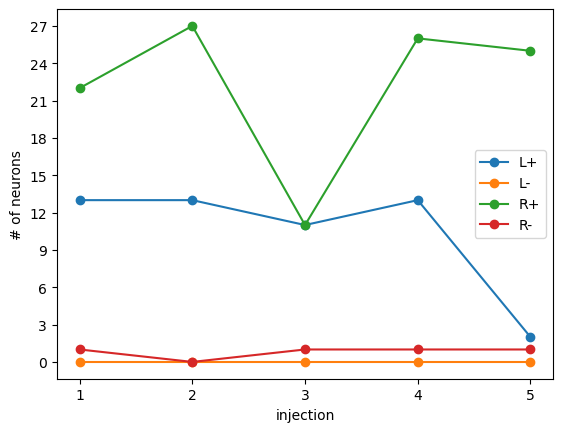

In [212]:
x = [1, 2, 3, 4, 5]

plt.plot(x, inj_order_pulses_L_act, label='L+', marker='o')
plt.plot(x, inj_order_pulses_L_inh, label='L-', marker='o')
plt.plot(x, inj_order_pulses_R_act, label='R+', marker='o')
plt.plot(x, inj_order_pulses_R_inh, label='R-', marker='o')

plt.xticks(x)
plt.yticks(np.arange(np.max([np.max(inj) for inj in injection_orders])+3, step=3))
plt.legend()
plt.ylabel('# of neurons')
plt.xlabel('injection')
plt.show()

In [213]:
fish.fps

1.3039181000348583

Left fish: [40]
Right fish: [37 42]


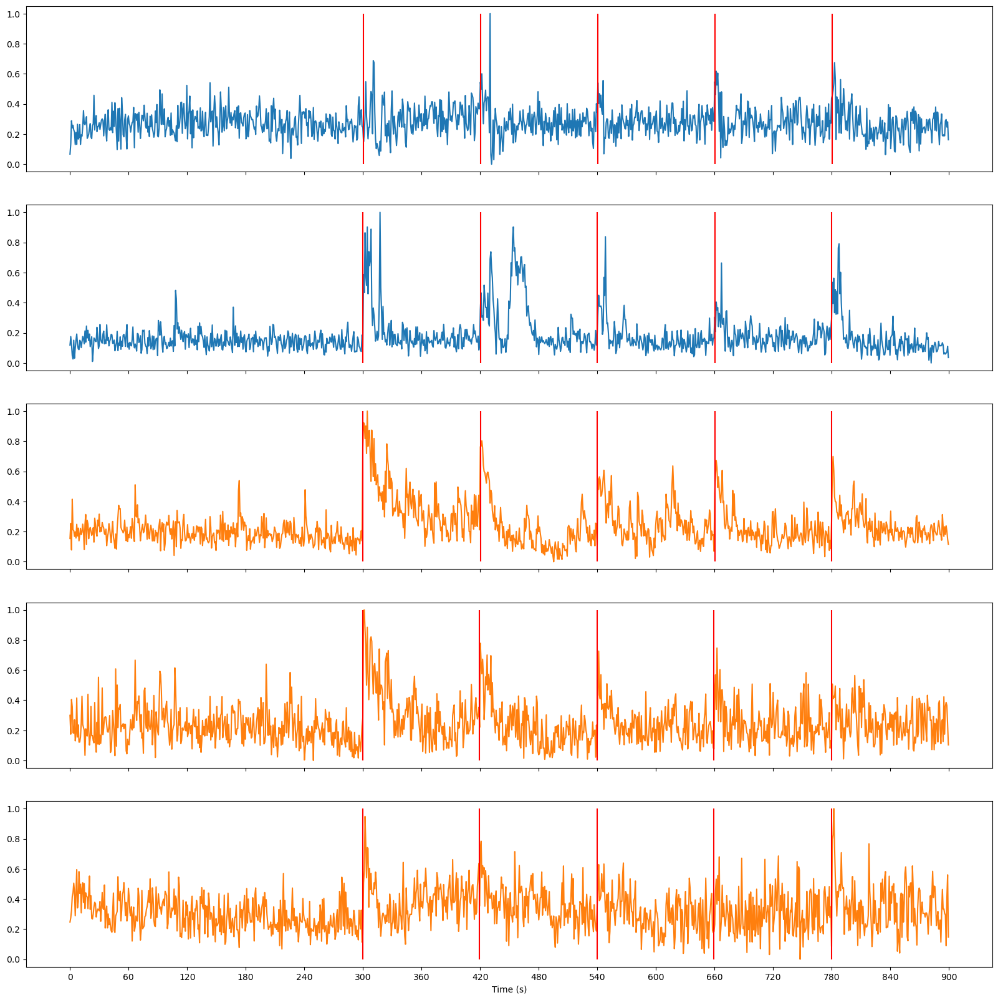

In [214]:
# Neurons that respond to all 5 injections

key = 'raw_norm_temporal'

d = left_df[left_df['responsive'] == True]
dr = right_df[right_df['responsive'] == True]

traces = list()
pulse_frames = list()

left_fish = list()
for i, row in d.iterrows():
	if len(row['pulse_response']) == 5:
		traces.append(row[key])
		pulse_frames.append(row['pulse_frames'])
		left_fish.append(row['fish_id'])

right_fish = list()
for i, row in dr.iterrows():
	if len(row['pulse_response']) == 5:
		traces.append(row[key])
		pulse_frames.append(row['pulse_frames'])
		right_fish.append(row['fish_id'])
        
print(f'Left fish: {np.unique(left_fish)}')
print(f'Right fish: {np.unique(right_fish)}')

fig, axes = plt.subplots(len(traces), 1, sharex=True, sharey=True, figsize=(20, 20))
for i, t in enumerate(traces):
	if i < len(left_fish):
		axes[i].plot(t)
	else:
		axes[i].plot(t, color='tab:orange')
        
	for pulse in pulse_frames[i]:
		axes[i].vlines(pulse, 0, 1, color='r')

ticks = np.arange(0, 16*60*1.3039181000348583, 60*1.3039181000348583)
plt.xticks(ticks=ticks, labels=np.round(ticks/fish.fps).astype(int))
plt.xlabel('Time (s)')
plt.show()

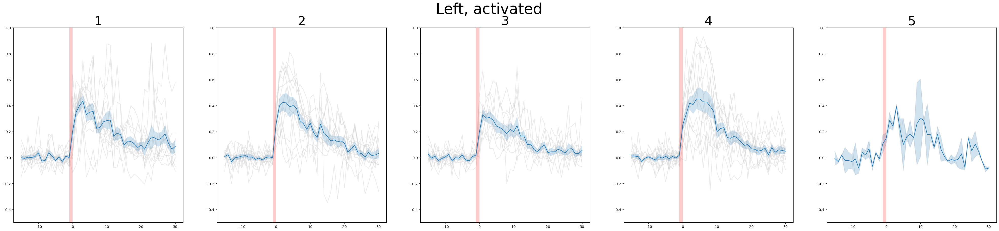

In [239]:
# Individual pulses

# Left activated - only the pulses that get activated

pre_frame_num = 15
post_frame_num = 30

normalize = True
key = 'raw_norm_temporal'

activated = left_df[left_df['activated'] == True]
L_traces = {
    1: list(),
    2: list(),
    3: list(),
    4: list(),
    5: list()
}

fig, axs = plt.subplots(1, 5, figsize=(50, 10))

x = np.arange(0-pre_frame_num, 0+post_frame_num+1)

for i, neuron in activated.iterrows():
	responsive_pulses = [pr[0] for pr in neuron['pulse_response']]  # individual pulses that the neuron responded to
	pulse_activity = [pr[1] for pr in neuron['pulse_response']]  # if 1, activated, if 0, inhibited

	pulses = neuron['pulse_frames']

	for j, pulse in enumerate(responsive_pulses):
		if pulse_activity[j] == 1:
			start_frame = pulses[pulse-1] - pre_frame_num  # when the neuron traces will start
			stop_frame = pulses[pulse-1] + post_frame_num  # when the neuron traces will end

			trace = neuron[key][start_frame:stop_frame+1]
			
			if normalize:
				baseline = np.mean(neuron[key][start_frame:pulses[pulse-1]])
				trace = trace - baseline

			L_traces[pulse].append(trace)

			axs[pulse-1].plot(x, trace, 'lightgray', alpha=0.5)

for pulse in L_traces:
	avg_trace = np.array(L_traces[pulse]).mean(axis=0)
	sems = sem(np.array(L_traces[pulse]), axis=0)

	axs[pulse-1].plot (x, avg_trace, zorder=102)
	axs[pulse-1].fill_between(x, avg_trace-sems, avg_trace+sems, alpha=0.2, zorder=101)
	axs[pulse-1].axvspan(-1, 0, color='red', lw=2, alpha=0.2, ec=None, zorder=100)

	if normalize:
		axs[pulse-1].set_ylim(top=1, bottom=-0.5)
	else:
		axs[pulse-1].set_ylim(top=1, bottom=0)

	axs[pulse-1].set_title(pulse, fontsize=36)

plt.suptitle('Left, activated', fontsize=42)

plt.show()

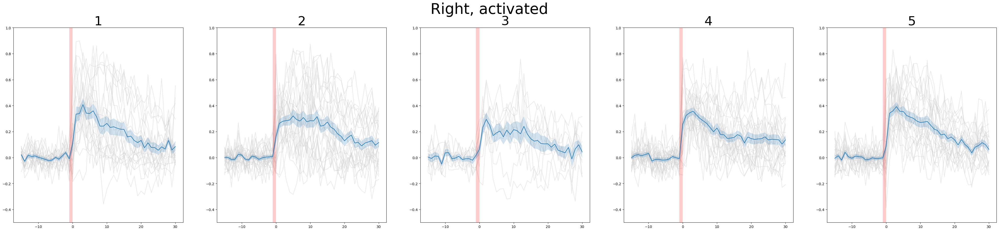

In [240]:
# Individual pulses

# Right activated - only the pulses that get activated

pre_frame_num = 15
post_frame_num = 30 

normalize = True
key = 'raw_norm_temporal'

activated = right_df[right_df['activated'] == True]
R_traces = {
    1: list(),
    2: list(),
    3: list(),
    4: list(),
    5: list()
}

fig, axs = plt.subplots(1, 5, figsize=(50, 10))

x = np.arange(0-pre_frame_num, 0+post_frame_num+1)

for i, neuron in activated.iterrows():
	responsive_pulses = [pr[0] for pr in neuron['pulse_response']]  # individual pulses that the neuron responded to
	pulse_activity = [pr[1] for pr in neuron['pulse_response']]  # if 1, activated, if 0, inhibited

	pulses = neuron['pulse_frames']

	for j, pulse in enumerate(responsive_pulses):
		if pulse_activity[j] == 1:
			start_frame = pulses[pulse-1] - pre_frame_num  # when the neuron traces will start
			stop_frame = pulses[pulse-1] + post_frame_num  # when the neuron traces will end

			trace = neuron[key][start_frame:stop_frame+1]
			
			if normalize:
				baseline = np.mean(neuron[key][start_frame:pulses[pulse-1]])
				trace = trace - baseline

			R_traces[pulse].append(trace)

			axs[pulse-1].plot(x, trace, 'lightgray', alpha=0.5)

for pulse in R_traces:
	avg_trace = np.array(R_traces[pulse]).mean(axis=0)
	sems = sem(np.array(R_traces[pulse]), axis=0)

	try:
		axs[pulse-1].plot (x, avg_trace, zorder=102)
		axs[pulse-1].fill_between(x, avg_trace-sems, avg_trace+sems, alpha=0.2, zorder=101)
		axs[pulse-1].axvspan(-1, 0, color='red', lw=2, alpha=0.2, ec=None, zorder=100)

		if normalize:
			axs[pulse-1].set_ylim(top=1, bottom=-0.5)
		else:
			axs[pulse-1].set_ylim(top=1, bottom=0)

		axs[pulse-1].set_title(pulse, fontsize=36)
	except:
		# if there are no traces for a pulse
		pass

plt.suptitle('Right, activated', fontsize=42)

plt.show()

In [217]:
# Print out peaks for each pulse

peak_values = {
    'left': list(),
    'right': list()
}

for pulse in L_traces:
	try:
		avg_trace = np.array(L_traces[pulse]).mean(axis=0)
		post_inj_t = avg_trace[pre_frame_num:]
		peak_values['left'].append(np.max(post_inj_t))
	except:
		pass

for pulse in R_traces:
	try:
		avg_trace = np.array(R_traces[pulse]).mean(axis=0)
		post_inj_t = avg_trace[pre_frame_num:]
		peak_values['right'].append(np.max(post_inj_t))
	except:
		pass

peak_values = dict([(k,pd.Series(v)) for k,v in peak_values.items()])
print(peak_values)
pd.DataFrame(peak_values).set_index([pd.Index(np.arange(1, 6))]).to_clipboard()


{'left': 0    0.434398
1    0.424791
2    0.330931
3    0.450848
4    0.392571
dtype: float64, 'right': 0    0.407964
1    0.320185
2    0.293865
3    0.356552
4    0.392245
dtype: float64}


In [241]:
# Print out peaks for each neuron

peak_values_per_neuron = {
    'left': list(),
    'right': list()
}

for pulse in L_traces:
	for trace in L_traces[pulse]:
		post_inj_t = trace[pre_frame_num:]
		peak_values_per_neuron['left'].append(np.max(post_inj_t))

for pulse in R_traces:
	for trace in R_traces[pulse]:
		post_inj_t = trace[pre_frame_num:]
		peak_values_per_neuron['right'].append(np.max(post_inj_t))

peak_values_per_neuron = dict([(k,pd.Series(v)) for k,v in peak_values_per_neuron.items()])
print(peak_values_per_neuron)
pd.DataFrame(peak_values_per_neuron).to_clipboard()

{'left': 0     0.424647
1     0.881345
2     0.881921
3     0.638416
4     0.535744
5     0.598704
6     0.511501
7     0.591114
8     0.476000
9     0.619246
10    0.465164
11    0.529053
12    0.509058
13    0.652303
14    0.486634
15    0.576430
16    0.437126
17    0.278266
18    0.696550
19    0.679746
20    0.813308
21    0.699282
22    0.734819
23    0.536437
24    0.611114
25    0.552073
26    0.285288
27    0.439653
28    0.700083
29    0.667394
30    0.434842
31    0.351259
32    0.414231
33    0.239886
34    0.578448
35    0.393435
36    0.592161
37    0.319562
38    0.263507
39    0.511794
40    0.606716
41    0.346906
42    0.734027
43    0.860253
44    0.567092
45    0.930116
46    0.453215
47    0.836891
48    0.889039
49    0.822704
50    0.409570
51    0.603609
dtype: float64, 'right': 0      0.375752
1      0.470724
2      0.692357
3      0.809979
4      0.221174
         ...   
106    0.722334
107    0.534138
108    0.298437
109    0.365258
110    0.686948
Length: 11

In [219]:
# Print out peaks for each pulse for each neuron

left_peak_values_per_pulse = dict()
for pulse in L_traces:
	left_peak_values_per_pulse[f'pulse {pulse}'] = list()

	for trace in L_traces[pulse]:
		post_inj_t = trace[pre_frame_num:]
		left_peak_values_per_pulse[f'pulse {pulse}'].append(np.max(post_inj_t))

right_peak_values_per_pulse = dict()
for pulse in R_traces:
	right_peak_values_per_pulse[f'pulse {pulse}'] = list()

	for trace in R_traces[pulse]:
		post_inj_t = trace[pre_frame_num:]
		right_peak_values_per_pulse[f'pulse {pulse}'].append(np.max(post_inj_t))

left_peak_values_per_pulse = dict([(k,pd.Series(v)) for k,v in left_peak_values_per_pulse.items()])
right_peak_values_per_pulse = dict([(k,pd.Series(v)) for k,v in right_peak_values_per_pulse.items()])
print(pd.concat([pd.DataFrame(left_peak_values_per_pulse), pd.DataFrame(right_peak_values_per_pulse)], axis=1))
pd.concat([pd.DataFrame(left_peak_values_per_pulse), pd.DataFrame(right_peak_values_per_pulse)], axis=1).to_clipboard()

     pulse 1   pulse 2   pulse 3   pulse 4   pulse 5   pulse 1   pulse 2  \
0   0.424647  0.652303  0.285288  0.319562  0.409570  0.375752  0.433896   
1   0.881345  0.486634  0.439653  0.263507  0.603609  0.470724  0.839917   
2   0.881921  0.576430  0.700083  0.511794       NaN  0.692357  0.733306   
3   0.638416  0.437126  0.667394  0.606716       NaN  0.809979  0.535387   
4   0.535744  0.278266  0.434842  0.346906       NaN  0.221174  0.576598   
5   0.598704  0.696550  0.351259  0.734027       NaN  0.297430  0.873976   
6   0.511501  0.679746  0.414231  0.860253       NaN  0.400369  0.820169   
7   0.591114  0.813308  0.239886  0.567092       NaN  0.553044  0.772082   
8   0.476000  0.699282  0.578448  0.930116       NaN  0.704338  0.794514   
9   0.619246  0.734819  0.393435  0.453215       NaN  0.438704  0.380945   
10  0.465164  0.536437  0.592161  0.836891       NaN  0.473734  0.447037   
11  0.529053  0.611114       NaN  0.889039       NaN  0.552628  0.515962   
12  0.509058

In [116]:
# Print out CHANGE IN peaks for each neuron

change_in_peak_values_per_neuron = {
    'left': list(),
    'right': list()
}

for pulse in L_traces:
	for trace in L_traces[pulse]:
		baseline = np.median(trace[:pre_frame_num])
		post_inj_t = trace[pre_frame_num:]
		change_in_peak_values_per_neuron['left'].append(np.max(post_inj_t)-baseline)

for pulse in R_traces:
	for trace in R_traces[pulse]:
		baseline = np.median(trace[:pre_frame_num])
		post_inj_t = trace[pre_frame_num:]
		change_in_peak_values_per_neuron['right'].append(np.max(post_inj_t)-baseline)

change_in_peak_values_per_neuron = dict([(k,pd.Series(v)) for k,v in change_in_peak_values_per_neuron.items()])
print(change_in_peak_values_per_neuron)
pd.DataFrame(change_in_peak_values_per_neuron).to_clipboard()

{'left': 0     0.435673
1     0.896926
2     0.639747
3     0.561774
4     0.611845
5     0.513351
6     0.586152
7     0.478674
8     0.616941
9     0.476321
10    0.534155
11    0.515692
12    0.631376
13    0.574370
14    0.445641
15    0.296743
16    0.692403
17    0.669854
18    0.813533
19    0.703317
20    0.726070
21    0.531207
22    0.605845
23    0.576041
24    0.273105
25    0.709321
26    0.293763
27    0.658352
28    0.431974
29    0.353723
30    0.413828
31    0.582087
32    0.405039
33    0.568529
34    0.324280
35    0.516399
36    0.618316
37    0.365849
38    0.739580
39    0.862902
40    0.577518
41    0.937835
42    0.454950
43    0.841152
44    0.892933
45    0.828020
46    0.426232
47    0.595120
dtype: float64, 'right': 0     0.383073
1     0.490342
2     0.687239
3     0.832818
4     0.224367
        ...   
78    0.567824
79    0.529297
80    0.292278
81    0.359790
82    0.708143
Length: 83, dtype: float64}


In [115]:
# Print out CHANGE IN peaks for each pulse for each neuron

left_change_in_peak_values_per_pulse = dict()
for pulse in L_traces:
	left_change_in_peak_values_per_pulse[f'pulse {pulse}'] = list()

	for trace in L_traces[pulse]:
		baseline = np.median(trace[:pre_frame_num])
		post_inj_t = trace[pre_frame_num:]
		left_change_in_peak_values_per_pulse[f'pulse {pulse}'].append(np.max(post_inj_t)-baseline)

right_change_in_peak_values_per_pulse = dict()
for pulse in R_traces:
	right_change_in_peak_values_per_pulse[f'pulse {pulse}'] = list()

	for trace in R_traces[pulse]:
		baseline = np.median(trace[:pre_frame_num])
		post_inj_t = trace[pre_frame_num:]
		right_change_in_peak_values_per_pulse[f'pulse {pulse}'].append(np.max(post_inj_t)-baseline)

left_change_in_peak_values_per_pulse = dict([(k,pd.Series(v)) for k,v in left_change_in_peak_values_per_pulse.items()])
right_change_in_peak_values_per_pulse = dict([(k,pd.Series(v)) for k,v in right_change_in_peak_values_per_pulse.items()])
print(pd.concat([pd.DataFrame(left_change_in_peak_values_per_pulse), pd.DataFrame(right_change_in_peak_values_per_pulse)], axis=1))
pd.concat([pd.DataFrame(left_change_in_peak_values_per_pulse), pd.DataFrame(right_change_in_peak_values_per_pulse)], axis=1).to_clipboard()

     pulse 1   pulse 2   pulse 3   pulse 4   pulse 5   pulse 1   pulse 2  \
0   0.435673  0.631376  0.273105  0.324280  0.426232  0.383073  0.437471   
1   0.896926  0.574370  0.709321  0.516399  0.595120  0.490342  0.842637   
2   0.639747  0.445641  0.293763  0.618316       NaN  0.687239  0.735493   
3   0.561774  0.296743  0.658352  0.365849       NaN  0.832818  0.515272   
4   0.611845  0.692403  0.431974  0.739580       NaN  0.224367  0.596677   
5   0.513351  0.669854  0.353723  0.862902       NaN  0.305777  0.857438   
6   0.586152  0.813533  0.413828  0.577518       NaN  0.406367  0.824770   
7   0.478674  0.703317  0.582087  0.937835       NaN  0.547465  0.759640   
8   0.616941  0.726070  0.405039  0.454950       NaN  0.724147  0.795030   
9   0.476321  0.531207  0.568529  0.841152       NaN  0.444989  0.359712   
10  0.534155  0.605845       NaN  0.892933       NaN  0.477480  0.720624   
11  0.515692  0.576041       NaN  0.828020       NaN  0.665333  0.536176   
12       NaN

In [220]:
# Print out latency to peak for each pulse

latency_to_peak = {
    'left': list(),
    'right': list()
}

for pulse in L_traces:
	avg_trace = np.array(L_traces[pulse]).mean(axis=0)
	post_inj_t = avg_trace[pre_frame_num:]
	latency_to_peak['left'].append(np.argmax(post_inj_t)/fps)


for pulse in R_traces:
	avg_trace = np.array(R_traces[pulse]).mean(axis=0)
	post_inj_t = avg_trace[pre_frame_num:]
	latency_to_peak['right'].append(np.argmax(post_inj_t)/fps)
    
latency_to_peak = dict([(k,pd.Series(v)) for k,v in latency_to_peak.items()])
print(latency_to_peak)
pd.DataFrame(latency_to_peak).set_index([pd.Index(np.arange(1, 6))]).to_clipboard()

{'left': 0    2.300758
1    1.533839
2    0.766919
3    3.834597
4    2.300758
dtype: float64, 'right': 0    2.300758
1    3.834597
2    1.533839
3    2.300758
4    2.300758
dtype: float64}


In [242]:
# Print out latencies to peak for each neuron

fps = 1.3039181000348583

latency_to_peak_per_neuron = {
    'left': list(),
    'right': list()
}

for pulse in L_traces:
	for trace in L_traces[pulse]:
		post_inj_t = trace[pre_frame_num:]
		latency_to_peak_per_neuron['left'].append(np.argmax(post_inj_t)/fps)

for pulse in R_traces:
	for trace in R_traces[pulse]:
		post_inj_t = trace[pre_frame_num:]
		latency_to_peak_per_neuron['right'].append(np.argmax(post_inj_t)/fps)

latency_to_peak_per_neuron = dict([(k,pd.Series(v)) for k,v in latency_to_peak_per_neuron.items()])
print(latency_to_peak_per_neuron)
pd.DataFrame(latency_to_peak_per_neuron).to_clipboard()

{'left': 0      9.969951
1     20.706822
2     17.639145
3      0.000000
4     18.406064
5      2.300758
6      1.533839
7      0.766919
8      1.533839
9      3.834597
10     1.533839
11     2.300758
12     1.533839
13     9.969951
14    11.503790
15    10.736871
16    11.503790
17     7.669193
18     1.533839
19     2.300758
20     3.067677
21     2.300758
22     2.300758
23     2.300758
24     4.601516
25     3.067677
26     5.368435
27     9.969951
28     8.436113
29     0.766919
30     0.000000
31     0.000000
32     0.766919
33     3.067677
34     3.834597
35     2.300758
36     3.067677
37     1.533839
38     1.533839
39     6.902274
40     6.135355
41     4.601516
42     2.300758
43     5.368435
44     0.766919
45     4.601516
46     3.067677
47     0.766919
48     3.067677
49     3.834597
50     2.300758
51     7.669193
dtype: float64, 'right': 0      2.300758
1      1.533839
2      1.533839
3      2.300758
4      0.000000
         ...   
106    6.135355
107    1.533839
108   

In [222]:
# Print out latencies to peak for each pulse for each neuron

fps = 1.3039181000348583

left_latency_per_pulse = dict()
for pulse in L_traces:
	left_latency_per_pulse[f'pulse {pulse}'] = list()

	for trace in L_traces[pulse]:
		post_inj_t = trace[pre_frame_num:]
		left_latency_per_pulse[f'pulse {pulse}'].append(np.argmax(post_inj_t)/fps)

right_latency_per_pulse = dict()
for pulse in R_traces:
	right_latency_per_pulse[f'pulse {pulse}'] = list()

	for trace in R_traces[pulse]:
		post_inj_t = trace[pre_frame_num:]
		right_latency_per_pulse[f'pulse {pulse}'].append(np.argmax(post_inj_t)/fps)

left_latency_per_pulse = dict([(k,pd.Series(v)) for k,v in left_latency_per_pulse.items()])
right_latency_per_pulse = dict([(k,pd.Series(v)) for k,v in right_latency_per_pulse.items()])
print(pd.concat([pd.DataFrame(left_latency_per_pulse), pd.DataFrame(right_latency_per_pulse)], axis=1))
pd.concat([pd.DataFrame(left_latency_per_pulse), pd.DataFrame(right_latency_per_pulse)], axis=1).to_clipboard()

      pulse 1    pulse 2   pulse 3   pulse 4   pulse 5   pulse 1    pulse 2  \
0    9.969951   9.969951  5.368435  1.533839  2.300758  2.300758   2.300758   
1   20.706822  11.503790  9.969951  1.533839  7.669193  1.533839   3.834597   
2   17.639145  10.736871  8.436113  6.902274       NaN  1.533839   2.300758   
3    0.000000  11.503790  0.766919  6.135355       NaN  2.300758   0.000000   
4   18.406064   7.669193  0.000000  4.601516       NaN  0.000000   0.766919   
5    2.300758   1.533839  0.000000  2.300758       NaN  1.533839   7.669193   
6    1.533839   2.300758  0.766919  5.368435       NaN  2.300758   3.834597   
7    0.766919   3.067677  3.067677  0.766919       NaN  0.766919  11.503790   
8    1.533839   2.300758  3.834597  4.601516       NaN  0.766919   0.000000   
9    3.834597   2.300758  2.300758  3.067677       NaN  2.300758   1.533839   
10   1.533839   2.300758  3.067677  0.766919       NaN  0.766919  13.037629   
11   2.300758   4.601516       NaN  3.067677       N

In [249]:
120*fish.fps

156.47017200418298

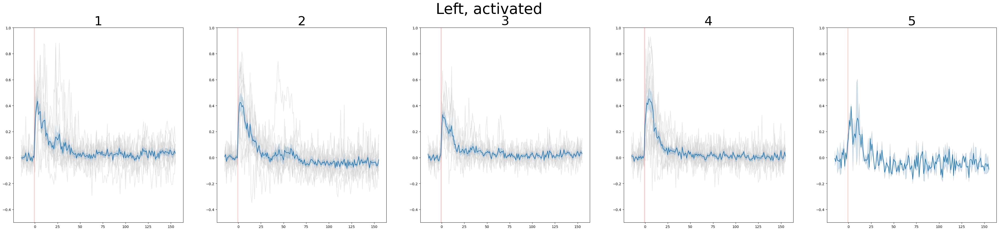

In [252]:
# Individual pulses

# Left activated - only the pulses that get activated

pre_frame_num = 15
post_frame_num = 155

normalize = True
key = 'raw_norm_temporal'

activated = left_df[left_df['activated'] == True]
L_traces = {
    1: list(),
    2: list(),
    3: list(),
    4: list(),
    5: list()
}

fig, axs = plt.subplots(1, 5, figsize=(50, 10))

x = np.arange(0-pre_frame_num, 0+post_frame_num+1)

for i, neuron in activated.iterrows():
	responsive_pulses = [pr[0] for pr in neuron['pulse_response']]  # individual pulses that the neuron responded to
	pulse_activity = [pr[1] for pr in neuron['pulse_response']]  # if 1, activated, if 0, inhibited

	pulses = neuron['pulse_frames']

	for j, pulse in enumerate(responsive_pulses):
		if pulse_activity[j] == 1:
			start_frame = pulses[pulse-1] - pre_frame_num  # when the neuron traces will start
			stop_frame = pulses[pulse-1] + post_frame_num  # when the neuron traces will end

			trace = neuron[key][start_frame:stop_frame+1]
			
			if normalize:
				baseline = np.mean(neuron[key][start_frame:pulses[pulse-1]])
				trace = trace - baseline

			L_traces[pulse].append(trace)

			axs[pulse-1].plot(x, trace, 'lightgray', alpha=0.5)

for pulse in L_traces:
	avg_trace = np.array(L_traces[pulse]).mean(axis=0)
	sems = sem(np.array(L_traces[pulse]), axis=0)

	axs[pulse-1].plot (x, avg_trace, zorder=102)
	axs[pulse-1].fill_between(x, avg_trace-sems, avg_trace+sems, alpha=0.2, zorder=101)
	axs[pulse-1].axvspan(-1, 0, color='red', lw=2, alpha=0.2, ec=None, zorder=100)

	if normalize:
		axs[pulse-1].set_ylim(top=1, bottom=-0.5)
	else:
		axs[pulse-1].set_ylim(top=1, bottom=0)
		
	axs[pulse-1].set_title(pulse, fontsize=36)

plt.suptitle('Left, activated', fontsize=42)

plt.show()

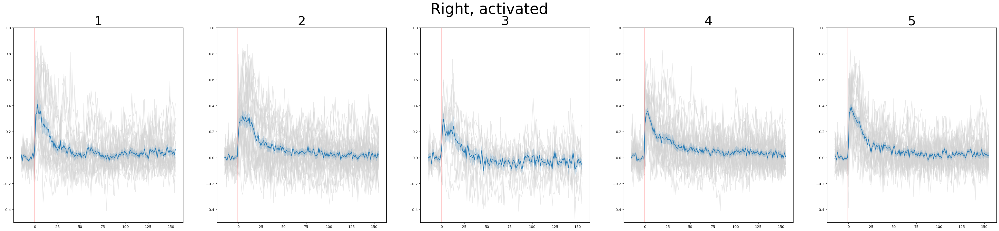

In [253]:
# Individual pulses

# Right activated - only the pulses that get activated

pre_frame_num = 15
post_frame_num = 155 

normalize = True
key = 'raw_norm_temporal'

activated = right_df[right_df['activated'] == True]
R_traces = {
    1: list(),
    2: list(),
    3: list(),
    4: list(),
    5: list()
}

fig, axs = plt.subplots(1, 5, figsize=(50, 10))

x = np.arange(0-pre_frame_num, 0+post_frame_num+1)

for i, neuron in activated.iterrows():
	responsive_pulses = [pr[0] for pr in neuron['pulse_response']]  # individual pulses that the neuron responded to
	pulse_activity = [pr[1] for pr in neuron['pulse_response']]  # if 1, activated, if 0, inhibited

	pulses = neuron['pulse_frames']

	for j, pulse in enumerate(responsive_pulses):
		if pulse_activity[j] == 1:
			start_frame = pulses[pulse-1] - pre_frame_num  # when the neuron traces will start
			stop_frame = pulses[pulse-1] + post_frame_num  # when the neuron traces will end

			trace = neuron[key][start_frame:stop_frame+1]
			
			if normalize:
				baseline = np.mean(neuron[key][start_frame:pulses[pulse-1]])
				trace = trace - baseline

			R_traces[pulse].append(trace)

			axs[pulse-1].plot(x, trace, 'lightgray', alpha=0.5)

for pulse in R_traces:
	avg_trace = np.array(R_traces[pulse]).mean(axis=0)
	sems = sem(np.array(R_traces[pulse]), axis=0)

	try:
		axs[pulse-1].plot (x, avg_trace, zorder=102)
		axs[pulse-1].fill_between(x, avg_trace-sems, avg_trace+sems, alpha=0.2, zorder=101)
		axs[pulse-1].axvspan(-1, 0, color='red', lw=2, alpha=0.2, ec=None, zorder=100)

		if normalize:
			axs[pulse-1].set_ylim(top=1, bottom=-0.5)
		else:
			axs[pulse-1].set_ylim(top=1, bottom=0)
			
		axs[pulse-1].set_title(pulse, fontsize=36)
	except:
		# if there are no traces for a pulse
		pass

plt.suptitle('Right, activated', fontsize=42)

plt.show()

In [254]:
# Time to decay
import scipy.stats as stats 

non_sig_cutoff = 3  # if this number of frames are non-significant consecutively, the response has decayed

decays = {
    'left': list(),
    'right': list()
}

for pulse in L_traces:
    baseline_distribution = np.array(L_traces[pulse])[:, :pre_frame_num].flatten()

    final_sig_frame = 0  # keep track of the last significant frame
    for t in range(pre_frame_num, np.array(L_traces[pulse]).shape[1]):
        arr = np.array(L_traces[pulse])[:, t]
        frame = t-pre_frame_num

        t_statistic, p_value = stats.ttest_ind(arr, baseline_distribution) 

        if p_value < 0.05:
            final_sig_frame = frame

        elif frame-final_sig_frame == non_sig_cutoff :
            decays['left'].append((final_sig_frame/fps))
            break

for pulse in R_traces:
    try:
        baseline_distribution = np.array(R_traces[pulse])[:, :pre_frame_num].flatten()

        final_sig_frame = 0  # keep track of the last significant frame
        for t in range(pre_frame_num, np.array(R_traces[pulse]).shape[1]):
            arr = np.array(R_traces[pulse])[:, t]
            frame = t-pre_frame_num

            t_statistic, p_value = stats.ttest_ind(arr, baseline_distribution) 

            if p_value < 0.05:
                final_sig_frame = frame

            elif frame-final_sig_frame == non_sig_cutoff :
                decays['right'].append((final_sig_frame/fps))
                break
    except:
        pass
    
decays = dict([(k,pd.Series(v)) for k,v in decays.items()])
print(decays)
pd.DataFrame(decays).set_index([pd.Index(np.arange(1, 6))]).to_clipboard()

{'left': 0    32.210612
1    20.706822
2    34.511370
3    38.345967
4    11.503790
dtype: float64, 'right': 0    31.443693
1    64.421224
2    22.240661
3    65.955063
4    39.112886
dtype: float64}


In [255]:
# Time to decay for each neuron

non_sig_cutoff = 3  # if this number of frames are non-significant consecutively, the response has decayed

decays_per_neuron = {
    'left': list(),
    'right': list()
}

for pulse in L_traces:
	for trace in L_traces[pulse]:
		baseline_distribution = trace[:pre_frame_num]

		final_sig_frame = 0  # keep track of the last significant frame
		for t in range(pre_frame_num, len(trace)):
			arr = trace[t]
			frame = t-pre_frame_num

			_, p_value = wilcoxon(baseline_distribution-arr) 

			if p_value < 0.05:
				final_sig_frame = frame

			elif frame-final_sig_frame == non_sig_cutoff :
				decays_per_neuron['left'].append((final_sig_frame/fps))
				break

for pulse in R_traces:
	for trace in R_traces[pulse]:
		baseline_distribution = trace[:pre_frame_num]

		final_sig_frame = 0  # keep track of the last significant frame
		for t in range(pre_frame_num, len(trace)):
			arr = trace[t]
			frame = t-pre_frame_num

			_, p_value = wilcoxon(baseline_distribution-arr)

			if p_value < 0.05:
				final_sig_frame = frame

			elif frame-final_sig_frame == non_sig_cutoff :
				decays_per_neuron['right'].append((final_sig_frame/fps))
				break

decays_per_neuron = dict([(k,pd.Series(v)) for k,v in decays_per_neuron.items()])
print(decays_per_neuron)
pd.DataFrame(decays_per_neuron).to_clipboard()

{'left': 0      52.150515
1      61.353547
2      32.977531
3      48.315918
4      47.548999
5      38.345967
6      23.007580
7      39.879805
8      23.774499
9      29.909854
10     16.872225
11     84.361127
12     65.955063
13     28.376015
14     80.526530
15     18.406064
16      0.766919
17     76.691933
18    113.504061
19     43.714402
20     23.007580
21     21.473741
22     73.624256
23     25.308338
24     34.511370
25      7.669193
26     17.639145
27     12.270709
28     20.706822
29     63.654305
30     27.609096
31     48.315918
32     42.947483
33     54.451273
34     36.045209
35     49.082837
36     36.045209
37     31.443693
38     17.639145
39     44.481321
40     19.939903
41     66.721982
42     45.248241
43     37.579047
44    115.037900
45     12.270709
46     11.503790
dtype: float64, 'right': 0     10.736871
1     18.406064
2     12.270709
3     29.142935
4      5.368435
        ...    
88     3.834597
89    60.586627
90    62.120466
91    17.639145
92    2

In [256]:
# Time to decay for each pulse for each neuron

non_sig_cutoff = 3  # if this number of frames are non-significant consecutively, the response has decayed

left_decays_per_pulse = dict()
for pulse in L_traces:
	left_decays_per_pulse[f'pulse {pulse}'] = list()

	for trace in L_traces[pulse]:
		baseline_distribution = trace[:pre_frame_num]

		final_sig_frame = 0  # keep track of the last significant frame
		for t in range(pre_frame_num, len(trace)):
			arr = trace[t]
			frame = t-pre_frame_num

			_, p_value = wilcoxon(baseline_distribution-arr) 

			if p_value < 0.05:
				final_sig_frame = frame

			elif frame-final_sig_frame == non_sig_cutoff :
				left_decays_per_pulse[f'pulse {pulse}'].append((final_sig_frame/fps))
				break

right_decays_per_pulse = dict()
for pulse in R_traces:
	right_decays_per_pulse[f'pulse {pulse}'] = list()

	for trace in R_traces[pulse]:
		baseline_distribution = trace[:pre_frame_num]

		final_sig_frame = 0  # keep track of the last significant frame
		for t in range(pre_frame_num, len(trace)):
			arr = trace[t]
			frame = t-pre_frame_num

			_, p_value = wilcoxon(baseline_distribution-arr)

			if p_value < 0.05:
				final_sig_frame = frame

			elif frame-final_sig_frame == non_sig_cutoff :
				right_decays_per_pulse[f'pulse {pulse}'].append((final_sig_frame/fps))
				break

left_decays_per_pulse = dict([(k,pd.Series(v)) for k,v in left_decays_per_pulse.items()])
right_decays_per_pulse = dict([(k,pd.Series(v)) for k,v in right_decays_per_pulse.items()])
print(pd.concat([pd.DataFrame(left_decays_per_pulse), pd.DataFrame(right_decays_per_pulse)], axis=1))
pd.concat([pd.DataFrame(left_decays_per_pulse), pd.DataFrame(right_decays_per_pulse)], axis=1).to_clipboard()

      pulse 1     pulse 2    pulse 3     pulse 4    pulse 5     pulse 1  \
0   52.150515   28.376015   7.669193   36.045209  12.270709   10.736871   
1   61.353547   80.526530  17.639145   49.082837  11.503790   18.406064   
2   32.977531   18.406064  12.270709   36.045209        NaN   12.270709   
3   48.315918    0.766919  20.706822   31.443693        NaN   29.142935   
4   47.548999   76.691933  63.654305   17.639145        NaN    5.368435   
5   38.345967  113.504061  27.609096   44.481321        NaN   11.503790   
6   23.007580   43.714402  48.315918   19.939903        NaN    6.902274   
7   39.879805   23.007580  42.947483   66.721982        NaN   13.037629   
8   23.774499   21.473741  54.451273   45.248241        NaN  104.301029   
9   29.909854   73.624256        NaN   37.579047        NaN    9.969951   
10  16.872225   25.308338        NaN  115.037900        NaN   67.488901   
11  84.361127   34.511370        NaN         NaN        NaN   65.188143   
12  65.955063         NaN

In [257]:
### CHANGE THE STIMULUS ###
stimulus = 'AITC'

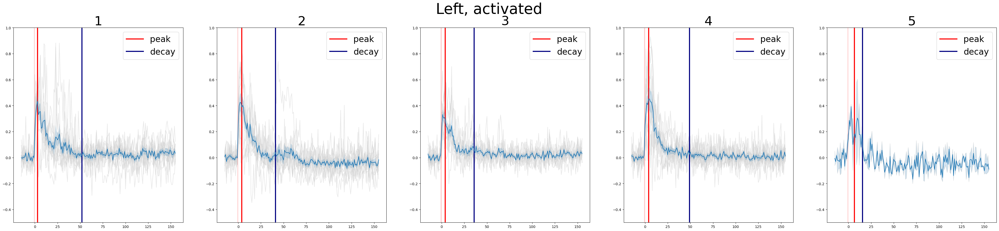

In [261]:
# Left - Plot with peak and decay time points

fps = 1.3039181000348583

normalize = True

# t_peaks = np.array(left_latency_per_pulse)
# t_decays = np.array(decays['left'])

fig, axs = plt.subplots(1, 5, figsize=(50, 10))

x = np.arange(0-pre_frame_num, 0+post_frame_num+1)

for pulse in L_traces:
	for trace in L_traces[pulse]:
		axs[pulse-1].plot(x, trace, 'lightgray', alpha=0.5)
	avg_trace = np.array(L_traces[pulse]).mean(axis=0)
	sems = sem(np.array(L_traces[pulse]), axis=0)

	axs[pulse-1].plot (x, avg_trace, zorder=102)
	axs[pulse-1].fill_between(x, avg_trace-sems, avg_trace+sems, alpha=0.2, zorder=101)
	axs[pulse-1].axvspan(-1, 0, color='red', lw=2, alpha=0.2, ec=None, zorder=100)

	# Peak
	# peak_frame = t_peaks[pulse-1] * fps
	peak_frame = np.median(left_latency_per_pulse[f'pulse {pulse}']) * fps
	axs[pulse-1].axvline(peak_frame, color='red', lw=3, label='peak')

	# Decay
	# decay_frame = t_decays[pulse-1] * fps
	decay_frame = np.median(left_decays_per_pulse[f'pulse {pulse}']) * fps
	axs[pulse-1].axvline(decay_frame, color='navy', lw=3, label='decay')

	if normalize:
		axs[pulse-1].set_ylim(top=1, bottom=-0.5)
	else:
		axs[pulse-1].set_ylim(top=1, bottom=0)
		
	axs[pulse-1].set_title(pulse, fontsize=36)
	axs[pulse-1].legend(prop={'size': 24}, loc='upper right')


plt.suptitle('Left, activated', fontsize=42)
plt.savefig(os.path.join(data_folder, 'figures', f"left_{stimulus}_vagal_summary_peak_decay.pdf"), transparent=True, bbox_inches="tight")
plt.show()

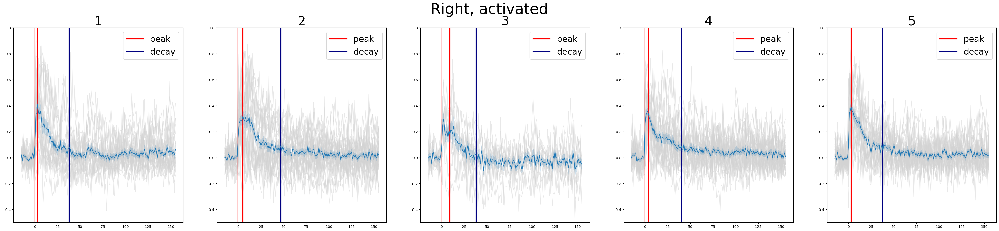

In [262]:
# Right - Plot with peak and decay time points

normalize = True

# t_peaks = np.array(latency_to_peak['right'])
# t_decays = np.array(decays['right'])

fig, axs = plt.subplots(1, 5, figsize=(50, 10))

x = np.arange(0-pre_frame_num, 0+post_frame_num+1)

for pulse in R_traces:
	if len(R_traces[pulse]) != 0:
		for trace in R_traces[pulse]:
			axs[pulse-1].plot(x, trace, 'lightgray', alpha=0.5)
		avg_trace = np.array(R_traces[pulse]).mean(axis=0)
		sems = sem(np.array(R_traces[pulse]), axis=0)

		axs[pulse-1].plot (x, avg_trace, zorder=102)
		axs[pulse-1].fill_between(x, avg_trace-sems, avg_trace+sems, alpha=0.2, zorder=101)
		axs[pulse-1].axvspan(-1, 0, color='red', lw=2, alpha=0.2, ec=None, zorder=100)

		# Peak
		# peak_frame = t_peaks[pulse-1] * fps
		peak_frame = np.median(right_latency_per_pulse[f'pulse {pulse}']) * fps
		axs[pulse-1].axvline(peak_frame, color='red', lw=3, label='peak')

		# Decay
		# decay_frame = t_decays[pulse-1] * fps
		decay_frame = np.median(right_decays_per_pulse[f'pulse {pulse}']) * fps
		axs[pulse-1].axvline(decay_frame, color='navy', lw=3, label='decay')

		if normalize:
			axs[pulse-1].set_ylim(top=1, bottom=-0.5)
		else:
			axs[pulse-1].set_ylim(top=1, bottom=0)
			
		axs[pulse-1].set_title(pulse, fontsize=36)
		axs[pulse-1].legend(prop={'size': 24}, loc='upper right')
	else:
		pass


plt.suptitle('Right, activated', fontsize=42)
plt.savefig(os.path.join(data_folder, 'figures', f"right_{stimulus}_vagal_summary_peak_decay.pdf"), transparent=True, bbox_inches="tight")
plt.show()

In [271]:
# Descriptives for Prism - %responsive neurons

perc_resp_neurons = {
    'left': list(),
    'right': list()
}

for fish in left_df.fish_id.unique():
	fish_df = left_df[left_df.fish_id == fish]

	perc_resp_neurons['left'].append(len(fish_df[fish_df.responsive == True]) / len(fish_df) * 100)

for fish in right_df.fish_id.unique():
	fish_df = right_df[right_df.fish_id == fish]

	perc_resp_neurons['right'].append(len(fish_df[fish_df.responsive == True]) / len(fish_df) * 100)

perc_resp_neurons = dict([(k,pd.Series(v)) for k,v in perc_resp_neurons.items()])
print(pd.DataFrame(perc_resp_neurons))
pd.DataFrame(perc_resp_neurons).to_clipboard()

        left      right
0  15.151515  78.260870
1  66.666667  37.037037
2        NaN  11.428571


In [272]:
# Descriptives for Prism - total number of neurons

n_neurons = {
    'left': list(),
    'right': list()
}

for fish in left_df.fish_id.unique():
    fish_df = left_df[left_df.fish_id == fish]
    n_neurons['left'].append(len(fish_df))

for fish in right_df.fish_id.unique():
    fish_df = right_df[right_df.fish_id == fish]
    n_neurons['right'].append(len(fish_df))
    
n_neurons = dict([(k,pd.Series(v)) for k,v in n_neurons.items()])
print(pd.DataFrame(n_neurons))
pd.DataFrame(n_neurons).to_clipboard()

   left  right
0  33.0     23
1  12.0     27
2   NaN     35


In [273]:
# Descriptives for Prism - number of responsive neurons

n_resp_neurons = {
    'left': list(),
    'right': list()
}

for fish in left_df.fish_id.unique():
    fish_df = left_df[left_df.fish_id == fish]
    n_resp_neurons['left'].append(len(fish_df[fish_df.responsive == True]))

for fish in right_df.fish_id.unique():
    fish_df = right_df[right_df.fish_id == fish]
    n_resp_neurons['right'].append(len(fish_df[fish_df.responsive == True]))
    
n_resp_neurons = dict([(k,pd.Series(v)) for k,v in n_resp_neurons.items()])
print(pd.DataFrame(n_resp_neurons))
pd.DataFrame(n_resp_neurons).to_clipboard()

   left  right
0   5.0     18
1   8.0     10
2   NaN      4


In [274]:
# Descriptives for Prism - %inhibited neurons

perc_inh_neurons = {
    'left': list(),
    'right': list()
}

for fish in left_df.fish_id.unique():
	fish_df = left_df[left_df.fish_id == fish]

	if len(fish_df[(fish_df.responsive == True)]) != 0:
		perc_inh_neurons['left'].append(len(fish_df[(fish_df.responsive == True) & (fish_df.inhibited == True)]) / len(fish_df[(fish_df.responsive == True)]) * 100)
	else:
		perc_inh_neurons['left'].append(0)

print('\nRight')
for fish in right_df.fish_id.unique():
	fish_df = right_df[right_df.fish_id == fish]

	if len(fish_df[(fish_df.responsive == True)]) != 0:
		perc_inh_neurons['right'].append(len(fish_df[(fish_df.responsive == True) & (fish_df.inhibited == True)]) / len(fish_df[(fish_df.responsive == True)]) * 100)
	else:
		perc_inh_neurons['right'].append(0)

perc_inh_neurons = dict([(k,pd.Series(v)) for k,v in perc_inh_neurons.items()])
print(pd.DataFrame(perc_inh_neurons))
pd.DataFrame(perc_inh_neurons).to_clipboard()


Right
   left  right
0   0.0    0.0
1   0.0    0.0
2   NaN   50.0


In [275]:
# Descriptives for Prism - number of inhibited neurons

n_inh_neurons = {
    'left': list(),
    'right': list()
}

for fish in left_df.fish_id.unique():
    fish_df = left_df[left_df.fish_id == fish]
    n_inh_neurons['left'].append(len(fish_df[(fish_df.responsive == True) & (fish_df.inhibited == True)]))

for fish in right_df.fish_id.unique():
    fish_df = right_df[right_df.fish_id == fish]
    n_inh_neurons['right'].append(len(fish_df[(fish_df.responsive == True) & (fish_df.inhibited == True)]))
    
n_inh_neurons = dict([(k,pd.Series(v)) for k,v in n_inh_neurons.items()])
print(pd.DataFrame(n_inh_neurons))
pd.DataFrame(n_inh_neurons).to_clipboard()

   left  right
0   0.0      0
1   0.0      0
2   NaN      2


In [276]:
# Descriptives for Prism - %activated neurons

perc_act_neurons = {
    'left': list(),
    'right': list()
}

for fish in left_df.fish_id.unique():
	fish_df = left_df[left_df.fish_id == fish]
	if len(fish_df[(fish_df.responsive == True)]) != 0:
		perc_act_neurons['left'].append(len(fish_df[(fish_df.responsive == True) & (fish_df.activated == True)]) / len(fish_df[(fish_df.responsive == True)]) * 100)
	else:
		perc_act_neurons['left'].append(0)

print('\nRight')
for fish in right_df.fish_id.unique():
	fish_df = right_df[right_df.fish_id == fish]
	if len(fish_df[(fish_df.responsive == True)]) != 0:
		perc_act_neurons['right'].append(len(fish_df[(fish_df.responsive == True) & (fish_df.activated == True)]) / len(fish_df[(fish_df.responsive == True)]) * 100)
	else:
		perc_act_neurons['right'].append(0)

perc_act_neurons = dict([(k,pd.Series(v)) for k,v in perc_act_neurons.items()])
print(pd.DataFrame(perc_act_neurons))
pd.DataFrame(perc_act_neurons).to_clipboard()


Right
    left  right
0  100.0  100.0
1  100.0  100.0
2    NaN   50.0


In [277]:
# Descriptives for Prism - number of activated neurons

n_act_neurons = {
    'left': list(),
    'right': list()
}

for fish in left_df.fish_id.unique():
    fish_df = left_df[left_df.fish_id == fish]
    n_act_neurons['left'].append(len(fish_df[(fish_df.responsive == True) & (fish_df.activated == True)]))

for fish in right_df.fish_id.unique():
    fish_df = right_df[right_df.fish_id == fish]
    n_act_neurons['right'].append(len(fish_df[(fish_df.responsive == True) & (fish_df.activated == True)]))
    
n_act_neurons = dict([(k,pd.Series(v)) for k,v in n_act_neurons.items()])
print(pd.DataFrame(n_act_neurons))
pd.DataFrame(n_act_neurons).to_clipboard()

   left  right
0   5.0     18
1   8.0     10
2   NaN      2


# SINGLE BASELINE

In [45]:
# Create unrolled temporal dfs
left_dfs = list()
for exp_folder in vagalL_paths:
    fish = BrukerFish(exp_folder)
    df = unroll_temporal_df(fish, pre_frame_num=15, post_frame_num=5, peak_threshold=None, min_threshold=None, key='raw_norm_temporal', normalize_by_first=True)
    left_dfs.append(df)

right_dfs = list()
for exp_folder in vagalR_paths:
    fish = BrukerFish(exp_folder)
    df = unroll_temporal_df(fish, pre_frame_num=15, post_frame_num=5, peak_threshold=None, min_threshold=None, key='raw_norm_temporal', normalize_by_first=True)
    right_dfs.append(df)

left_df = pd.concat(left_dfs, ignore_index=True)
right_df = pd.concat(right_dfs, ignore_index=True)

/Users/minelarinel/caImageAnalysis/caImageAnalysis/bruker_2P/voltage_output.py:22: GuessedAtParserWarning: No parser was explicitly specified, so I'm using the best available HTML parser for this system ("html.parser"). This usually isn't a problem, but if you run this code on another system, or in a different virtual environment, it may use a different parser and behave differently.

The code that caused this warning is on line 22 of the file /Users/minelarinel/caImageAnalysis/caImageAnalysis/bruker_2P/voltage_output.py. To get rid of this warning, pass the additional argument 'features="html.parser"' to the BeautifulSoup constructor.

  Bs_data = BeautifulSoup(xml)
/Users/minelarinel/mambaforge/envs/mescore/lib/python3.10/site-packages/bs4/builder/__init__.py:545: XMLParsedAsHTMLWarning: It looks like you're parsing an XML document using an HTML parser. If this really is an HTML document (maybe it's XHTML?), you can ignore or filter this warning. If it's XML, you should know that usi

Batch exists. Loading batch.pickle


/Users/minelarinel/caImageAnalysis/caImageAnalysis/bruker_2P/bruker.py:166: GuessedAtParserWarning: No parser was explicitly specified, so I'm using the best available HTML parser for this system ("html.parser"). This usually isn't a problem, but if you run this code on another system, or in a different virtual environment, it may use a different parser and behave differently.

The code that caused this warning is on line 166 of the file /Users/minelarinel/caImageAnalysis/caImageAnalysis/bruker_2P/bruker.py. To get rid of this warning, pass the additional argument 'features="html.parser"' to the BeautifulSoup constructor.

  Bs_data = BeautifulSoup(log)
/Users/minelarinel/mambaforge/envs/mescore/lib/python3.10/site-packages/bs4/builder/__init__.py:545: XMLParsedAsHTMLWarning: It looks like you're parsing an XML document using an HTML parser. If this really is an HTML document (maybe it's XHTML?), you can ignore or filter this warning. If it's XML, you should know that using an XML pars

neuron 0 is activated
neuron 0 responds to stimulus 1 (activated)
neuron 0 responds to stimulus 4 (activated)
neuron 0 responds to 40.0% of injections

neuron 2 is activated
neuron 2 responds to stimulus 1 (activated)
neuron 2 responds to stimulus 2 (activated)
neuron 2 responds to 40.0% of injections

neuron 3 is activated
neuron 3 responds to stimulus 1 (activated)
neuron 3 responds to stimulus 2 (activated)
neuron 3 responds to stimulus 3 (activated)
neuron 3 responds to stimulus 4 (activated)
neuron 3 responds to stimulus 5 (activated)
neuron 3 responds to 100.0% of injections

neuron 4 is activated
neuron 4 responds to stimulus 1 (activated)
neuron 4 responds to 20.0% of injections

neuron 5 is activated
neuron 5 responds to stimulus 3 (activated)
neuron 5 responds to stimulus 4 (activated)
neuron 5 responds to stimulus 5 (activated)
neuron 5 responds to 60.0% of injections

neuron 7 is inhibited
neuron 7 responds to stimulus 1 (inhibited)
neuron 7 responds to stimulus 3 (inhibite

/Users/minelarinel/caImageAnalysis/caImageAnalysis/temporal.py:1037: PerformanceWarning: 
your performance may suffer as PyTables will pickle object types that it cannot
map directly to c-types [inferred_type->mixed-integer,key->block1_values] [items->Index(['fish_id', 'plane', 'neuron', 'raw_temporal', 'temporal',
       'raw_norm_temporal', 'norm_temporal', 'raw_dff', 'dff', 'raw_norm_dff',
       'norm_dff', 'raw_zscore', 'zscore', 'raw_percentile', 'percentile',
       'roi_index', 'pulse_frames', 'activated', 'inhibited',
       'pulse_response'],
      dtype='object')]

/Users/minelarinel/caImageAnalysis/caImageAnalysis/bruker_2P/voltage_output.py:22: GuessedAtParserWarning: No parser was explicitly specified, so I'm using the best available HTML parser for this system ("html.parser"). This usually isn't a problem, but if you run this code on another system, or in a different virtual environment, it may use a different parser and behave differently.

The code that caused this war

Batch exists. Loading batch.pickle


/Users/minelarinel/caImageAnalysis/caImageAnalysis/bruker_2P/voltage_output.py:22: GuessedAtParserWarning: No parser was explicitly specified, so I'm using the best available HTML parser for this system ("html.parser"). This usually isn't a problem, but if you run this code on another system, or in a different virtual environment, it may use a different parser and behave differently.

The code that caused this warning is on line 22 of the file /Users/minelarinel/caImageAnalysis/caImageAnalysis/bruker_2P/voltage_output.py. To get rid of this warning, pass the additional argument 'features="html.parser"' to the BeautifulSoup constructor.

  Bs_data = BeautifulSoup(xml)
/Users/minelarinel/mambaforge/envs/mescore/lib/python3.10/site-packages/bs4/builder/__init__.py:545: XMLParsedAsHTMLWarning: It looks like you're parsing an XML document using an HTML parser. If this really is an HTML document (maybe it's XHTML?), you can ignore or filter this warning. If it's XML, you should know that usi

Batch exists. Loading batch.pickle


/Users/minelarinel/caImageAnalysis/caImageAnalysis/bruker_2P/bruker.py:166: GuessedAtParserWarning: No parser was explicitly specified, so I'm using the best available HTML parser for this system ("html.parser"). This usually isn't a problem, but if you run this code on another system, or in a different virtual environment, it may use a different parser and behave differently.

The code that caused this warning is on line 166 of the file /Users/minelarinel/caImageAnalysis/caImageAnalysis/bruker_2P/bruker.py. To get rid of this warning, pass the additional argument 'features="html.parser"' to the BeautifulSoup constructor.

  Bs_data = BeautifulSoup(log)
/Users/minelarinel/mambaforge/envs/mescore/lib/python3.10/site-packages/bs4/builder/__init__.py:545: XMLParsedAsHTMLWarning: It looks like you're parsing an XML document using an HTML parser. If this really is an HTML document (maybe it's XHTML?), you can ignore or filter this warning. If it's XML, you should know that using an XML pars

neuron 0 is activated
neuron 0 responds to stimulus 1 (activated)
neuron 0 responds to stimulus 2 (activated)
neuron 0 responds to stimulus 3 (activated)
neuron 0 responds to stimulus 4 (activated)
neuron 0 responds to stimulus 5 (activated)
neuron 0 responds to 100.0% of injections

neuron 1 is activated
neuron 1 responds to stimulus 1 (activated)
neuron 1 responds to stimulus 2 (activated)
neuron 1 responds to stimulus 3 (activated)
neuron 1 responds to stimulus 4 (activated)
neuron 1 responds to stimulus 5 (activated)
neuron 1 responds to 100.0% of injections

neuron 2 is activated
neuron 2 responds to stimulus 1 (activated)
neuron 2 responds to stimulus 2 (activated)
neuron 2 responds to stimulus 3 (activated)
neuron 2 responds to stimulus 4 (activated)
neuron 2 responds to stimulus 5 (activated)
neuron 2 responds to 100.0% of injections

neuron 3 is activated
neuron 3 responds to stimulus 2 (activated)
neuron 3 responds to stimulus 4 (activated)
neuron 3 responds to stimulus 5 (ac

/Users/minelarinel/caImageAnalysis/caImageAnalysis/temporal.py:1037: PerformanceWarning: 
your performance may suffer as PyTables will pickle object types that it cannot
map directly to c-types [inferred_type->mixed-integer,key->block1_values] [items->Index(['fish_id', 'plane', 'neuron', 'raw_temporal', 'temporal',
       'raw_norm_temporal', 'norm_temporal', 'raw_dff', 'dff', 'raw_norm_dff',
       'norm_dff', 'raw_zscore', 'zscore', 'raw_percentile', 'percentile',
       'roi_index', 'pulse_frames', 'activated', 'inhibited',
       'pulse_response'],
      dtype='object')]

/Users/minelarinel/caImageAnalysis/caImageAnalysis/bruker_2P/voltage_output.py:22: GuessedAtParserWarning: No parser was explicitly specified, so I'm using the best available HTML parser for this system ("html.parser"). This usually isn't a problem, but if you run this code on another system, or in a different virtual environment, it may use a different parser and behave differently.

The code that caused this war

Batch exists. Loading batch.pickle


/Users/minelarinel/caImageAnalysis/caImageAnalysis/bruker_2P/voltage_output.py:22: GuessedAtParserWarning: No parser was explicitly specified, so I'm using the best available HTML parser for this system ("html.parser"). This usually isn't a problem, but if you run this code on another system, or in a different virtual environment, it may use a different parser and behave differently.

The code that caused this warning is on line 22 of the file /Users/minelarinel/caImageAnalysis/caImageAnalysis/bruker_2P/voltage_output.py. To get rid of this warning, pass the additional argument 'features="html.parser"' to the BeautifulSoup constructor.

  Bs_data = BeautifulSoup(xml)
/Users/minelarinel/mambaforge/envs/mescore/lib/python3.10/site-packages/bs4/builder/__init__.py:545: XMLParsedAsHTMLWarning: It looks like you're parsing an XML document using an HTML parser. If this really is an HTML document (maybe it's XHTML?), you can ignore or filter this warning. If it's XML, you should know that usi

Batch exists. Loading batch.pickle


/Users/minelarinel/caImageAnalysis/caImageAnalysis/bruker_2P/bruker.py:166: GuessedAtParserWarning: No parser was explicitly specified, so I'm using the best available HTML parser for this system ("html.parser"). This usually isn't a problem, but if you run this code on another system, or in a different virtual environment, it may use a different parser and behave differently.

The code that caused this warning is on line 166 of the file /Users/minelarinel/caImageAnalysis/caImageAnalysis/bruker_2P/bruker.py. To get rid of this warning, pass the additional argument 'features="html.parser"' to the BeautifulSoup constructor.

  Bs_data = BeautifulSoup(log)
/Users/minelarinel/mambaforge/envs/mescore/lib/python3.10/site-packages/bs4/builder/__init__.py:545: XMLParsedAsHTMLWarning: It looks like you're parsing an XML document using an HTML parser. If this really is an HTML document (maybe it's XHTML?), you can ignore or filter this warning. If it's XML, you should know that using an XML pars

neuron 0 is activated
neuron 0 responds to stimulus 1 (activated)
neuron 0 responds to stimulus 4 (activated)
neuron 0 responds to 40.0% of injections

neuron 1 is activated
neuron 1 responds to stimulus 1 (activated)
neuron 1 responds to stimulus 2 (activated)
neuron 1 responds to stimulus 4 (activated)
neuron 1 responds to stimulus 5 (activated)
neuron 1 responds to 80.0% of injections

neuron 2 is activated
neuron 2 responds to stimulus 1 (activated)
neuron 2 responds to stimulus 2 (activated)
neuron 2 responds to stimulus 4 (activated)
neuron 2 responds to stimulus 5 (activated)
neuron 2 responds to 80.0% of injections

neuron 3 is activated
neuron 3 responds to stimulus 1 (activated)
neuron 3 responds to stimulus 4 (activated)
neuron 3 responds to stimulus 5 (activated)
neuron 3 responds to 60.0% of injections

neuron 5 is activated
neuron 5 responds to stimulus 1 (activated)
neuron 5 responds to stimulus 2 (activated)
neuron 5 responds to stimulus 4 (activated)
neuron 5 responds 

/Users/minelarinel/caImageAnalysis/caImageAnalysis/temporal.py:1037: PerformanceWarning: 
your performance may suffer as PyTables will pickle object types that it cannot
map directly to c-types [inferred_type->mixed-integer,key->block1_values] [items->Index(['fish_id', 'plane', 'neuron', 'raw_temporal', 'temporal',
       'raw_norm_temporal', 'norm_temporal', 'raw_dff', 'dff', 'raw_norm_dff',
       'norm_dff', 'raw_zscore', 'zscore', 'raw_percentile', 'percentile',
       'roi_index', 'pulse_frames', 'activated', 'inhibited',
       'pulse_response'],
      dtype='object')]

/Users/minelarinel/caImageAnalysis/caImageAnalysis/bruker_2P/voltage_output.py:22: GuessedAtParserWarning: No parser was explicitly specified, so I'm using the best available HTML parser for this system ("html.parser"). This usually isn't a problem, but if you run this code on another system, or in a different virtual environment, it may use a different parser and behave differently.

The code that caused this war

Batch exists. Loading batch.pickle


/Users/minelarinel/caImageAnalysis/caImageAnalysis/bruker_2P/voltage_output.py:22: GuessedAtParserWarning: No parser was explicitly specified, so I'm using the best available HTML parser for this system ("html.parser"). This usually isn't a problem, but if you run this code on another system, or in a different virtual environment, it may use a different parser and behave differently.

The code that caused this warning is on line 22 of the file /Users/minelarinel/caImageAnalysis/caImageAnalysis/bruker_2P/voltage_output.py. To get rid of this warning, pass the additional argument 'features="html.parser"' to the BeautifulSoup constructor.

  Bs_data = BeautifulSoup(xml)
/Users/minelarinel/mambaforge/envs/mescore/lib/python3.10/site-packages/bs4/builder/__init__.py:545: XMLParsedAsHTMLWarning: It looks like you're parsing an XML document using an HTML parser. If this really is an HTML document (maybe it's XHTML?), you can ignore or filter this warning. If it's XML, you should know that usi

Batch exists. Loading batch.pickle


/Users/minelarinel/caImageAnalysis/caImageAnalysis/bruker_2P/bruker.py:166: GuessedAtParserWarning: No parser was explicitly specified, so I'm using the best available HTML parser for this system ("html.parser"). This usually isn't a problem, but if you run this code on another system, or in a different virtual environment, it may use a different parser and behave differently.

The code that caused this warning is on line 166 of the file /Users/minelarinel/caImageAnalysis/caImageAnalysis/bruker_2P/bruker.py. To get rid of this warning, pass the additional argument 'features="html.parser"' to the BeautifulSoup constructor.

  Bs_data = BeautifulSoup(log)
/Users/minelarinel/mambaforge/envs/mescore/lib/python3.10/site-packages/bs4/builder/__init__.py:545: XMLParsedAsHTMLWarning: It looks like you're parsing an XML document using an HTML parser. If this really is an HTML document (maybe it's XHTML?), you can ignore or filter this warning. If it's XML, you should know that using an XML pars

neuron 0 is activated
neuron 0 responds to stimulus 1 (activated)
neuron 0 responds to stimulus 2 (activated)
neuron 0 responds to stimulus 3 (activated)
neuron 0 responds to stimulus 4 (activated)
neuron 0 responds to stimulus 5 (activated)
neuron 0 responds to 100.0% of injections

neuron 1 is activated
neuron 1 responds to stimulus 1 (activated)
neuron 1 responds to stimulus 3 (activated)
neuron 1 responds to stimulus 4 (activated)
neuron 1 responds to stimulus 5 (activated)
neuron 1 responds to 80.0% of injections

neuron 2 is activated
neuron 2 responds to stimulus 2 (activated)
neuron 2 responds to stimulus 3 (activated)
neuron 2 responds to stimulus 4 (activated)
neuron 2 responds to stimulus 5 (activated)
neuron 2 responds to 80.0% of injections

neuron 3 is activated
neuron 3 responds to stimulus 1 (activated)
neuron 3 responds to stimulus 2 (activated)
neuron 3 responds to stimulus 3 (activated)
neuron 3 responds to stimulus 4 (activated)
neuron 3 responds to 80.0% of injecti

/Users/minelarinel/caImageAnalysis/caImageAnalysis/temporal.py:1037: PerformanceWarning: 
your performance may suffer as PyTables will pickle object types that it cannot
map directly to c-types [inferred_type->mixed-integer,key->block1_values] [items->Index(['fish_id', 'plane', 'neuron', 'raw_temporal', 'temporal',
       'raw_norm_temporal', 'norm_temporal', 'raw_dff', 'dff', 'raw_norm_dff',
       'norm_dff', 'raw_zscore', 'zscore', 'raw_percentile', 'percentile',
       'roi_index', 'pulse_frames', 'activated', 'inhibited',
       'pulse_response'],
      dtype='object')]

/Users/minelarinel/caImageAnalysis/caImageAnalysis/bruker_2P/voltage_output.py:22: GuessedAtParserWarning: No parser was explicitly specified, so I'm using the best available HTML parser for this system ("html.parser"). This usually isn't a problem, but if you run this code on another system, or in a different virtual environment, it may use a different parser and behave differently.

The code that caused this war

Batch exists. Loading batch.pickle


/Users/minelarinel/caImageAnalysis/caImageAnalysis/bruker_2P/voltage_output.py:22: GuessedAtParserWarning: No parser was explicitly specified, so I'm using the best available HTML parser for this system ("html.parser"). This usually isn't a problem, but if you run this code on another system, or in a different virtual environment, it may use a different parser and behave differently.

The code that caused this warning is on line 22 of the file /Users/minelarinel/caImageAnalysis/caImageAnalysis/bruker_2P/voltage_output.py. To get rid of this warning, pass the additional argument 'features="html.parser"' to the BeautifulSoup constructor.

  Bs_data = BeautifulSoup(xml)
/Users/minelarinel/mambaforge/envs/mescore/lib/python3.10/site-packages/bs4/builder/__init__.py:545: XMLParsedAsHTMLWarning: It looks like you're parsing an XML document using an HTML parser. If this really is an HTML document (maybe it's XHTML?), you can ignore or filter this warning. If it's XML, you should know that usi

Batch exists. Loading batch.pickle


/Users/minelarinel/caImageAnalysis/caImageAnalysis/bruker_2P/bruker.py:166: GuessedAtParserWarning: No parser was explicitly specified, so I'm using the best available HTML parser for this system ("html.parser"). This usually isn't a problem, but if you run this code on another system, or in a different virtual environment, it may use a different parser and behave differently.

The code that caused this warning is on line 166 of the file /Users/minelarinel/caImageAnalysis/caImageAnalysis/bruker_2P/bruker.py. To get rid of this warning, pass the additional argument 'features="html.parser"' to the BeautifulSoup constructor.

  Bs_data = BeautifulSoup(log)
/Users/minelarinel/mambaforge/envs/mescore/lib/python3.10/site-packages/bs4/builder/__init__.py:545: XMLParsedAsHTMLWarning: It looks like you're parsing an XML document using an HTML parser. If this really is an HTML document (maybe it's XHTML?), you can ignore or filter this warning. If it's XML, you should know that using an XML pars

neuron 0 is activated
neuron 0 responds to stimulus 1 (activated)
neuron 0 responds to stimulus 3 (activated)
neuron 0 responds to stimulus 4 (activated)
neuron 0 responds to stimulus 5 (activated)
neuron 0 responds to 80.0% of injections

neuron 1 is inhibited
neuron 1 responds to stimulus 2 (inhibited)
neuron 1 responds to stimulus 3 (inhibited)
neuron 1 responds to stimulus 4 (inhibited)
neuron 1 responds to stimulus 5 (inhibited)
neuron 1 responds to 80.0% of injections

neuron 2 is activated
neuron 2 responds to stimulus 1 (activated)
neuron 2 responds to stimulus 2 (activated)
neuron 2 responds to stimulus 3 (activated)
neuron 2 responds to stimulus 4 (activated)
neuron 2 responds to stimulus 5 (activated)
neuron 2 responds to 100.0% of injections

neuron 3 is activated
neuron 3 responds to stimulus 3 (activated)
neuron 3 responds to stimulus 4 (activated)
neuron 3 responds to stimulus 5 (activated)
neuron 3 responds to 60.0% of injections

neuron 5 is activated
neuron 5 responds

/Users/minelarinel/caImageAnalysis/caImageAnalysis/temporal.py:1037: PerformanceWarning: 
your performance may suffer as PyTables will pickle object types that it cannot
map directly to c-types [inferred_type->mixed-integer,key->block1_values] [items->Index(['fish_id', 'plane', 'neuron', 'raw_temporal', 'temporal',
       'raw_norm_temporal', 'norm_temporal', 'raw_dff', 'dff', 'raw_norm_dff',
       'norm_dff', 'raw_zscore', 'zscore', 'raw_percentile', 'percentile',
       'roi_index', 'pulse_frames', 'activated', 'inhibited',
       'pulse_response'],
      dtype='object')]

/Users/minelarinel/caImageAnalysis/caImageAnalysis/bruker_2P/voltage_output.py:22: GuessedAtParserWarning: No parser was explicitly specified, so I'm using the best available HTML parser for this system ("html.parser"). This usually isn't a problem, but if you run this code on another system, or in a different virtual environment, it may use a different parser and behave differently.

The code that caused this war

Batch exists. Loading batch.pickle


In [48]:
x

array([-15, -14, -13, -12, -11, -10,  -9,  -8,  -7,  -6,  -5,  -4,  -3,
        -2,  -1,   0,   1,   2,   3,   4,   5,   6,   7,   8,   9,  10,
        11,  12,  13,  14,  15,  16,  17,  18,  19,  20,  21,  22,  23,
        24,  25,  26,  27,  28,  29,  30])

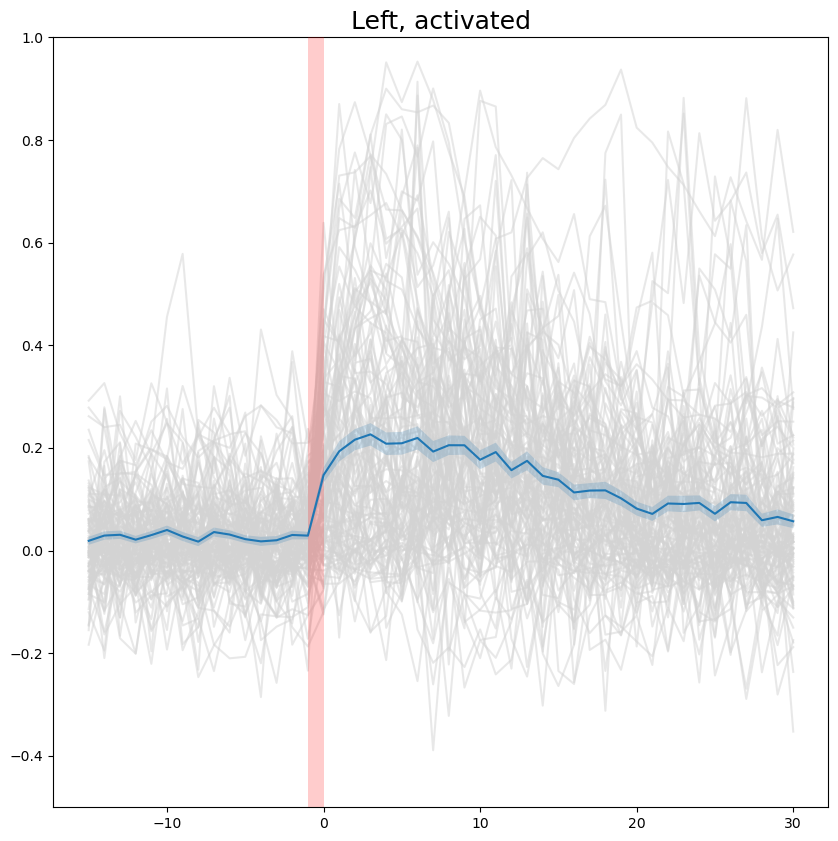

In [57]:
# Left activated

pre_frame_num = 15
post_frame_num = 30

normalize_by_first = True
key = 'raw_norm_temporal'

activated = left_df[left_df['activated'] == True]
traces = list()

plt.figure(figsize=(10, 10))

x = np.arange(0-pre_frame_num, 0+post_frame_num+1)

for i, neuron in activated.iterrows():
	pulses = neuron['pulse_frames']

	for p, pulse in enumerate(pulses):
		start_frame = pulse - pre_frame_num  # when the neuron traces will start
		stop_frame = pulse + post_frame_num  # when the neuron traces will end

		trace = neuron[key][start_frame:stop_frame+1]

		if normalize_by_first and p == 0:
			baseline = np.mean(neuron[key][start_frame:pulse])
			trace = trace - baseline
		elif normalize_by_first and p != 0:
			trace = trace - baseline

		traces.append(trace)

		plt.plot(x, trace, 'lightgray', alpha=0.5)

avg_trace = np.array(traces).mean(axis=0)
sems = sem(np.array(traces), axis=0)

plt.plot (x, avg_trace, zorder=102)
plt.fill_between(x, avg_trace-sems, avg_trace+sems, alpha=0.2, zorder=101)
plt.axvspan(-1, 0, color='red', lw=2, alpha=0.2, ec=None, zorder=100)

if normalize_by_first:
	plt.ylim(top=1, bottom=-0.50)
else:
	plt.ylim(top=1, bottom=0)
	
plt.title('Left, activated', fontsize=18)

plt.show()

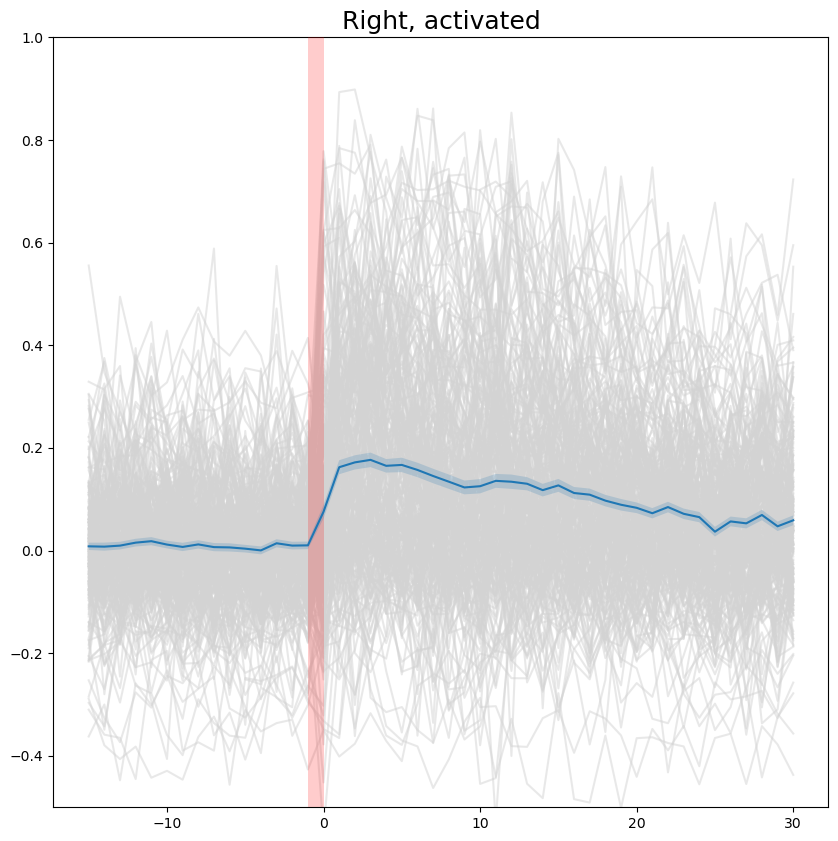

In [58]:
# Right activated

pre_frame_num = 15
post_frame_num = 30

normalize_by_first = True
key = 'raw_norm_temporal'

activated = right_df[right_df['activated'] == True]
traces = list()

plt.figure(figsize=(10, 10))

x = np.arange(0-pre_frame_num, 0+post_frame_num+1)

for i, neuron in activated.iterrows():
	pulses = neuron['pulse_frames']

	for p, pulse in enumerate(pulses):
		start_frame = pulse - pre_frame_num  # when the neuron traces will start
		stop_frame = pulse + post_frame_num  # when the neuron traces will end

		trace = neuron[key][start_frame:stop_frame+1]

		if normalize_by_first and p == 0:
			baseline = np.mean(neuron[key][start_frame:pulse])
			trace = trace - baseline
		elif normalize_by_first and p != 0:
			trace = trace - baseline

		traces.append(trace)

		plt.plot(x, trace, 'lightgray', alpha=0.5)

avg_trace = np.array(traces).mean(axis=0)
sems = sem(np.array(traces), axis=0)

plt.plot (x, avg_trace, zorder=102)
plt.fill_between(x, avg_trace-sems, avg_trace+sems, alpha=0.2, zorder=101)
plt.axvspan(-1, 0, color='red', lw=2, alpha=0.2, ec=None, zorder=100)

if normalize_by_first:
	plt.ylim(top=1, bottom=-0.50)
else:
	plt.ylim(top=1, bottom=0)
	
plt.title('Right, activated', fontsize=18)

plt.show()

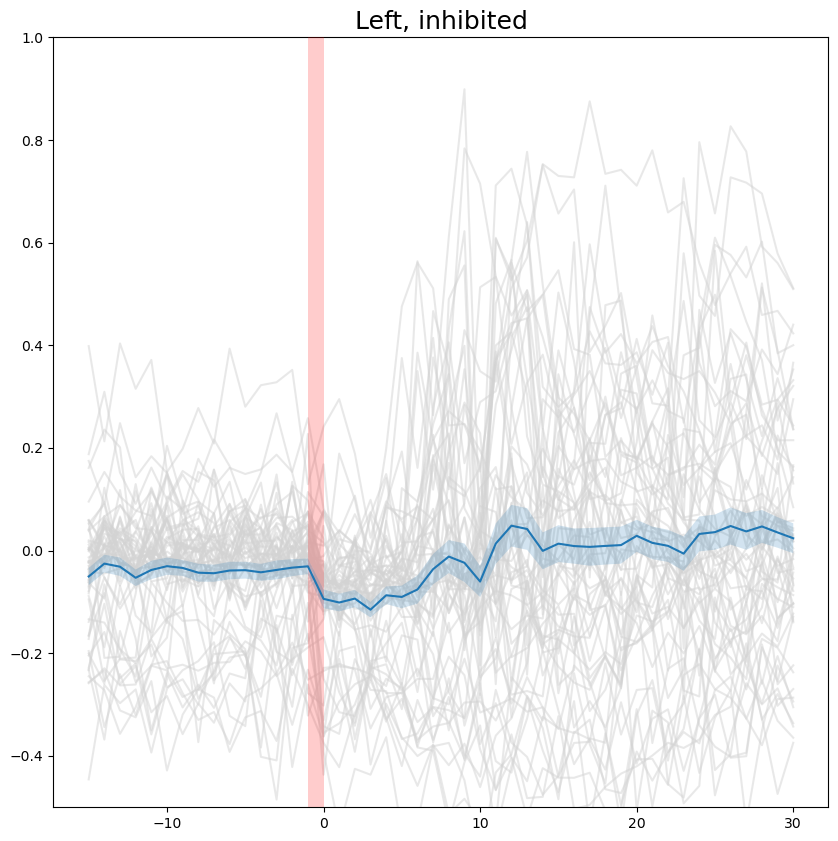

In [59]:
# Left inhibited

pre_frame_num = 15
post_frame_num = 30

normalize_by_first = True
key = 'raw_norm_temporal'

activated = left_df[left_df['inhibited'] == True]
traces = list()

plt.figure(figsize=(10, 10))

x = np.arange(0-pre_frame_num, 0+post_frame_num+1)

for i, neuron in activated.iterrows():
	pulses = neuron['pulse_frames']

	for p, pulse in enumerate(pulses):
		start_frame = pulse - pre_frame_num  # when the neuron traces will start
		stop_frame = pulse + post_frame_num  # when the neuron traces will end

		trace = neuron[key][start_frame:stop_frame+1]

		if normalize_by_first and p == 0:
			baseline = np.mean(neuron[key][start_frame:pulse])
			trace = trace - baseline
		elif normalize_by_first and p != 0:
			trace = trace - baseline

		traces.append(trace)

		plt.plot(x, trace, 'lightgray', alpha=0.5)

avg_trace = np.array(traces).mean(axis=0)
sems = sem(np.array(traces), axis=0)

plt.plot (x, avg_trace, zorder=102)
plt.fill_between(x, avg_trace-sems, avg_trace+sems, alpha=0.2, zorder=101)
plt.axvspan(-1, 0, color='red', lw=2, alpha=0.2, ec=None, zorder=100)

if normalize_by_first:
	plt.ylim(top=1, bottom=-0.50)
else:
	plt.ylim(top=1, bottom=0)
	
plt.title('Left, inhibited', fontsize=18)

plt.show()

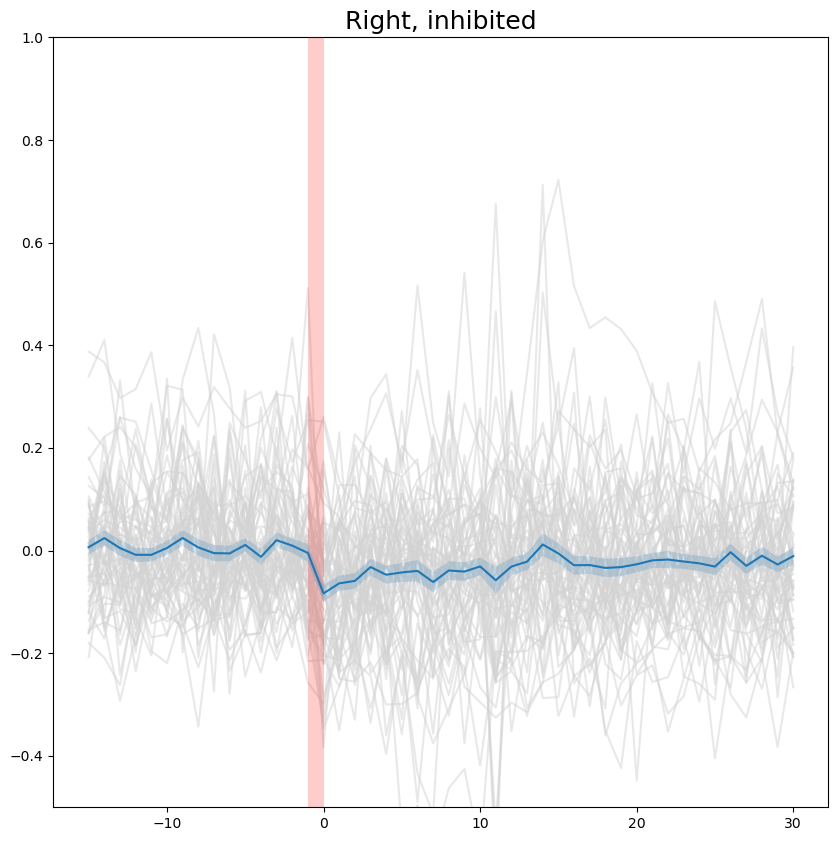

In [60]:
# Right inhibited

pre_frame_num = 15
post_frame_num = 30

normalize_by_first = True
key = 'raw_norm_temporal'

activated = right_df[right_df['inhibited'] == True]
traces = list()

plt.figure(figsize=(10, 10))

x = np.arange(0-pre_frame_num, 0+post_frame_num+1)

for i, neuron in activated.iterrows():
	pulses = neuron['pulse_frames']

	for p, pulse in enumerate(pulses):
		start_frame = pulse - pre_frame_num  # when the neuron traces will start
		stop_frame = pulse + post_frame_num  # when the neuron traces will end

		trace = neuron[key][start_frame:stop_frame+1]

		if normalize_by_first and p == 0:
			baseline = np.mean(neuron[key][start_frame:pulse])
			trace = trace - baseline
		elif normalize_by_first and p != 0:
			trace = trace - baseline

		traces.append(trace)

		plt.plot(x, trace, 'lightgray', alpha=0.5)

avg_trace = np.array(traces).mean(axis=0)
sems = sem(np.array(traces), axis=0)

plt.plot (x, avg_trace, zorder=102)
plt.fill_between(x, avg_trace-sems, avg_trace+sems, alpha=0.2, zorder=101)
plt.axvspan(-1, 0, color='red', lw=2, alpha=0.2, ec=None, zorder=100)

if normalize_by_first:
	plt.ylim(top=1, bottom=-0.50)
else:
	plt.ylim(top=1, bottom=0)
	
plt.title('Right, inhibited', fontsize=18)

plt.show()

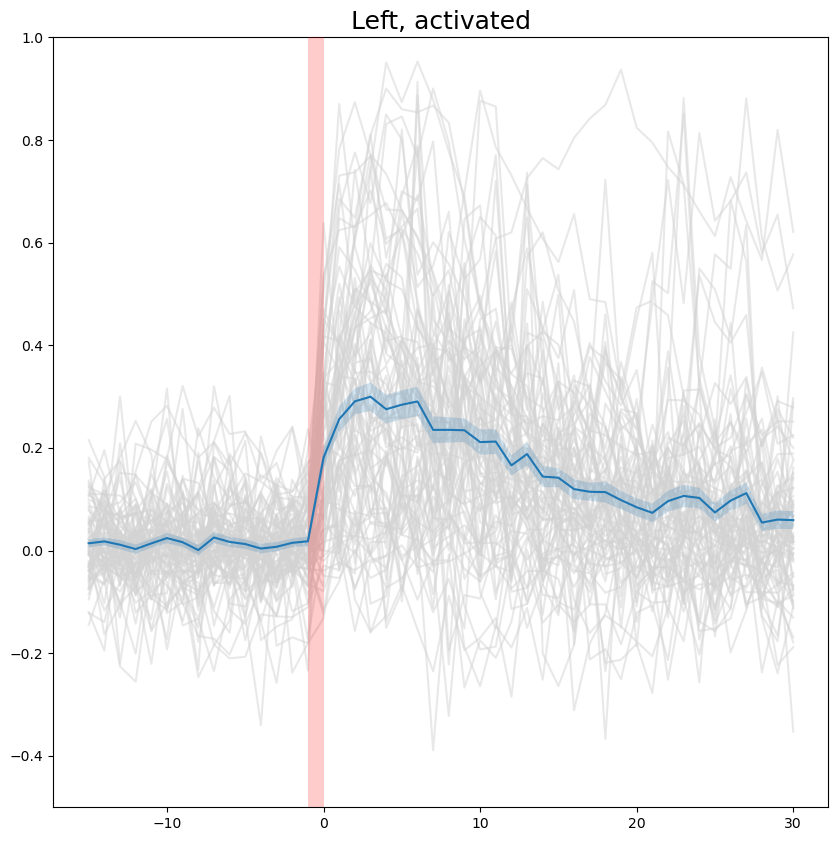

In [64]:
# Left activated - only the pulses that get activated

pre_frame_num = 15
post_frame_num = 30

normalize_by_first = True
key = 'raw_norm_temporal'

activated = left_df[left_df['activated'] == True]
traces = list()

plt.figure(figsize=(10, 10))

x = np.arange(0-pre_frame_num, 0+post_frame_num+1)

for i, neuron in activated.iterrows():
	responsive_pulses = [pr[0] for pr in neuron['pulse_response']]  # individual pulses that the neuron responded to
	pulse_activity = [pr[1] for pr in neuron['pulse_response']]  # if 1, activated, if 0, inhibited

	pulses = neuron['pulse_frames']

	for p, pulse in enumerate(responsive_pulses):
		if pulse_activity[p] == 1:
			start_frame = pulses[pulse-1] - pre_frame_num  # when the neuron traces will start
			stop_frame = pulses[pulse-1] + post_frame_num  # when the neuron traces will end

			trace = neuron[key][start_frame:stop_frame+1]

			if normalize_by_first and p == 0:
				baseline = np.mean(neuron[key][start_frame:pulses[pulse-1]])
				trace = trace - baseline
			elif normalize_by_first and p != 0:
				trace = trace - baseline

			traces.append(trace)

			plt.plot(x, trace, 'lightgray', alpha=0.5)

avg_trace = np.array(traces).mean(axis=0)
sems = sem(np.array(traces), axis=0)

plt.plot (x, avg_trace, zorder=102)
plt.fill_between(x, avg_trace-sems, avg_trace+sems, alpha=0.2, zorder=101)
plt.axvspan(-1, 0, color='red', lw=2, alpha=0.2, ec=None, zorder=100)

if normalize_by_first:
	plt.ylim(top=1, bottom=-0.50)
else:
	plt.ylim(top=1, bottom=0)
	
plt.title('Left, activated', fontsize=18)

plt.show()

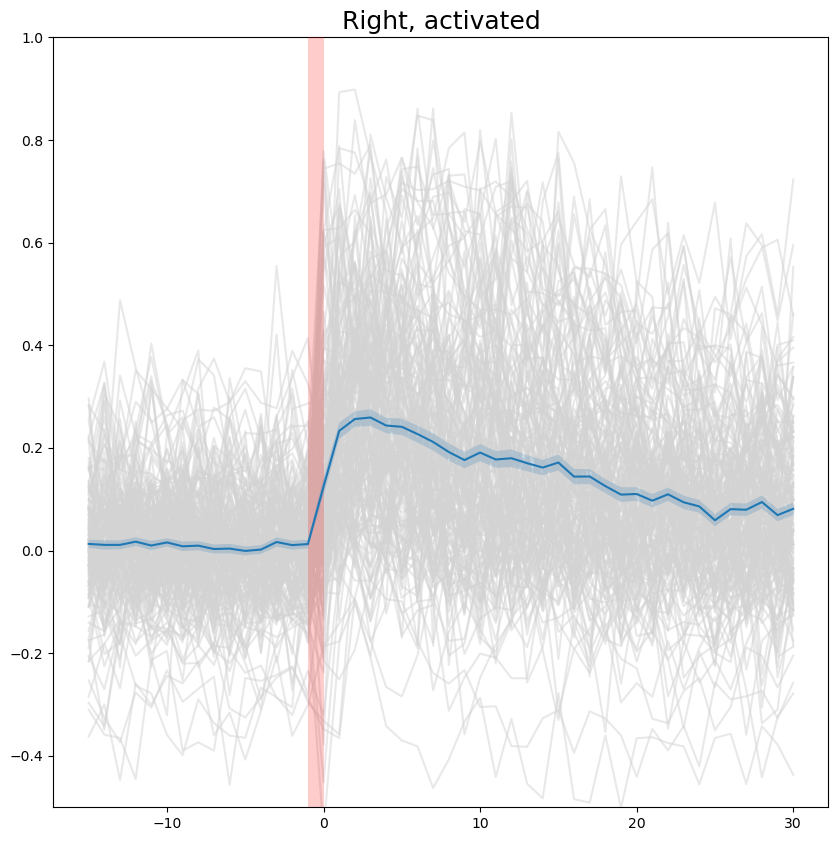

In [65]:
# Right activated - only the pulses that get activated

pre_frame_num = 15
post_frame_num = 30

normalize_by_first = True
key = 'raw_norm_temporal'

activated = right_df[right_df['activated'] == True]
traces = list()

plt.figure(figsize=(10, 10))

x = np.arange(0-pre_frame_num, 0+post_frame_num+1)

for i, neuron in activated.iterrows():
	responsive_pulses = [pr[0] for pr in neuron['pulse_response']]  # individual pulses that the neuron responded to
	pulse_activity = [pr[1] for pr in neuron['pulse_response']]  # if 1, activated, if 0, inhibited

	pulses = neuron['pulse_frames']

	for p, pulse in enumerate(responsive_pulses):
		if pulse_activity[p] == 1:
			start_frame = pulses[pulse-1] - pre_frame_num  # when the neuron traces will start
			stop_frame = pulses[pulse-1] + post_frame_num  # when the neuron traces will end

			trace = neuron[key][start_frame:stop_frame+1]

			if normalize_by_first and p == 0:
				baseline = np.mean(neuron[key][start_frame:pulses[pulse-1]])
				trace = trace - baseline
			elif normalize_by_first and p != 0:
				trace = trace - baseline

			traces.append(trace)

			plt.plot(x, trace, 'lightgray', alpha=0.5)

avg_trace = np.array(traces).mean(axis=0)
sems = sem(np.array(traces), axis=0)

plt.plot (x, avg_trace, zorder=102)
plt.fill_between(x, avg_trace-sems, avg_trace+sems, alpha=0.2, zorder=101)
plt.axvspan(-1, 0, color='red', lw=2, alpha=0.2, ec=None, zorder=100)

if normalize_by_first:
	plt.ylim(top=1, bottom=-0.50)
else:
	plt.ylim(top=1, bottom=0)
	
plt.title('Right, activated', fontsize=18)

plt.show()

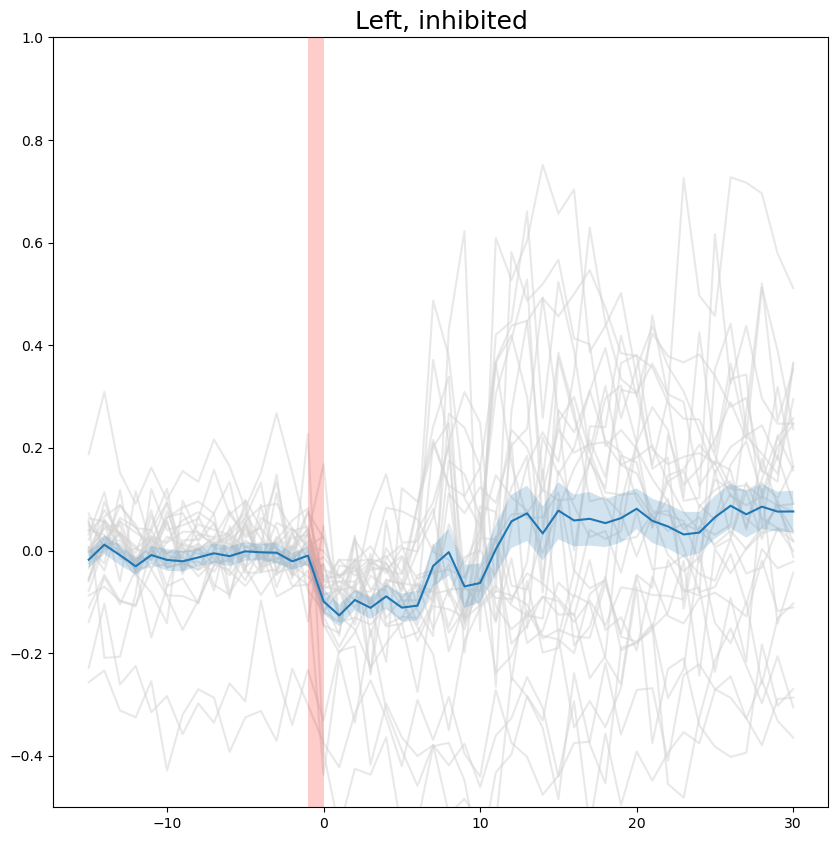

In [69]:
# Left inhibited - only the pulses that get activated

pre_frame_num = 15
post_frame_num = 30

normalize_by_first = True
key = 'raw_norm_temporal'

activated = left_df[left_df['inhibited'] == True]
traces = list()

plt.figure(figsize=(10, 10))

x = np.arange(0-pre_frame_num, 0+post_frame_num+1)

for i, neuron in activated.iterrows():
	responsive_pulses = [pr[0] for pr in neuron['pulse_response']]  # individual pulses that the neuron responded to
	pulse_activity = [pr[1] for pr in neuron['pulse_response']]  # if 1, activated, if 0, inhibited

	pulses = neuron['pulse_frames']

	for p, pulse in enumerate(responsive_pulses):
		if pulse_activity[p] == 0:
			start_frame = pulses[pulse-1] - pre_frame_num  # when the neuron traces will start
			stop_frame = pulses[pulse-1] + post_frame_num  # when the neuron traces will end

			trace = neuron[key][start_frame:stop_frame+1]

			if normalize_by_first and p == 0:
				baseline = np.mean(neuron[key][start_frame:pulses[pulse-1]])
				trace = trace - baseline
			elif normalize_by_first and p != 0:
				trace = trace - baseline

			traces.append(trace)

			plt.plot(x, trace, 'lightgray', alpha=0.5)

avg_trace = np.array(traces).mean(axis=0)
sems = sem(np.array(traces), axis=0)

plt.plot (x, avg_trace, zorder=102)
plt.fill_between(x, avg_trace-sems, avg_trace+sems, alpha=0.2, zorder=101)
plt.axvspan(-1, 0, color='red', lw=2, alpha=0.2, ec=None, zorder=100)

if normalize_by_first:
	plt.ylim(top=1, bottom=-0.50)
else:
	plt.ylim(top=1, bottom=0)
	
plt.title('Left, inhibited', fontsize=18)

plt.show()

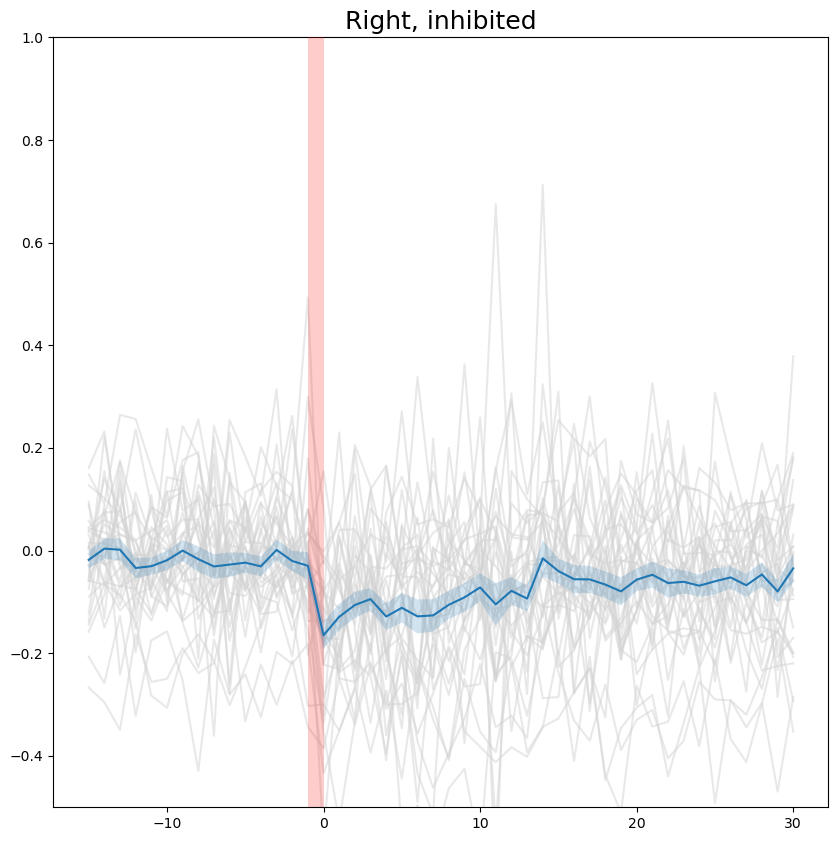

In [70]:
# Right inhibited - only the pulses that get activated

pre_frame_num = 15
post_frame_num = 30

normalize_by_first = True
key = 'raw_norm_temporal'

activated = right_df[right_df['inhibited'] == True]
traces = list()

plt.figure(figsize=(10, 10))

x = np.arange(0-pre_frame_num, 0+post_frame_num+1)

for i, neuron in activated.iterrows():
	responsive_pulses = [pr[0] for pr in neuron['pulse_response']]  # individual pulses that the neuron responded to
	pulse_activity = [pr[1] for pr in neuron['pulse_response']]  # if 1, activated, if 0, inhibited

	pulses = neuron['pulse_frames']

	for p, pulse in enumerate(responsive_pulses):
		if pulse_activity[p] == 0:
			start_frame = pulses[pulse-1] - pre_frame_num  # when the neuron traces will start
			stop_frame = pulses[pulse-1] + post_frame_num  # when the neuron traces will end

			trace = neuron[key][start_frame:stop_frame+1]

			if normalize_by_first and p == 0:
				baseline = np.mean(neuron[key][start_frame:pulses[pulse-1]])
				trace = trace - baseline
			elif normalize_by_first and p != 0:
				trace = trace - baseline

			traces.append(trace)

			plt.plot(x, trace, 'lightgray', alpha=0.5)

avg_trace = np.array(traces).mean(axis=0)
sems = sem(np.array(traces), axis=0)

plt.plot (x, avg_trace, zorder=102)
plt.fill_between(x, avg_trace-sems, avg_trace+sems, alpha=0.2, zorder=101)
plt.axvspan(-1, 0, color='red', lw=2, alpha=0.2, ec=None, zorder=100)

if normalize_by_first:
	plt.ylim(top=1, bottom=-0.50)
else:
	plt.ylim(top=1, bottom=0)
	
plt.title('Right, inhibited', fontsize=18)

plt.show()

In [71]:
# number of pulse responses (e.g., responds to 3 out of 5 injections)

n_of_pulse_responses_L_act = list()
n_of_pulse_responses_L_inh = list()
n_of_pulse_responses_R_act = list()
n_of_pulse_responses_R_inh = list()

print('Left, activated')
d = left_df[(left_df['activated'] == True)]['pulse_response']

lens = np.array([len(i) for i in d])
for pulse in range(1, 6):
    print(f'pulse {pulse}: {np.count_nonzero(lens == pulse)}')
    n_of_pulse_responses_L_act.append(np.count_nonzero(lens == pulse))

print('\nLeft, inhibited')
d = left_df[(left_df['inhibited'] == True)]['pulse_response']

lens = np.array([len(i) for i in d])
for pulse in range(1, 6):
    print(f'pulse {pulse}: {np.count_nonzero(lens == pulse)}')
    n_of_pulse_responses_L_inh.append(np.count_nonzero(lens == pulse))

print('\nRight, activated')
d = right_df[(right_df['activated'] == True)]['pulse_response']

lens = np.array([len(i) for i in d])
for pulse in range(1, 6):
    print(f'pulse {pulse}: {np.count_nonzero(lens == pulse)}')
    n_of_pulse_responses_R_act.append(np.count_nonzero(lens == pulse))

print('\nRight, inhibited')
d = right_df[(right_df['inhibited'] == True)]['pulse_response']

lens = np.array([len(i) for i in d])
for pulse in range(1, 6):
    print(f'pulse {pulse}: {np.count_nonzero(lens == pulse)}')
    n_of_pulse_responses_R_inh.append(np.count_nonzero(lens == pulse))

Left, activated
pulse 1: 2
pulse 2: 5
pulse 3: 4
pulse 4: 7
pulse 5: 6

Left, inhibited
pulse 1: 2
pulse 2: 3
pulse 3: 3
pulse 4: 3
pulse 5: 0

Right, activated
pulse 1: 2
pulse 2: 5
pulse 3: 15
pulse 4: 21
pulse 5: 8

Right, inhibited
pulse 1: 0
pulse 2: 6
pulse 3: 3
pulse 4: 3
pulse 5: 0


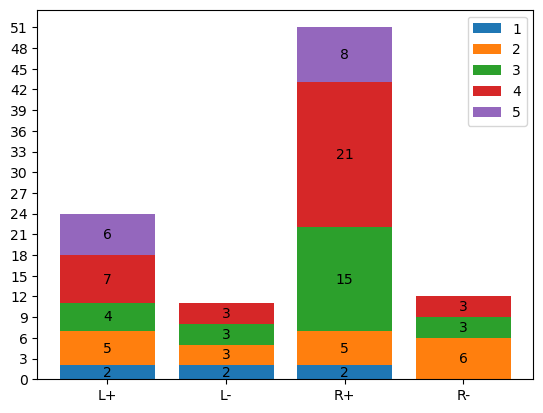

In [72]:
# number of pulse responses
x = ['L+', 'L-', 'R+', 'R-']

pulse_responses = [n_of_pulse_responses_L_act, n_of_pulse_responses_L_inh, n_of_pulse_responses_R_act, n_of_pulse_responses_R_inh]

for i, val in enumerate(n_of_pulse_responses_L_act):
	if i == 0:
		y1 = np.array([pr[i] for pr in pulse_responses])
	elif i == 1:
		y2 = np.array([pr[i] for pr in pulse_responses])
	elif i == 2:
		y3 = np.array([pr[i] for pr in pulse_responses])
	elif i == 3:
		y4 = np.array([pr[i] for pr in pulse_responses])
	elif i == 4:
		y5 = np.array([pr[i] for pr in pulse_responses])

p1 = plt.bar(x, y1, label='1')
p2 = plt.bar(x, y2, bottom=y1, label='2')
p3 = plt.bar(x, y3, bottom=y1+y2, label='3')
p4 = plt.bar(x, y4, bottom=y1+y2+y3, label='4')
p5 = plt.bar(x, y5, bottom=y1+y2+y3+y4, label='5')

plt.bar_label(p1, labels=[str(n) if n != 0 else '' for n in y1], label_type='center')
plt.bar_label(p2, labels=[str(n) if n != 0 else '' for n in y2], label_type='center')
plt.bar_label(p3, labels=[str(n) if n != 0 else '' for n in y3], label_type='center')
plt.bar_label(p4, labels=[str(n) if n != 0 else '' for n in y4], label_type='center')
plt.bar_label(p5, labels=[str(n) if n != 0 else '' for n in y5], label_type='center')

maxs = [np.sum(pr) for pr in pulse_responses]

plt.yticks(np.arange(np.max(maxs)+3, step=3))
plt.legend()
plt.show()

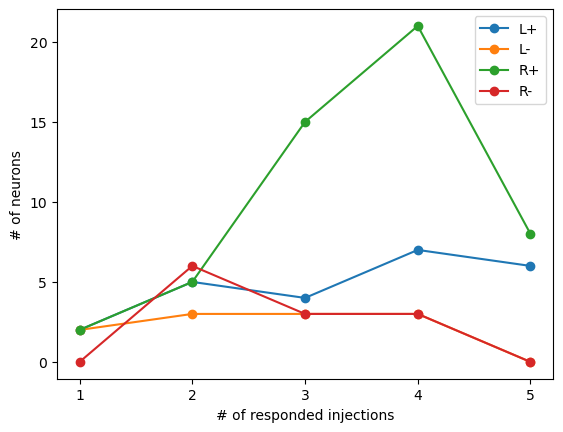

In [73]:
x = [1, 2, 3, 4, 5]

plt.plot(x, n_of_pulse_responses_L_act, label='L+', marker='o')
plt.plot(x, n_of_pulse_responses_L_inh, label='L-', marker='o')
plt.plot(x, n_of_pulse_responses_R_act, label='R+', marker='o')
plt.plot(x, n_of_pulse_responses_R_inh, label='R-', marker='o')

plt.xticks(x)
plt.legend()
plt.ylabel('# of neurons')
plt.xlabel('# of responded injections')
plt.show()

In [74]:
# Injection order of pulse responses

def injection_order_of_pulses(df):
    count_1 = 0
    count_2 = 0
    count_3 = 0
    count_4 = 0
    count_5 = 0

    for i in d:
        for inj in i:
            if inj[0] == 1:
                count_1 += 1
            elif inj[0] == 2:
                count_2 += 1
            elif inj[0] == 3:
                count_3 += 1
            elif inj[0] == 4:
                count_4 += 1
            elif inj[0] == 5:
                count_5 += 1

    print(count_1, count_2, count_3, count_4, count_5)
    return [count_1, count_2, count_3, count_4, count_5]

print('Left, activated')
d = left_df[(left_df['activated'] == True)]['pulse_response']
inj_order_pulses_L_act = injection_order_of_pulses(d)

print('\nLeft, inhibited')
d = left_df[(left_df['inhibited'] == True)]['pulse_response']
inj_order_pulses_L_inh = injection_order_of_pulses(d)

print('\nRight, activated')
d = right_df[(right_df['activated'] == True)]['pulse_response']
inj_order_pulses_R_act = injection_order_of_pulses(d)

print('\nRight, inhibited')
d = right_df[(right_df['inhibited'] == True)]['pulse_response']
inj_order_pulses_R_inh = injection_order_of_pulses(d)


Left, activated
22 15 15 20 10

Left, inhibited
6 3 7 7 6

Right, activated
38 38 25 41 39

Right, inhibited
7 8 6 6 6


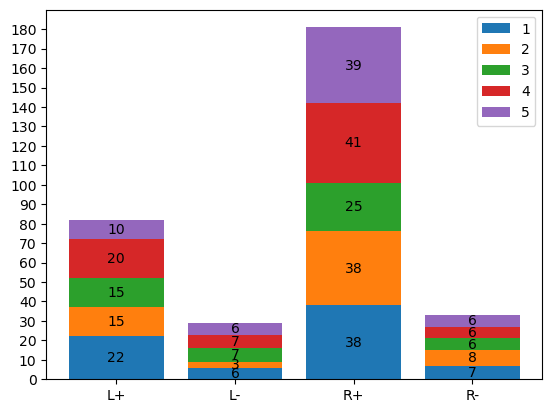

In [75]:
x = ['L+', 'L-', 'R+', 'R-']

injection_orders = [inj_order_pulses_L_act, inj_order_pulses_L_inh, inj_order_pulses_R_act, inj_order_pulses_R_inh]

for i, val in enumerate(inj_order_pulses_L_act):
	if i == 0:
		y1 = np.array([inj[i] for inj in injection_orders])
	elif i == 1:
		y2 = np.array([inj[i] for inj in injection_orders])
	elif i == 2:
		y3 = np.array([inj[i] for inj in injection_orders])
	elif i == 3:
		y4 = np.array([inj[i] for inj in injection_orders])
	elif i == 4:
		y5 = np.array([inj[i] for inj in injection_orders])

p1 = plt.bar(x, y1, label='1')
p2 = plt.bar(x, y2, bottom=y1, label='2')
p3 = plt.bar(x, y3, bottom=y1+y2, label='3')
p4 = plt.bar(x, y4, bottom=y1+y2+y3, label='4')
p5 = plt.bar(x, y5, bottom=y1+y2+y3+y4, label='5')

plt.bar_label(p1, labels=[str(n) if n != 0 else '' for n in y1], label_type='center')
plt.bar_label(p2, labels=[str(n) if n != 0 else '' for n in y2], label_type='center')
plt.bar_label(p3, labels=[str(n) if n != 0 else '' for n in y3], label_type='center')
plt.bar_label(p4, labels=[str(n) if n != 0 else '' for n in y4], label_type='center')
plt.bar_label(p5, labels=[str(n) if n != 0 else '' for n in y5], label_type='center')

maxs = [np.sum(inj) for inj in injection_orders]

plt.yticks(np.arange(np.max(maxs), step=10))
plt.legend()
plt.show()

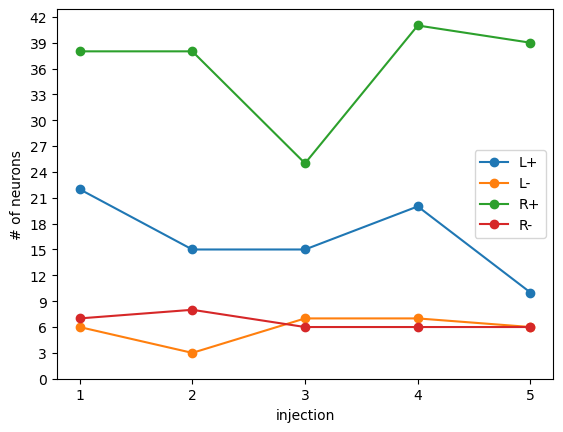

In [76]:
x = [1, 2, 3, 4, 5]

plt.plot(x, inj_order_pulses_L_act, label='L+', marker='o')
plt.plot(x, inj_order_pulses_L_inh, label='L-', marker='o')
plt.plot(x, inj_order_pulses_R_act, label='R+', marker='o')
plt.plot(x, inj_order_pulses_R_inh, label='R-', marker='o')

plt.xticks(x)
plt.yticks(np.arange(np.max([np.max(inj) for inj in injection_orders])+3, step=3))
plt.legend()
plt.ylabel('# of neurons')
plt.xlabel('injection')
plt.show()

In [77]:
fish.fps

1.3039181000348583

Left fish: [38 40]
Right fish: [37 39 42]


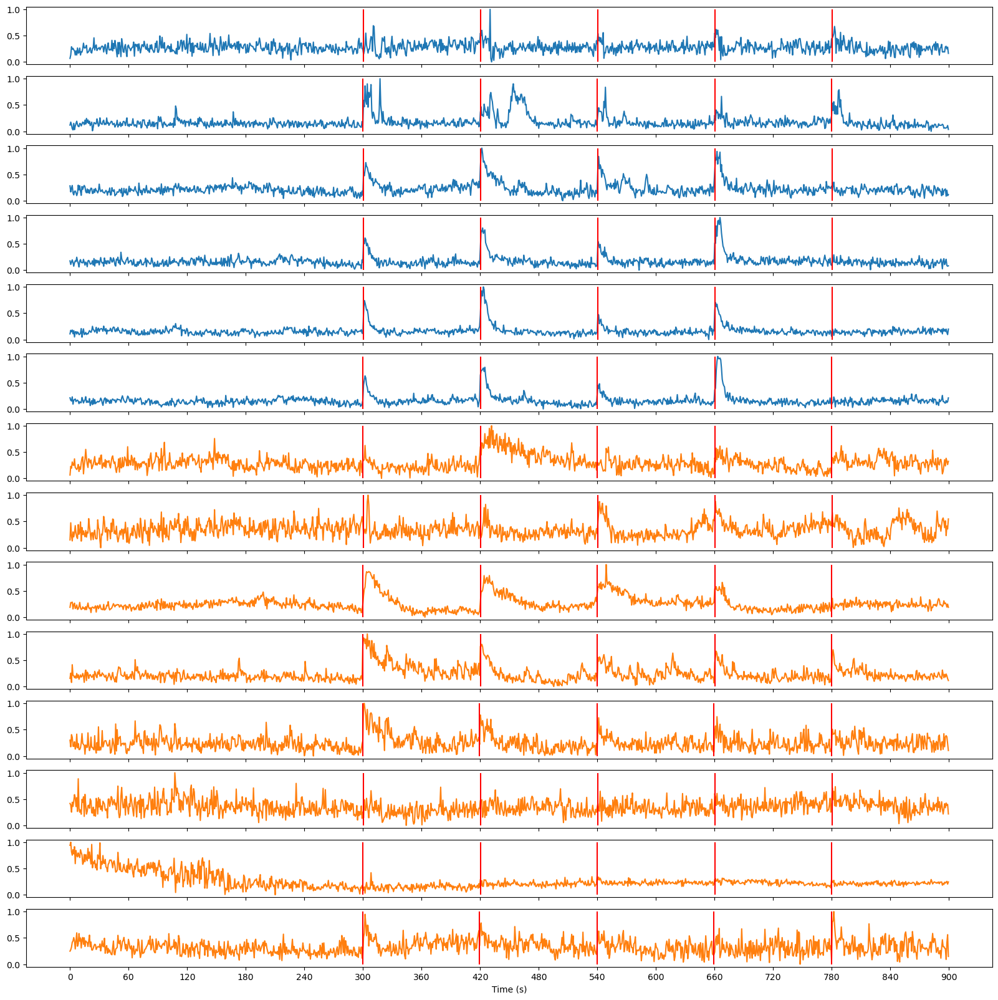

In [78]:
# Neurons that respond to all 5 injections

key = 'raw_norm_temporal'

d = left_df[left_df['responsive'] == True]
dr = right_df[right_df['responsive'] == True]

traces = list()
pulse_frames = list()

left_fish = list()
for i, row in d.iterrows():
	if len(row['pulse_response']) == 5:
		traces.append(row[key])
		pulse_frames.append(row['pulse_frames'])
		left_fish.append(row['fish_id'])

right_fish = list()
for i, row in dr.iterrows():
	if len(row['pulse_response']) == 5:
		traces.append(row[key])
		pulse_frames.append(row['pulse_frames'])
		right_fish.append(row['fish_id'])
        
print(f'Left fish: {np.unique(left_fish)}')
print(f'Right fish: {np.unique(right_fish)}')

fig, axes = plt.subplots(len(traces), 1, sharex=True, sharey=True, figsize=(20, 20))
for i, t in enumerate(traces):
	if i < len(left_fish):
		axes[i].plot(t)
	else:
		axes[i].plot(t, color='tab:orange')
        
	for pulse in pulse_frames[i]:
		axes[i].vlines(pulse, 0, 1, color='r')

ticks = np.arange(0, 16*60*1.3039181000348583, 60*1.3039181000348583)
plt.xticks(ticks=ticks, labels=np.round(ticks/fish.fps).astype(int))
plt.xlabel('Time (s)')
plt.show()